<center> <h1> A2Z Insurance - Data Mining Project </h1> </center> <br>
<center> <h2> Group Z </h2> </center> <br>

## General Context

Finding new customers is vital in every industry. The process for finding new customers begins by
learning as much as possible from the existing customers. Understanding current customers allow
organizations to identify groups of customers that have different product interests, different market
participation, or different response to marketing efforts. With this, we will be able not only to serve
better our customers, but also to improve the targeting of prospective customers.
Market segmentation, the process of identifying customers’ groups, makes use of geographic, demographic, psychographic, and behavioral characteristics of customers. By understanding the differences
between the different segments, organizations can make better strategic choices about opportunities,
product definition, positioning, promotions, pricing, and target marketing.

## Business Situation

A2Z Insurance (A2Z) is a portuguese long standing insurance company that serves a wide array of
insurance services: Motor, Household, Health, Life and Work Compensation. Although A2Z primarily
serves portuguese customers, a significant portion of their customer acquisition comes from their web
site. Customers can sign up to A2Z services through their branches, by telephone, or on the web site.
In 2016, A2Z became one of the largest insurers in Portugal. However, the lack of a data driven
culture in the company ultimately led to poorly maintained databases over the years. A2Z is trying to
make better use of the database it has regarding its customers. So far, it has simply mass-marketed
everything. All potential and existing customers get the same promotions, and there are no attempts to
identify target markets for cross-selling opportunities. Now, A2Z wants start differentiating customers,
and developing more focused programs.
A2Z provided you an ABT (Analytic Based Table) with data regarding a sample of 10.290 Customers
from its active database. These are customers that had at least one insurance service with the company
at the time the dataset was extracted. Your job is to segment the database and find the relevant
clusters of customers. To do this, we suggest you segment the customers using different perspectives
and approaches, as well as combine and analyze the results. A2Z would like to understand the value
and demographics of each customer segment, as well as understand which types of insurance they will
be more interested in buying.

## Metadata

- *ID* - ID
- *First Policy* -  Year of the customer’s first policy
- *Birthday* - Customer’s Birthday Year
- *Education* - Academic Degree
- *Salary* - Gross monthly salary (€)
- *Area* - Living area
- *Children* - Binary variable (Y=1)
- *CMV* - Customer Monetary Value
- *Claims* - Claims Rate
- *Motor* - Premiums (€) in LOB: Motor
- *Household* - Premiums (€) in LOB: Household
- *Health* - Premiums (€) in LOB: Health
- *Life* - Premiums (€) in LOB: Life
- *Work Compensation* - Premiums (€) in LOB: Work Compensations

1. Preprocessing: Before clustering the data, it may be necessary to preprocess it to make it more suitable for analysis. This can include tasks such as missing value imputation, scaling, and outlier removal.

2. Choosing a similarity measure: To group data points into clusters, you need to define what it means for two data points to be similar. This is typically done using a similarity measure, such as Euclidean distance or cosine similarity.

3. Deciding on the number of clusters: Before you can start clustering, you need to decide on the number of clusters you want to create. This can be done using techniques such as the elbow method or the silhouette method.

4. Applying a clustering algorithm: Once you have preprocessed the data and chosen a similarity measure and the number of clusters, you can apply a clustering algorithm to group the data points into clusters. Some common clustering algorithms include k-means, hierarchical clustering, and DBSCAN.

5. Evaluating the clusters: After the clustering algorithm has run, it's important to evaluate the resulting clusters to see how well they represent the data. This can be done using metrics such as the adjusted Rand index or the silhouette score.

6. Visualizing the clusters: Finally, it can be helpful to visualize the clusters using techniques such as scatter plots or parallel coordinates plots to get a sense of how the data points are distributed within each cluster.

# Table of Contents

* [1. Initial Treatment](#InitialTreatment)
    * [1.1. Import](#Import)
    * [1.2. Functions](#Functions)
* [2. Data Exploration](#DataExploration)
    * [2.1. Coherence Check](#CoherenceCheck)
        * [2.1.1. General Exploration](#GeneralExploration)
        * [2.1.2. Feature Exploration](#FeatureExploration)
            * [A. FirstPolYear](#FirstPolYear)
            * [B. BirthYear](#BirthYear)
            * [C. EducDeg](#EducDeg)
            * [D. MonthSal](#MonthSal)
            * [E. GeoLivArea](#GeoLivArea)
            * [F. Children](#Children)
            * [G. CustMonVal](#CustMonVal)
            * [H. ClaimsRate](#ClaimsRate)
            * [I. PremMotor](#PremMotor)
            * [J. PremHousehold](#PremHousehold)
            * [K. PremHealth](#PremHealth)
            * [L. PremLife](#PremLife)
            * [M. PremWork](#PremWork)
* [3. Data Pre-Processing](#DataPre-Processing)
    * [3.1. Missing and inconsistent values](#Missingandinconsistentvalues)
    * [3.2. Feature Engineering](#FeatureEngineering)
    * [3.3. Handling outliers](#Handlingoutliers)
    * [3.4. Repeated Data Exploration](#RepeatetDataExploration)
    * [3.5. Variable Selection](#VariableSelection)
    * [3.6. Feature Scaling](#FeatureScaling)
* [4. Clustering Analysis](#ClusteringAnalysis)
    * [4.1. Demographic Segments](#DemographicSegments)
        * [4.1.1. K-Prototypes](#K-Prototypes)
    * [4.2. Value Segments](#ValueSegments)
        * [4.2.1. Hierarchical + K-Means](#Hierarchical+K-Means)
        * [4.2.2. K-Means](#K-Means)
        * [4.2.3. DB-Scan](#DB-Scan)
        * [4.2.4. Mean Shift Clustering](#MeanShiftClustering)
        * [4.2.5. Gaussian Mixture Model](#GaussianMixtureModel)
        * [4.2.6. Self-Organizing Maps](#Self-OrganizingMaps)
    * [4.3. Product Segments](#ProductSegments)
        * [4.3.1. K-Means](#K-Means)
        * [4.3.2. DB-Scan](#DB-Scan)
        * [4.3.3. Mean Shift Clustering](#MeanShiftClustering)
        * [4.3.4. Gaussian Mixture Model](#GaussianMixtureModel)
        * [4.3.5. Self-Organizing Maps](#Self-OrganizingMaps)

<a class="anchor" id="InitialTreatment">

## 1. Initial Treatment

</a>

<a class="anchor" id="Import">

## 1.1. Import

</a>

Import the required libaries.

In [485]:
#!pip install sompy

In [486]:
#!pip install -U git+https://github.com/sevamoo/SOMPY.git

In [487]:
import matplotlib.pyplot as plt
import numpy as np
import scipy as sc
import pandas as pd
from datetime import datetime

#Exploration
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from math import ceil
from pandas_profiling import ProfileReport

#Pre-Processing
from sklearn.preprocessing import OneHotEncoder, StandardScaler, MinMaxScaler, RobustScaler
from sklearn.decomposition import PCA

#Clustering
from sklearn.cluster import DBSCAN, KMeans, AgglomerativeClustering, MeanShift, estimate_bandwidth
from kmodes.kprototypes import KPrototypes
from sklearn.metrics import silhouette_score, silhouette_samples
from collections import Counter
from scipy.cluster.hierarchy import dendrogram
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.impute import KNNImputer
from sklearn.neighbors import NearestNeighbors
from sklearn.mixture import GaussianMixture
from sklearn.manifold import TSNE
import matplotlib.cm as cm
import sompy
from sompy.visualization.mapview import View2D
from sompy.visualization.bmuhits import BmuHitsView
from sompy.visualization.hitmap import HitMapView
from matplotlib.patches import RegularPolygon, Ellipse
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import colorbar, colors as mpl_colors, __version__ as mplver
from matplotlib.lines import Line2D
import itertools
from sklearn.metrics import pairwise_distances

#import umap

Extract the sas data file.

In [488]:
#Defining the dataframe and set the variable customer ID as the index
df = pd.read_sas('a2z_insurance.sas7bdat').set_index("CustID")
# pd.options.display.float_format = '{:,.0f}'.format
df.head()

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
1.0,1985.0,1982.0,b'2 - High School',2177.0,1.0,1.0,380.97,0.39,375.85,79.45,146.36,47.01,16.89
2.0,1981.0,1995.0,b'2 - High School',677.0,4.0,1.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
3.0,1991.0,1970.0,b'1 - Basic',2277.0,3.0,0.0,504.67,0.28,206.15,224.50,124.58,86.35,99.02
4.0,1990.0,1981.0,b'3 - BSc/MSc',1099.0,4.0,1.0,-16.99,0.99,182.48,43.35,311.17,35.34,28.34
5.0,1986.0,1973.0,b'3 - BSc/MSc',1763.0,4.0,1.0,35.23,0.90,338.62,47.80,182.59,18.78,41.45


In [489]:
df_original = df.copy()

<a class="anchor" id="Functions">

## 1.2. Functions

</a>

Functions for Data Exploration

In [490]:
def get_ss(df):
    """Computes the sum of squares for all variables given a dataset
    """
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

def r2(df, labels):
    sst = get_ss(df)
    ssw = np.sum(df.groupby(labels).apply(get_ss))
    return 1 - ssw/sst
    
def get_r2_scores(df, clusterer, min_k=2, max_k=10):
    """
    Loop over different values of k. To be used with sklearn clusterers.
    """
    r2_clust = {}
    for n in range(min_k, max_k):
        clust = clone(clusterer).set_params(n_clusters=n)
        labels = clust.fit_predict(df)
        r2_clust[n] = r2(df, labels)
    return r2_clust

In [491]:
# Plotting Countplot and histogram for categorical features.

def visualize_categorical(df, feature, target):
    cont_tab = pd.crosstab(df[feature], df[target], margins = True)
    categories = cont_tab.index[:-1]
        
    fig = plt.figure(figsize=(15, 5))
    
    plt.subplot(121)
    p1 = plt.bar(categories, cont_tab.iloc[:-1, 0].values, 0.55, color="m")
    p2 = plt.bar(categories, cont_tab.iloc[:-1, 1].values, 0.55, bottom=cont_tab.iloc[:-1, 0], color="b")
    plt.legend((p2[0], p1[0]), ('$Yes$', '$No$'))
    plt.title("Frequency bar chart")
    plt.xlabel(feature)
    plt.ylabel("$Frequency$")

    # auxiliary data for 122
    obs_pct = np.array([np.divide(cont_tab.iloc[:-1, 0].values, cont_tab.iloc[:-1, 2].values), 
                        np.divide(cont_tab.iloc[:-1, 1].values, cont_tab.iloc[:-1, 2].values)])
      
    plt.subplot(122)
    p1 = plt.bar(categories, obs_pct[0], 0.55, color="m")
    p2 = plt.bar(categories, obs_pct[1], 0.55, bottom=obs_pct[0], color="b")
    plt.legend((p2[0], p1[0]), ('$Yes$', '$No$'))
    plt.title("Proportion bar chart")
    plt.xlabel(feature)
    plt.ylabel("$p$")

    plt.show()

In [492]:
# Plotting Histogram and Boxplot for numerical features.

def visualize_numerical(dataset, target):
    
    ''' Visualizes the numerical features with a boxplot and histogram.

    # Arguments:
    dataset, pd DataFrame: input dataframe
    target, pd Series: target variable for hue colouring

    # Results:
    Shows the boxplot and histogram.
    
    '''
    
    figure, axis = plt.subplots(1, 2, figsize=(12, 6))
  
    sns.boxplot(ax= axis[0], x=target, y=dataset, hue=target, dodge=False)
    axis[0].set_title(f"Boxplot of {dataset.name}", fontdict= {"fontsize": 14})
    
    sns.histplot(ax= axis[1], x=dataset, kde=True, hue=target)
    axis[1].set_title(f"Histogram of {dataset.name}", fontdict= {"fontsize": 14})

    plt.show()
    

#### Functions for Data Pre-Processing

In [493]:
# Capping Functions
# https://wellsr.com/python/outlier-data-handling-with-python/#:~:text=Capping%20Outliers%20using%20Fixed%20Quantiles&text=In%20such%20cases%20you%20can,the%20records%20in%20the%20dataset.

def outlier_capping(data, outlier_features):

    ''' Caps outliers using the IQR ranges to replace outlier values with a maximum
    or minimum capped value.

    # Arguments:
    data,. pd Dataframe: Input dataframe
    outlier_features, list: feature names with outliers

    # Returns:
    data, pd Dataframe: dataframe with capped outliers
    '''

    # Loops through each feature with outliers.
    for feature in outlier_features:

            # Defines the first and third quantile of each feature.
            Q1 = data[feature].quantile(0.25)
            Q3 = data[feature].quantile(0.75)

            # Calculating the IQR range.
            IQR = Q3 - Q1

            # Calculating the lower and upper whisker
            lower_whisker = Q1 - (1.5 * IQR)
            upper_whisker = Q3 + (1.5 * IQR)

            # Replaces all values below the lower whisker and
            # above the upper whisker with the lower or upper whisker values.
            data[feature] = np.where(data[feature] > upper_whisker, upper_whisker,
                            np.where(data[feature] < lower_whisker, lower_whisker,
                            data[feature]))
    return data

In [494]:
def scale_data(data, numerical_features, scaler):
    
    """ Applies a given scaler to numerical features.

    # Arguments:
    data, pd DataFrame: Input dataframe
    numerical_features, list: List with column names
    scaler, sklearn scaler object: Scaler object from scikit-learn library.

    # Returns:
    merged_dataframe, pd DataFrame: Input dataframe with scaled numerical features.

    """

    # Transforms the numerical features of the dataset and saves them
    # in a new dataframe.
    scaled_df = pd.DataFrame(scaler.fit_transform(data[numerical_features]), 
                                index=data.index, 
                                columns=scaler.get_feature_names_out()
                             )

    # Drops the numerical features from old dataset and merges with
    # scaled features.
    merged_dataframe = scaled_df.merge(data.drop(numerical_features, axis=1), how="right", left_index=True, right_index=True)

    return scaled_df

In [495]:
def return_scaled_datasets(data, numerical_features):
    
    ''' Applies each scaler on the dataframe and saves the dataframe in a dictionary. \n
    The different scaled dataframes can be accessed via following keys:
    - "standard": StandardScaler(),
    - "minmax": MinMaxScaler()
    - "minmaxminus": MinMaxScaler(feature_range=(-1,1)
    - "robust": RobustScaler()
    
    # Arguments:
    data, pd DataFrame: Input dataframe
    numerical_features, list: List with column names

    # Returns:
    dict_scaled_datasets, dictionary: Dictionary with scaled dataframes.

    '''

    # Initialize a dictionary of different scalers,
    # which should be applied on the given dataset.
    # Key is the scaler name and values the sklearn object.
    scaler_dict = {"standard": StandardScaler(), 
                    "minmax": MinMaxScaler(), 
                    "robust": RobustScaler(), 
                    "minmaxminus": MinMaxScaler(feature_range=(-1,1))
                    }

    # Defines a empty dictionary for later usage.
    dict_scaled_datasets = {}

    # Loops through every scaler and calls the function
    # scale_data() which returns a dataset, scaled with the
    # currently iterated scaler.
    # The scaled dataset is stored in the dictionary, where
    # the key is the scaler key and values a list with the dataframe.
    for key in scaler_dict:

        scal_dataset = scale_data(data, 
                                  numerical_features, 
                                  scaler_dict.get(key)
                                  )

        dict_scaled_datasets[key] = [scal_dataset] 

    return dict_scaled_datasets

#### Functions for Clustering

In [496]:
def get_r2_hc(df, link_method, max_nclus, min_nclus=1, dist="euclidean"):
    """This function computes the R2 for a set of cluster solutions given by the application of a hierarchical method.
    The R2 is a measure of the homogenity of a cluster solution. It is based on SSt = SSw + SSb and R2 = SSb/SSt. 
    
    Parameters:
    df (DataFrame): Dataset to apply clustering
    link_method (str): either "ward", "complete", "average", "single"
    max_nclus (int): maximum number of clusters to compare the methods
    min_nclus (int): minimum number of clusters to compare the methods. Defaults to 1.
    dist (str): distance to use to compute the clustering solution. Must be a valid distance. Defaults to "euclidean".
    
    Returns:
    ndarray: R2 values for the range of cluster solutions
    """
    def get_ss(df):
        ss = np.sum(df.var() * (df.count() - 1))
        return ss  # return sum of sum of squares of each df variable
    
    sst = get_ss(df)  # get total sum of squares
    
    r2 = []  # where we will store the R2 metrics for each cluster solution
    
    for i in range(min_nclus, max_nclus+1):  # iterate over desired ncluster range
        cluster = AgglomerativeClustering(n_clusters=i, affinity=dist, linkage=link_method)
        
        
        hclabels = cluster.fit_predict(df) #get cluster labels
        
        
        df_concat = pd.concat((df, pd.Series(hclabels, name='labels')), axis=1)  # concat df with labels
        
        
        ssw_labels = df_concat.groupby(by='labels').apply(get_ss)  # compute ssw for each cluster labels
        
        
        ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
        
        
        r2.append(ssb / sst)  # save the R2 of the given cluster solution
        
    return np.array(r2)

In [497]:
class kmeans:
    def kmeans_cluster(self,data_scal,data,features, n_clusters,perplexity):
        # Create a KMeans model with the specified number of clusters
        kmeans = KMeans(n_clusters=n_clusters, random_state=42,n_init=20,init='k-means++',max_iter=1000)
        # Fit the model to the data
        kmeans = kmeans.fit(data_scal[features])
        # Predict the cluster labels for new data
        labels = kmeans.predict(data_scal[features])
        # Create a new data frame by concatenating the original data with the cluster labels
        df_concat = pd.concat((data[features], pd.Series(labels, name='labels')), axis=1)
        # Return the mean of each cluster
        
        #Use TSNE to transform the data
        two_dim = TSNE(random_state=42, perplexity=perplexity,n_jobs=-1).fit_transform(data_scal[features])

        # Create a data frame from the transformed data
        df_tsne = pd.DataFrame(two_dim)
        # Plot the data using scatter plot

        df_tsne.plot.scatter(x=0, y=1, color=labels, colormap='tab10',figsize=(15,10))
        plt.show()
        
        
        sst = get_ss(df_concat[features])  # get total sum of squares
        ssw_labels = df_concat[features + ["labels"]].groupby(by='labels').apply(get_ss)  # compute ssw for each cluster labels
        ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
        r2 = ssb / sst
        r2
        
        return df_concat.groupby('labels').mean(),r2,df_concat
    
    
    
    
    def labels(self,data,features, n_clusters):
        # Create a KMeans model with the specified number of clusters
        kmeans = KMeans(n_clusters=n_clusters, random_state=42,n_init=20,init='k-means++',max_iter=1000)
        # Fit the model to the data
        kmeans = kmeans.fit(data[features])
        labels = kmeans.predict(data[features])
        return labels
    def inertia_plot(self,data_list, min_k, max_k):
 
          # Loop through the list of datasets
        for data in data_list:
            # Create an empty list to store the inertia values
            inertias = []
    
            # Loop through the range of values of k
            for k in range(min_k, max_k+1):
              # Create a KMeans model with the current value of k
              model = KMeans(n_clusters=k,random_state=42)
      
              # Fit the model to the data
              model.fit(data)
      
              # Append the inertia value to the list
              inertias.append(model.inertia_)

            # Create a figure and axis
            fig, ax = plt.subplots()
        
            # Plot the inertia values
            ax.plot(range(min_k, max_k+1), inertias, '-o')

            # Add a title and axis labels
            ax.set_title('Inertia Plot')
            ax.set_xlabel('Number of clusters (k)')
            ax.set_ylabel('Inertia')

            # Show the plot
            plt.show()
    def inertia(self,scalers,range_,features):   
        '''Plots a graph with the inertia for different number of cluster'''
        x=0
        inertia_total = {}
        for scal in scalers: 
            inertia=[]
            for n_clus in range(2,range_):  # iterate over desired ncluster range
                kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
                kmclust.fit(scal[features])
                inertia.append(kmclust.inertia_) # save the inertia of the given cluster solution
            inertia_total[x] = inertia
            x=+1
            
        # The inertia plot
        #plt.figure(figsize=(9,5))
        #sns.lineplot(x=[2,3,4,5,6,7,8,9],y=inertia)
        #plt.ylabel("Inertia: SSw")
        #plt.xlabel("Number of clusters")
        #plt.title("Inertia plot over clusters", size=15)
        #plt.show()
        return inertia_total
    def silhouette(self,range_,data,features):
        # Storing average silhouette metric
        avg_silhouette = []
        for nclus in range(1,range_):
            # Skip nclus == 1
            if nclus == 1:
                continue

            # Create a figure
            fig = plt.figure(figsize=(13, 7))

            # Initialize the KMeans object with n_clusters value and a random generator
            # seed of 10 for reproducibility.
            kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
            cluster_labels = kmclust.fit_predict(data[features])

            # The silhouette_score gives the average value for all the samples.
            # This gives a perspective into the density and separation of the formed clusters
            silhouette_avg = silhouette_score(data[features], cluster_labels)
            avg_silhouette.append(silhouette_avg)
            print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

            # Compute the silhouette scores for each sample
            sample_silhouette_values = silhouette_samples(data[features], cluster_labels)

            y_lower = 10
            for i in range(nclus):
                # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
                ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
                ith_cluster_silhouette_values.sort()

                # Get y_upper to demarcate silhouette y range size
                size_cluster_i = ith_cluster_silhouette_values.shape[0]
                y_upper = y_lower + size_cluster_i

                # Filling the silhouette
                color = cm.nipy_spectral(float(i) / nclus)
                plt.fill_betweenx(np.arange(y_lower, y_upper),
                                  0, ith_cluster_silhouette_values,
                                  facecolor=color, edgecolor=color, alpha=0.7)

                # Label the silhouette plots with their cluster numbers at the middle
                plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

                # Compute the new y_lower for next plot
                y_lower = y_upper + 10  # 10 for the 0 samples

            plt.title("The silhouette plot for the various clusters.")
            plt.xlabel("The silhouette coefficient values")
            plt.ylabel("Cluster label")

            # The vertical line for average silhouette score of all the values
            plt.axvline(x=silhouette_avg, color="red", linestyle="--")

            # The silhouette coefficient can range from -1, 1
            xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
            plt.xlim([xmin, xmax])

            # The (nclus+1)*10 is for inserting blank space between silhouette
            # plots of individual clusters, to demarcate them clearly.
            #plt.ylim([0, len(df[features]) + (nclus + 1) * 10])

            plt.yticks([])  # Clear the yaxis labels / ticks
            plt.xticks(np.arange(xmin, xmax, 0.1))
            # The average silhouette plot
    def plot_silhouette(self,range_,data,features):
        # Storing average silhouette metric
        avg_silhouette = []
        for nclus in range(1,range_):
            # Skip nclus == 1
            if nclus == 1:
                continue

            # Initialize the KMeans object with n_clusters value and a random generator
            # seed of 10 for reproducibility.
            kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
            cluster_labels = kmclust.fit_predict(data[features])

            # The silhouette_score gives the average value for all the samples.
            # This gives a perspective into the density and separation of the formed clusters
            silhouette_avg = silhouette_score(data[features], cluster_labels)
            avg_silhouette.append(silhouette_avg)

            # Compute the silhouette scores for each sample
            sample_silhouette_values = silhouette_samples(data[features], cluster_labels)
        # The average silhouette plot
        # The inertia plot
        sns.lineplot(x=[2,3,4,5,6,7,8,9],y=avg_silhouette)
        plt.ylabel("Average silhouette")
        plt.xlabel("Number of clusters")
        plt.title("Average silhouette plot over clusters", size=15)
        plt.show()


In [498]:
def silhouette_score_kproto(df, n_clusters,categorical_features):
    kproto = KPrototypes(n_clusters=n_clusters, init='Cao', verbose=2)
    clusters = kproto.fit_predict(df, categorical=categorical_features)
    silhouette_avg = silhouette_score(df, clusters)
    return silhouette_avg

In [499]:
class hierarchical:  
    
    def get_r2_hc(self,df, link_method=["ward", "complete", "average", "single"], max_nclus=10, min_nclus=1, dist="euclidean"):
        """This function computes the R2 for a set of cluster solutions given by the application of a hierarchical method.
        The R2 is a measure of the homogenity of a cluster solution. It is based on SSt = SSw + SSb and R2 = SSb/SSt. 

        Parameters:
        df (DataFrame): Dataset to apply clustering
        link_method (str): either "ward", "complete", "average", "single"
        max_nclus (int): maximum number of clusters to compare the methods
        min_nclus (int): minimum number of clusters to compare the methods. Defaults to 1.
        dist (str): distance to use to compute the clustering solution. Must be a valid distance. Defaults to "euclidean".

        Returns:
        ndarray: R2 values for the range of cluster solutions
        """
        def get_ss(self,df):
            ss = np.sum(df.var() * (df.count() - 1))
            return ss  # return sum of sum of squares of each df variable

        sst = get_ss(df)  # get total sum of squares

        r2 = []  # where we will store the R2 metrics for each cluster solution

        for i in range(min_nclus, max_nclus+1):  # iterate over desired ncluster range
            cluster = AgglomerativeClustering(n_clusters=i, affinity=dist, linkage=link_method)


            hclabels = cluster.fit_predict(df) #get cluster labels


            df_concat = pd.concat((df, pd.Series(hclabels, name='labels')), axis=1)  # concat df with labels


            ssw_labels = df_concat.groupby(by='labels').apply(get_ss)  # compute ssw for each cluster labels


            ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB


            r2.append(ssb / sst)  # save the R2 of the given cluster solution

        return np.array(r2)
    def r2_plot(self,df):
        # Prepare input
        hc_methods = ["ward", "complete", "average", "single"]
        # Call function defined above to obtain the R2 statistic for each hc_method
        max_nclus = 10
        r2_hc_methods = np.vstack(
            [
                get_r2_hc(df=df, link_method=link, max_nclus=max_nclus) 
                for link in hc_methods
            ]
        ).T
        r2_hc_methods = pd.DataFrame(r2_hc_methods, index=range(1, max_nclus + 1), columns=hc_methods)

        sns.set()
        # Plot data
        fig = plt.figure(figsize=(11,5))
        sns.lineplot(data=r2_hc_methods, linewidth=2.5, markers=["o"]*4)

        # Finalize the plot
        fig.suptitle("R2 plot for various hierarchical methods", fontsize=21)
        plt.gca().invert_xaxis()  # invert x axis
        plt.legend(title="HC methods", title_fontsize=11)
        plt.xticks(range(1, max_nclus + 1))
        plt.xlabel("Number of clusters", fontsize=13)
        plt.ylabel("R2 metric", fontsize=13)

        plt.show()


    def clust(self,df,linkage, distance,n_clus):
        hclust = AgglomerativeClustering(linkage=linkage, affinity=distance, n_clusters=n_clus)
        hc_labels = hclust.fit_predict(df)
        df_concat = pd.concat((df, pd.Series(hc_labels, name='labels')), axis=1)
        return df_concat.groupby('labels').mean()
        
    def dendogram(self,df,linkage,distance,y_threshold = 5):
        # Adapted from:
        # https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html#sphx-glr-auto-examples-cluster-plot-agglomerative-dendrogram-py

        
        hclust = AgglomerativeClustering(linkage=linkage, affinity=distance, distance_threshold=0, n_clusters=None)
        
        
        hclust.fit_predict(df)
        
        # create the counts of samples under each node (number of points being merged)
        counts = np.zeros(hclust.children_.shape[0])
        n_samples = len(hclust.labels_)

        # hclust.children_ contains the observation ids that are being merged together
        # At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
        for i, merge in enumerate(hclust.children_):
            # track the number of observations in the current cluster being formed
            current_count = 0
            for child_idx in merge:
                if child_idx < n_samples:
                    # If this is True, then we are merging an observation
                    current_count += 1  # leaf node
                else:
                    # Otherwise, we are merging a previously formed cluster
                    current_count += counts[child_idx - n_samples]
            counts[i] = current_count

        # the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
        # the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
        # the counts indicate the number of points being merged (dendrogram's x-axis)
        linkage_matrix = np.column_stack(
            [hclust.children_, hclust.distances_, counts]
        ).astype(float)

        # Plot the corresponding dendrogram
        sns.set()
        fig = plt.figure(figsize=(11,5))
        # The Dendrogram parameters need to be tuned
        y_threshold = y_threshold
        dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
        plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
        plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
        plt.xlabel('Number of points in node (or index of point if no parenthesis)')
        plt.ylabel(f'{distance.title()} Distance', fontsize=13)
        plt.show()
        
        
    def visualize_clusters(self,df,perplexity,linkage,distance,n_clus):
        
        hclust = AgglomerativeClustering(linkage=linkage, affinity=distance, n_clusters=n_clus)
        hc_labels = hclust.fit_predict(df)
        
             #Use TSNE to transform the data
        two_dim = TSNE(random_state=42, perplexity=perplexity,n_jobs=-1).fit_transform(df)

        # Create a data frame from the transformed data
        df_tsne = pd.DataFrame(two_dim)

        # Plot the data using scatter plot

        df_tsne.plot.scatter(x=0, y=1, color=hc_labels, colormap='tab10',figsize=(15,10))
        plt.show()

In [500]:
class MSC:
    
    def bandwidth(self,df,metric_features,range1,range2,step):
        # The following bandwidth can be automatically detected using (we need to set quantile though)
        # Based on distance to nearest neighbors for all observations
        list_plot = []
        for i in np.arange(range1, range2, step):
            bandwidth = estimate_bandwidth(df[metric_features], quantile=i, random_state=1, n_jobs=-1)
            ms = MeanShift(bandwidth=bandwidth, bin_seeding=True, n_jobs=-1)
            ms_labels = ms.fit_predict(df[metric_features])
            ms_n_clusters = len(np.unique(ms_labels))

            df_concat = pd.concat([df[metric_features], pd.Series(ms_labels, index=df.index, name="ms_labels")], axis=1)
            sst = get_ss(df[metric_features])  # get total sum of squares
            ssw_labels = df_concat.groupby(by='ms_labels').apply(get_ss)  # compute ssw for each cluster labels
            ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
            r2 = ssb / sst

            list_plot.append([bandwidth,i,ms_n_clusters,r2])

        df_band = pd.DataFrame(list_plot,columns=['bandwidth','quantile','n_clusters','r2'])
        #sns.lineplot(x=df_band['quantile'],y=df_band['n_clusters'])
        return df_band.set_index('quantile')
    
    
    def mean_shift_labels(self,df,df_unscaled, features, quantile):
        '''Calculates the bandwith and the number of clusters of a dataset

        Arguments:
        dataset: the input dataset
        features: the feature list we want to use
        quantile: The quantile parameter specifies which quantile of the pairwise distances between 
                  data points should be used to determine the bandwidth

        returns: Bandwith and Number of clusters'''

        bandwidth = estimate_bandwidth(df[features], quantile=quantile, random_state=1, n_jobs=-1)
        ms = MeanShift(bandwidth=bandwidth, bin_seeding=True, n_jobs=-1)
        ms_labels = ms.fit_predict(df[features])


        df_concat = pd.concat([df_unscaled[features], pd.Series(ms_labels, index=df_unscaled.index, name="ms_labels")], axis=1)
        # Fit the mean shift clustering model to the data and predict the cluster labels

        df_concat_ss = pd.concat([df[features], pd.Series(ms_labels, index=df.index, name="ms_labels")], axis=1)
        
        ms_n_clusters = len(np.unique(ms_labels))
        
        
        
        # Calculate the sum of squares for the entire dataset
        sst = get_ss(df[features])

        # Calculate the sum of squares for each cluster
        ssw_labels = df_concat_ss.groupby(by='ms_labels').apply(get_ss)

        # Calculate the sum of squares between the clusters
        ssb = sst - np.sum(ssw_labels)

        # Calculate the R^2
        r2 = ssb / sst
        
        return df_concat.groupby('ms_labels').mean(),Counter(ms_labels),print("Cluster solution with R^2 of %0.4f" % r2)
    
    def mean_shift_tsne(self,dataset, features, quantile, perplexity):
        '''Plots a Tsne-plot of the Mean Shift Clustering and the r2 of the solution

        Arguments:
        dataset: the input dataset
        features: the feature list we want to use
        quantile: The quantile parameter specifies which quantile of the pairwise distances between 
                  data points should be used to determine the bandwidth
        perplexity: perplexity of the plot

        returns:
        tsne-plot of the Mean Shift Clustering and the r2 of the solution'''

        bandwidth = estimate_bandwidth(dataset[features], quantile=quantile, random_state=1, n_jobs=-1)
        ms = MeanShift(bandwidth=bandwidth, bin_seeding=True, n_jobs=-1)
        ms_labels = ms.fit_predict(dataset[features])

        # Calculate the number of clusters
        ms_n_clusters = len(np.unique(ms_labels))

        # Concatenate the cluster labels to the original dataset
        df_concat = pd.concat([dataset[features], pd.Series(ms_labels, index=dataset.index, name="ms_labels")], axis=1)

        # Use TSNE to transform the data
        two_dim = TSNE(random_state=42, perplexity=perplexity, n_jobs=-1).fit_transform(dataset[features])

        # Create a data frame from the transformed data
        df_tsne = pd.DataFrame(two_dim)

        # Plot the data using scatter plot
        plt.figure(figsize=(15,10))
        plt.scatter(df_tsne[0], df_tsne[1], c=ms_labels, cmap='tab10')
        return plt


In [720]:
class density:
    
    def distance(self,df,metric_features,neighbours):
        # K-distance graph to find out the right eps value
        neigh = NearestNeighbors(n_neighbors=neighbours)
        neigh.fit(df[metric_features])
        distances,a = neigh.kneighbors(df[metric_features])
        distances = np.sort(distances[:, -1])
        plt.ylim(0,1)
        plt.plot(distances)
        plt.show()
        distances
    
    def dbscan(self,df,df_unscaled,metric_features,eps,min_samples,metric,algorithm):
        # Fit a DBSCAN model to the data
        dbscan = DBSCAN(eps=eps, min_samples=min_samples,metric=metric,algorithm=algorithm,n_jobs=-1)
        dbscan.fit_predict(df[metric_features])
            
        df_concat = pd.concat([df_unscaled[metric_features], pd.Series(dbscan.labels_, index=df.index, name="dbscan_labels")], axis=1)
            

        # Create a scatter plot of the data points
        plot = plt.scatter(df[metric_features].loc[:, df[metric_features].columns[0]], df[metric_features].loc[:, df[metric_features].columns[1]], c=dbscan.labels_,s=3)
        outliers_df = pd.DataFrame(df[metric_features][dbscan.labels_==-1])
        return plot, np.unique(dbscan.labels_), Counter(dbscan.labels_),df_concat

            

In [502]:
# DBScan
def count_labels_dbscan(dataset, eps, n_samples):
    '''Counts the labels of the DBSCAN clustering'''
    # create a DBSCAN object
    dbscan = DBSCAN(eps=eps, min_samples=n_samples)

    # fit the DBSCAN object to the dataset
    dbscan.fit(dataset)

    # get the labels for each data point
    labels = dbscan.fit_predict(dataset)

    # count the frequency of each label
    label_counts = Counter(labels)

    return label_counts

def k_distance_plot(dataset, features, n_neighbors):
    '''Plots a k-distance plot to find out the best value for epsilon
    
    Arguments: 
    dataset: the input dataset
    features: the feature list we want to use
    n_neighbors: amount of neighbors that should be considered
    
    returns: k-distance plot'''
    # Initialize the NearestNeighbors object
    neigh = NearestNeighbors(n_neighbors=n_neighbors)

    # Fit the NearestNeighbors model to the data
    nbrs = neigh.fit(dataset[features])

    # Get the distances and indices of the nearest neighbors
    distances, indices = nbrs.kneighbors(dataset[features])

    # Sort the distances and select the second column (the distances to the first nearest neighbor)
    distances = np.sort(distances, axis=0)[:,1]

    # Create a figure with the specified size
    plt.figure(figsize=(20,10))

    # Plot the K-distance plot
    plt.plot(distances)

    # Add a title, axis labels, and a legend
    plt.title('K-distance Graph', fontsize=20)
    plt.xlabel('Data Points sorted by distance', fontsize=14)
    plt.ylabel('Epsilon', fontsize=14)

    # Show the plot
    plt.show()

In [503]:
def dbscan_tsne_plot(dataset, features, eps, min_samples,perplexity):
    '''Plots a Tsne-plot of the DBScan and the r2 of the solution
    
    Arguments:
    dataset: the input dataset
    features: the feature list we want to use
    min_samples: MinPts in the neighborhood
    perplexity: perplexity of the plot
    
    returns:
    tsne-plot of DBScan and the r2 of the solution'''
    # Initialize the DBSCAN clustering algorithm
    db = DBSCAN(eps=eps, min_samples=min_samples)

    # Fit the DBSCAN model to the data and predict the cluster labels
    db_labels = db.fit_predict(dataset[features])

    # Calculate the number of clusters
    db_n_clusters = len(np.unique(db_labels))

    # Concatenate the cluster labels to the original dataset
    df_concat = pd.concat([dataset[features], pd.Series(db_labels, index=dataset.index, name="db_labels")], axis=1)
    
    # Use TSNE to transform the data
    two_dim = TSNE(random_state=42,perplexity=perplexity).fit_transform(dataset[features])

    # Create a data frame from the transformed data
    df_tsne = pd.DataFrame(two_dim)

    # Plot the data using scatter plot
    plt.figure(figsize=(15,10))
    plt.scatter(df_tsne[0], df_tsne[1], c=db_labels, cmap='tab10')
    
     # Calculate the sum of squares for the entire dataset
    sst = get_ss(dataset[features])
    
    # Calculate the sum of squares for each cluster
    ssw_labels = df_concat.groupby(by='db_labels').apply(get_ss)
    
    # Calculate the sum of squares between the clusters
    ssb = sst - np.sum(ssw_labels)
    
    # Calculate the R^2
    r2 = ssb / sst
    
    return plt, print("Cluster solution with R^2 of %0.4f" % r2)

In [504]:
def dbscan_umap_plot(dataset, features, eps, min_samples):
    '''Plots a umap of the DBScan
    
    Arguments:
    dataset: the input dataset
    features: the feature list we want to use
    min_samples: MinPts in the neighborhood
    
    returns:
    umap of DBScan'''

    # Initialize the DBSCAN clustering algorithm
    db = DBSCAN(eps=eps, min_samples=min_samples)

    # Fit the DBSCAN model to the data and predict the cluster labels
    db_labels = db.fit_predict(dataset[features])

    # Calculate the number of clusters
    db_n_clusters = len(np.unique(db_labels))

    umap_transformed = umap.UMAP(random_state=42).fit_transform(dataset[features])

    # Create a scatter plot of the UMAP transformation, coloring the points by their cluster label
    plt.scatter(umap_transformed[:, 0], umap_transformed[:, 1], c=db_labels, cmap='tab10')
    plt.show()

In [505]:
# Mean Shift Clustering
def count_labels_mean_shift(dataset, bandwidth):
    '''Counts the labels of the Mean Shift Clustering'''
    # create a MeanShift object
    mean_shift = MeanShift(bandwidth=bandwidth , bin_seeding=True)

    # fit the MeanShift object to the dataset
    mean_shift.fit(dataset)

    # get the labels for each data point
    labels = mean_shift.predict(dataset)

    # count the frequency of each label
    label_counts = Counter(labels)

    return label_counts

def get_silhouette_score(X, algorithm):
    '''Returns the Silhouette score of a clustering algorithm'''
    # Fit the clustering algorithm to the data
    clusterer = algorithm
    clusterer.fit(X)

    # Get the cluster labels
    labels = clusterer.labels_

    # Calculate the silhouette score
    score = silhouette_score(X, labels)

    return score

def count_labels_mean_shift(dataset, quantile):
    '''Counts the values for each label of the mean shift clustering
    
    Arguments: 
    dataset: the inpit dataset
    
    return: labels and amount of values in that label'''
    bandwidth = estimate_bandwidth(dataset, quantile=quantile, n_samples = 300,random_state=1, n_jobs=-1)
    # create a MeanShift object
    mean_shift = MeanShift(bandwidth=bandwidth , bin_seeding=True)

    # fit the MeanShift object to the dataset
    mean_shift.fit(dataset)

    # get the labels for each data point
    labels = mean_shift.predict(dataset)

    # count the frequency of each label
    label_counts = Counter(labels)

    return label_counts

def mean_shift_labels(dataset, features, quantile):
    '''Calculates the bandwith and the number of clusters of a dataset
    
    Arguments:
    dataset: the input dataset
    features: the feature list we want to use
    quantile: The quantile parameter specifies which quantile of the pairwise distances between 
              data points should be used to determine the bandwidth
              
    returns: Bandwith and Number of clusters'''
    
    # Calculate the bandwidth using the distance to the nearest neighbors
    bandwidth = estimate_bandwidth(dataset[features], quantile=quantile, n_samples = 300,random_state=1, n_jobs=-1)

    # Initialize the mean shift clustering algorithm
    ms = MeanShift(bandwidth=bandwidth, bin_seeding=True, n_jobs=4)

    # Fit the mean shift clustering model to the data and predict the cluster labels
    ms_labels = ms.fit_predict(dataset[features])
    ms_n_clusters = len(np.unique(ms_labels))
    
    return "Bandwidth: " + str(bandwidth) +  ",  Number of clusters: " + str(ms_n_clusters)

In [506]:
def mean_shift_tsne(dataset, features, bandwidth, perplexity):
    '''Plots a Tsne-plot of the Mean Shift Clustering and the r2 of the solution
    
    Arguments:
    dataset: the input dataset
    features: the feature list we want to use
    bandwidth: bandwidth of the algorithm
    perplexity: perplexity of the plot
    
    returns:
    tsne-plot of the Mean Shift Clustering and the r2 of the solution'''
   
    # Initialize the mean shift clustering algorithm
    ms = MeanShift(bandwidth=bandwidth, bin_seeding=True, n_jobs=4)

    # Fit the mean shift clustering model to the data and predict the cluster labels
    ms_labels = ms.fit_predict(dataset[features])

    # Calculate the number of clusters
    ms_n_clusters = len(np.unique(ms_labels))

    # Concatenate the cluster labels to the original dataset
    df_concat = pd.concat([dataset[features], pd.Series(ms_labels, index=dataset.index, name="ms_labels")], axis=1)

    # Use TSNE to transform the data
    two_dim = TSNE(random_state=42, perplexity=perplexity, n_jobs=-1).fit_transform(dataset[features])

    # Create a data frame from the transformed data
    df_tsne = pd.DataFrame(two_dim)

    # Plot the data using scatter plot
    plt.figure(figsize=(15,10))
    plt.scatter(df_tsne[0], df_tsne[1], c=ms_labels, cmap='tab10')
    
    # Calculate the sum of squares for the entire dataset
    sst = get_ss(dataset[features])
    
    # Calculate the sum of squares for each cluster
    ssw_labels = df_concat.groupby(by='ms_labels').apply(get_ss)
    
    # Calculate the sum of squares between the clusters
    ssb = sst - np.sum(ssw_labels)
    
    # Calculate the R^2
    r2 = ssb / sst
    
    return plt, print("Cluster solution with R^2 of %0.4f" % r2)

In [507]:
def mean_shift_umap(dataset, features, quantile):
    '''Plots a umap of the Mean Shift Clustering and the r2 of the solution
    
    Arguments:
    dataset: the input dataset
    features: the feature list we want to use
    quantile: The quantile parameter specifies which quantile of the pairwise distances between 
              data points should be used to determine the bandwidth
    
    returns:
    umap of the Mean Shift Clustering and the r2 of the solution'''
    # Calculate the bandwidth using the distance to the nearest neighbors
    bandwidth = estimate_bandwidth(dataset[features], quantile=quantile, random_state=1, n_jobs=-1)

    # Initialize the mean shift clustering algorithm
    ms = MeanShift(bandwidth=bandwidth, bin_seeding=True, n_jobs=4)

    # Fit the mean shift clustering model to the data and predict the cluster labels
    ms_labels = ms.fit_predict(dataset[features])

    # Calculate the number of clusters
    ms_n_clusters = len(np.unique(ms_labels))

    # Concatenate the cluster labels to the original dataset
    df_concat = pd.concat([dataset[features], pd.Series(ms_labels, index=dataset.index, name="ms_labels")], axis=1)

    umap_transformed = umap.UMAP(random_state=42).fit_transform(dataset[features])

    # Create a scatter plot of the UMAP transformation, coloring the points by their cluster label
    plt.scatter(umap_transformed[:, 0], umap_transformed[:, 1], c=ms_labels, cmap='tab10')
    plt.show()
    
    # Calculate the sum of squares for the entire dataset
    sst = get_ss(dataset[features])
    
    # Calculate the sum of squares for each cluster
    ssw_labels = df_concat.groupby(by='ms_labels').apply(get_ss)
    
    # Calculate the sum of squares between the clusters
    ssb = sst - np.sum(ssw_labels)
    
    # Calculate the R^2
    r2 = ssb / sst
    
    return plt, print("Cluster solution with R^2 of %0.4f" % r2)

In [508]:
def count_labels_gmm(data, covariance_type, n_components, init_params):
    '''Counts the labels of the GMM clustering'''
    gmm = GaussianMixture(n_components=n_components, covariance_type=covariance_type, n_init=10, init_params=init_params, random_state=1)
    gmm_labels = gmm.fit_predict(data)
  
    # count the frequency of each label
    label_counts = Counter(gmm_labels)

    return label_counts

def plot_bic_aic_covariance(data, features, n_components):
    '''Plots a AIC and BIC curve of the different covariance types of the dataset 
    
    Arguments:
    dataset: the input dataset
    features: the feature list we want to use
    n_components: a range of clusters we want to compare
    
    returns: Plot of AIC and BIC curve of dataset
    '''
    cov_types = ['spherical', 'diag', 'tied', 'full']
    bic_values = []
    aic_values = []

    for cov_type in cov_types:
        models = [GaussianMixture(n, covariance_type=cov_type, n_init=10, random_state=1).fit(data[features])
                  for n in n_components]
        bic_values.append([m.bic(data[features]) for m in models])
        aic_values.append([m.aic(data[features]) for m in models])

    plt.plot(n_components, bic_values[0], label='BIC (spherical)')
    plt.plot(n_components, bic_values[1], label='BIC (diagonal)')
    plt.plot(n_components, bic_values[2], label='BIC (tied)')
    plt.plot(n_components, bic_values[3], label='BIC (full)')
    plt.plot(n_components, aic_values[0], label='AIC (spherical)')
    plt.plot(n_components, aic_values[1], label='AIC (diagonal)')
    plt.plot(n_components, aic_values[2], label='AIC (tied)')
    plt.plot(n_components, aic_values[3], label='AIC (full)')
    plt.legend(loc='best')
    plt.xlabel('n_components')
    plt.xticks(n_components)
    plt.show()
    


In [509]:
def gmm_clustering(X, features, scalers, clusters, init_params, covariances, random_state=42):
    '''Gets the best hyperparameters for the GMM Clustering
    
    Arguments:
    dataset: input dataset
    features: a list of features
    scalers: different scalers
    clusters: a range of clusters
    init_params: a range of init_params
    covariances: a range of covariances
    
    returns: dataframe with the best Silhouette score'''
    scores = []
    for scaler in scalers:
        # Scale the data using the specified scaler
        if scaler == 'minmax':
            scaler = MinMaxScaler()
        elif scaler == 'minmax_minus':
            scaler = MinMaxScaler(feature_range=(-1, 1))
        elif scaler == 'standard':
            scaler = StandardScaler()
        elif scaler == 'robust':
            scaler = RobustScaler()
        else:
            raise ValueError('Invalid scaler specified')
        X_scaled = scaler.fit_transform(X)
        for n_clusters in clusters:
            for init in init_params:
                for covariance in covariances:
                    # Create and fit a Gaussian mixture model
                    gmm = GaussianMixture(n_components=n_clusters, init_params=init, covariance_type=covariance, random_state=random_state)
                    gmm.fit(X_scaled)
                    # Compute the silhouette score for the model
                    score = silhouette_score(X_scaled, gmm.predict(X_scaled))
                    scores.append({'scaler': scaler, 'n_clusters': n_clusters, 'init_params': init, 'covariance': covariance, 'silhouette_score': score})
    # Sort the scores in descending order by silhouette score
    scores = sorted(scores, key=lambda x: x['silhouette_score'], reverse=True)
    # Return the top 5 scores as a DataFrame
    return pd.DataFrame(scores[:5])

In [510]:
def get_best_r2_score_gmm(df, hyperparameters):
    best_r2_score = -float("inf")  # initialize best r2 score to negative infinity
    best_params = None  # initialize best hyperparameters to None
    for params in hyperparameters:
        gm = GaussianMixture(**params,random_state=42)  # create GaussianMixture model with given hyperparameters
        gm.fit(df)  # fit the model to the data
        labels = gm.predict(df)  # predict labels for data
        r2_ = r2(df, labels)  # get r2 score
        if r2_ > best_r2_score:  # update best r2 score and hyperparameters if necessary
            best_r2_score = r2_
            best_params = params
    return best_r2_score, best_params

In [511]:
def gmm_tsne(dataset, features, n_components, covariance_type, init_params, perplexity):
    '''Plots a Tsne-plot of the GMM Clustering and the r2 of the solution
    
    Arguments:
    dataset: the input dataset
    features: the feature list we want to use
    covariance_type: the type of covariance matrix used to model the distribution of the data within each cluster
    perplexity: perplexity of the plot
    init_params: the method used to initialize the model
    
    returns:
    tsne-plot of the GMM Clustering and the r2 of the solution'''
    
    gmm = GaussianMixture(n_components=n_components, covariance_type=covariance_type, n_init=10, init_params=init_params, random_state=1)
    gmm_labels = gmm.fit_predict(dataset[features])

    # Concatenate the cluster labels to the original dataset
    df_concat = pd.concat([dataset[features], pd.Series(gmm_labels, index=dataset.index, name="gmm_labels")], axis=1)

    # Use TSNE to transform the data
    two_dim = TSNE(random_state=42, perplexity=perplexity, n_jobs=-1).fit_transform(dataset[features])

    # Create a data frame from the transformed data
    df_tsne = pd.DataFrame(two_dim)

    # Plot the data using scatter plot
    plt.figure(figsize=(15,10))
    plt.scatter(df_tsne[0], df_tsne[1], c=gmm_labels, cmap='tab10')
    
    # Calculate the sum of squares for the entire dataset
    sst = get_ss(dataset[features])
    
    # Calculate the sum of squares for each cluster
    ssw_labels = df_concat.groupby(by='gmm_labels').apply(get_ss)
    
    # Calculate the sum of squares between the clusters
    ssb = sst - np.sum(ssw_labels)
    
    # Calculate the R^2
    r2 = ssb / sst
    
    return plt, print("Cluster solution with R^2 of %0.4f" % r2)

In [512]:
#def gmm_tsne(dataset, features,n_components, covariance_type, perplexity):
#    '''Plots a Tsne-plot of the GMM Clustering and the r2 of the solution
#    
#    Arguments:
#    dataset: the input dataset
#    features: the feature list we want to use
#    covariance_type: the type of covariance matrix used to model the distribution of the data within each cluster
#    perplexity: perplexity of the plot
#    
#    returns:
#    tsne-plot of the GMM Clustering and the r2 of the solution'''
#    
#    gmm = GaussianMixture(n_components=n_components, covariance_type=covariance_type, n_init=10, init_params='kmeans', random_state=1)
#    gmm_labels = gmm.fit_predict(dataset[features])
#
#
#    # Concatenate the cluster labels to the original dataset
#    df_concat = pd.concat([dataset[features], pd.Series(gmm_labels, index=dataset.index, name="gmm_labels")], axis=1)
#
#    # Use TSNE to transform the data
#    two_dim = TSNE(random_state=42, perplexity=perplexity, n_jobs=-1).fit_transform(dataset[features])
#
#    # Create a data frame from the transformed data
#    df_tsne = pd.DataFrame(two_dim)
#
#    # Plot the data using scatter plot
#    plt.figure(figsize=(15,10))
#    plt.scatter(df_tsne[0], df_tsne[1], c=gmm_labels, cmap='tab10')
#    
#    # Calculate the sum of squares for the entire dataset
#    sst = get_ss(dataset[features])
#    
#    # Calculate the sum of squares for each cluster
#    ssw_labels = df_concat.groupby(by='gmm_labels').apply(get_ss)
#    
#    # Calculate the sum of squares between the clusters
#    ssb = sst - np.sum(ssw_labels)
#    
#    # Calculate the R^2
#    r2 = ssb / sst
#    
#    return plt, print("Cluster solution with R^2 of %0.4f" % r2)

In [513]:
def gmm_umap(dataset, features,n_components, covariance_type):
    '''Plots a umap of the GMM Clustering and the r2 of the solution
    
    Arguments:
    dataset: the input dataset
    features: the feature list we want to use
    covariance_type: the type of covariance matrix used to model the distribution of the data within each cluster
    perplexity: perplexity of the plot
    
    returns:
    umap of the GMM Clustering and the r2 of the solution'''
    
    gmm = GaussianMixture(n_components=n_components, covariance_type=covariance_type, n_init=10, init_params='kmeans', random_state=1)
    gmm_labels = gmm.fit_predict(dataset[features])


    # Concatenate the cluster labels to the original dataset
    df_concat = pd.concat([dataset[features], pd.Series(gmm_labels, index=dataset.index, name="gmm_labels")], axis=1)

    umap_transformed = umap.UMAP(random_state=42).fit_transform(dataset[features])

    # Create a scatter plot of the UMAP transformation, coloring the points by their cluster label
    plt.scatter(umap_transformed[:, 0], umap_transformed[:, 1], c=gmm_labels, cmap='tab10')
    plt.show()
    
    # Calculate the sum of squares for the entire dataset
    sst = get_ss(dataset[features])
    
    # Calculate the sum of squares for each cluster
    ssw_labels = df_concat.groupby(by='gmm_labels').apply(get_ss)
    
    # Calculate the sum of squares between the clusters
    ssb = sst - np.sum(ssw_labels)
    
    # Calculate the R^2
    r2 = ssb / sst
    
    return plt, print("Cluster solution with R^2 of %0.4f" % r2)

In [514]:
class SOM:      
        
    def plot_component_planes(self,weights,
                          features,
                          M=10, N=11, 
                          figsize=(10,10),
                          figlayout=(3,4),
                          title="Component Planes",
                          cmap=cm.magma
                         ):
    
        xx, yy = np.meshgrid(np.arange(M), np.arange(N))
        xx = xx.astype(float)
        yy = yy.astype(float)

        xx[::-2] -= 0.5

        xx = xx.T
        yy = yy.T

        weights_ = weights.reshape((M,N,len(features)))

        fig = plt.figure(figsize=figsize, constrained_layout=True)
        subfigs = fig.subfigures(figlayout[0], figlayout[1], wspace=.15)

        ## Normalize color scale to range of all values
        colornorm = mpl_colors.Normalize(vmin=np.min(weights), 
                                             vmax=np.max(weights))

        for cpi, sf in zip(range(len(features)), subfigs.flatten()):

            sf.suptitle(features[cpi], y=0.95)

            axs = sf.subplots(1,1, )
            axs.set_aspect('equal')

            ## Normalize color scale to range of values in each component
            colornorm = mpl_colors.Normalize(vmin=np.min(weights_[:,:,cpi]), 
                                             vmax=np.max(weights_[:,:,cpi]))

            # iteratively add hexagons
            for i in range(weights_.shape[0]):
                for j in range(weights_.shape[1]):
                    wy = yy[(i, j)] * np.sqrt(3) / 2
                    hexagon = RegularPolygon((xx[(i, j)], wy), 
                                         numVertices=6, 
                                         radius=.99 / np.sqrt(3),
                                         facecolor=cmap(colornorm(weights_[i, j, cpi])), 
                                         alpha=1, 
                                         linewidth=.5,
                                         edgecolor=cmap(colornorm(weights_[i, j, cpi]))
                                        )
                    axs.add_patch(hexagon)


            ## only run this block if matplotlib >= 3.6.x
            mplv = [int(i) for i in mplver.split('.')]
            if mplv[1] >= 6:
                ## Add colorbar
                divider = make_axes_locatable(axs)

                ax_cb = divider.append_axes("right", size="7%")#, pad="2%")

                ## Create a Mappable object
                cmap_sm = plt.cm.ScalarMappable(cmap=cmap, norm=colornorm)
                cmap_sm.set_array([])

                ## Create custom colorbar 
                cb1 = colorbar.Colorbar(ax_cb,
                                        orientation='vertical', 
                                        alpha=1,
                                        mappable=cmap_sm
                                        )
                cb1.ax.get_yaxis().labelpad = 16

                ## Add colorbar to plot
                sf.add_axes(ax_cb)



            ## Remove axes for hex plot
            axs.margins(.05)
            axs.axis("off")


        fig.suptitle(title)
        plt.show()
        
       
    
    # Here you have U-matrix
    def u_matrix(self,som, distance=2):
        u = sompy.umatrix.UMatrixView(9, 9, 'umatrix', show_axis=True, text_size=8, show_text=True)

        UMAT = u.show(
            som, 
            distance=distance,
            row_normalized=False,
            show_data=True, 
            contour=True, # Visualize isomorphic curves
            blob=True
        )

        np.flip(UMAT[1], axis=1) # U-matrix values - they match with the plot colors


        #red is an outlier 
        #the av distance to the adjacent neighbours (the neighbours that are pegged to the neuron)
        #the lower the distance the better, means that the

    
    
    def bmu(self,som): 
        bmu  = BmuHitsView(12,12,"Hits Map")
        bmu.show(som, anotate=True, onlyzeros=False, labelsize=12, cmap="Blues")
        plt.show()
        
        
        
        
    def inertia(self,range_,som):   
        '''Plots a graph with the inertia for different number of cluster'''
    
        inertia = []
        for n_clus in range(2,range_):  # iterate over desired ncluster range
            kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
            kmclust.fit(som.codebook.matrix)
            inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution
        # The inertia plot
        plt.figure(figsize=(9,5))
        sns.lineplot(x=[2,3,4,5,6,7,8,9],y=inertia)
        plt.ylabel("Inertia: SSw")
        plt.xlabel("Number of clusters")
        plt.title("Inertia plot over clusters", size=15)
        plt.show()
    def silhouette(self,range_,data,features):
        # Storing average silhouette metric
        avg_silhouette = []
        for nclus in range(1,range_):
            # Skip nclus == 1
            if nclus == 1:
                continue

            # Create a figure
            fig = plt.figure(figsize=(13, 7))

            # Initialize the KMeans object with n_clusters value and a random generator
            # seed of 10 for reproducibility.
            kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
            cluster_labels = kmclust.fit_predict(data[features])

            # The silhouette_score gives the average value for all the samples.
            # This gives a perspective into the density and separation of the formed clusters
            silhouette_avg = silhouette_score(data[features], cluster_labels)
            avg_silhouette.append(silhouette_avg)
            print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

            # Compute the silhouette scores for each sample
            sample_silhouette_values = silhouette_samples(data[features], cluster_labels)

            y_lower = 10
            for i in range(nclus):
                # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
                ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
                ith_cluster_silhouette_values.sort()

                # Get y_upper to demarcate silhouette y range size
                size_cluster_i = ith_cluster_silhouette_values.shape[0]
                y_upper = y_lower + size_cluster_i

                # Filling the silhouette
                color = cm.nipy_spectral(float(i) / nclus)
                plt.fill_betweenx(np.arange(y_lower, y_upper),
                                  0, ith_cluster_silhouette_values,
                                  facecolor=color, edgecolor=color, alpha=0.7)

                # Label the silhouette plots with their cluster numbers at the middle
                plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

                # Compute the new y_lower for next plot
                y_lower = y_upper + 10  # 10 for the 0 samples

            plt.title("The silhouette plot for the various clusters.")
            plt.xlabel("The silhouette coefficient values")
            plt.ylabel("Cluster label")

            # The vertical line for average silhouette score of all the values
            plt.axvline(x=silhouette_avg, color="red", linestyle="--")

            # The silhouette coefficient can range from -1, 1
            xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
            plt.xlim([xmin, xmax])

            # The (nclus+1)*10 is for inserting blank space between silhouette
            # plots of individual clusters, to demarcate them clearly.
            plt.ylim([0, len(df[features]) + (nclus + 1) * 10])

            plt.yticks([])  # Clear the yaxis labels / ticks
            plt.xticks(np.arange(xmin, xmax, 0.1))
            # The average silhouette plot

            
            
    def kmeans(self,df_scal,df_unscal,features, n_clust,som): 
        # Perform K-Means clustering on top of the 2500 untis (sm.get_node_vectors() output)
        kmeans = KMeans(n_clusters=n_clust, init='k-means++', n_init=20, random_state=42)
        #calculate the centroids
        
        nodeclus_labels = kmeans.fit_predict(som.codebook.matrix) #weight vectors
        #fit the data and retrieve the labels of each observation
        
        som.cluster_labels = nodeclus_labels  
        # setting the cluster labels of sompy
        
        hits = HitMapView(12, 12,"Clustering", text_size=20)
        hits.show(som, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

        plt.show()
        
        # Check the nodes and and respective clusters
        nodes = som.codebook.matrix

        df_nodes = pd.DataFrame(nodes, columns=features)
        df_nodes['label'] = nodeclus_labels
        df_nodes
        
        
        # Obtaining SOM's BMUs labels
        bmus_map = som.find_bmu(df_scal[features])[0]  # get bmus for each observation in df

        df_bmus = pd.DataFrame(
            np.concatenate((df_unscal[features], np.expand_dims(bmus_map,1)), axis=1),
            index=df_unscal.index, columns=np.append(df_unscal[features].columns,"BMU")
        )
        
        
        
        # Get cluster labels for each observation
        df_final = df_bmus.merge(df_nodes['label'], 'left', left_on="BMU", right_index=True)
        df_conclusion = df_final.drop(columns='BMU').groupby('label').mean()   
        
        
        
        sst = get_ss(df_final[features])  # get total sum of squares
        ssw_labels = df_final[features + ["label"]].groupby(by='label').apply(get_ss)  # compute ssw for each cluster labels
        ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
        r2 = ssb / sst
        r2
                
        return df_final, df_conclusion, df_final['label'].value_counts(),r2
    
    
    def hierarchical(self,df_scal,df_unscal,features, n_clust,link,som):
        # Perform Hierarchical clustering on top of the 2500 untis (sm.get_node_vectors() output)
        hierclust = AgglomerativeClustering(n_clusters=n_clust, linkage=link)
        nodclus_labels = hierclust.fit_predict(sm.codebook.matrix)
        sm.cluster_labels = nodclus_labels  # setting the cluster labels of sompy
        
        hits  = HitMapView(12, 12,"Clustering",text_size=10)
        hits.show(sm, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

        plt.show()
        
        weights = som.codebook.matrix #store the weights of the created SOM

        df_nodes = pd.DataFrame(weights, columns=features)
        df_nodes['label'] = nodclus_labels
        
        
        bmus_map = som.find_bmu(np.array(df_scal[features]),njb=-1)[0]  # get bmus for each observation in df

        df_bmus = pd.DataFrame(np.concatenate((df_scal[features], np.expand_dims(bmus_map,1)), axis=1),
                               index=df_scal[features].index, columns=np.append(df_scal[features].columns,"BMU"))
        
        
        
         # Get cluster labels for each observation
        df_final = df_bmus.merge(df_nodes['label'], how='left', left_on="BMU", right_index=True)
        df_conclusion = df_final.drop(columns='BMU').groupby('label').mean()
                
        return df_final, df_conclusion, df_final['label'].value_counts()
    
    def get_r2_hc(self,df, link_method=["ward", "complete", "average", "single"], max_nclus=10, min_nclus=1, dist="euclidean"):
        """This function computes the R2 for a set of cluster solutions given by the application of a hierarchical method.
        The R2 is a measure of the homogenity of a cluster solution. It is based on SSt = SSw + SSb and R2 = SSb/SSt. 

        Parameters:
        df (DataFrame): Dataset to apply clustering
        link_method (str): either "ward", "complete", "average", "single"
        max_nclus (int): maximum number of clusters to compare the methods
        min_nclus (int): minimum number of clusters to compare the methods. Defaults to 1.
        dist (str): distance to use to compute the clustering solution. Must be a valid distance. Defaults to "euclidean".

        Returns:
        ndarray: R2 values for the range of cluster solutions
        """
        def get_ss(self,df):
            ss = np.sum(df.var() * (df.count() - 1))
            return ss  # return sum of sum of squares of each df variable

        sst = get_ss(df)  # get total sum of squares

        r2 = []  # where we will store the R2 metrics for each cluster solution

        for i in range(min_nclus, max_nclus+1):  # iterate over desired ncluster range
            cluster = AgglomerativeClustering(n_clusters=i, affinity=dist, linkage=link_method)


            hclabels = cluster.fit_predict(df) #get cluster labels


            df_concat = pd.concat((df, pd.Series(hclabels, name='labels')), axis=1)  # concat df with labels


            ssw_labels = df_concat.groupby(by='labels').apply(get_ss)  # compute ssw for each cluster labels


            ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB


            r2.append(ssb / sst)  # save the R2 of the given cluster solution

        return np.array(r2)
    def r2_plot(self,df):
        # Prepare input
        hc_methods = ["ward", "complete", "average", "single"]
        # Call function defined above to obtain the R2 statistic for each hc_method
        max_nclus = 10
        r2_hc_methods = np.vstack(
            [
                get_r2_hc(df=df, link_method=link, max_nclus=max_nclus) 
                for link in hc_methods
            ]
        ).T
        r2_hc_methods = pd.DataFrame(r2_hc_methods, index=range(1, max_nclus + 1), columns=hc_methods)

        sns.set()
        # Plot data
        fig = plt.figure(figsize=(11,5))
        sns.lineplot(data=r2_hc_methods, linewidth=2.5, markers=["o"]*4)

        # Finalize the plot
        fig.suptitle("R2 plot for various hierarchical methods", fontsize=21)
        plt.gca().invert_xaxis()  # invert x axis
        plt.legend(title="HC methods", title_fontsize=11)
        plt.xticks(range(1, max_nclus + 1))
        plt.xlabel("Number of clusters", fontsize=13)
        plt.ylabel("R2 metric", fontsize=13)

        plt.show()
        
        
        

In [515]:
class Density:
    def dbscan(self,X,eps,min_samples,metric,algorithm):
            # Generate some sample data
            X = X
            # Fit a DBSCAN model to the data
            dbscan = DBSCAN(eps=eps, min_samples=min_samples,metric=metric,algorithm=algorithm,n_jobs=-1)
            dbscan.fit(X)

            # Create a scatter plot of the data points
            plt.scatter(X.loc[:, X.columns[0]], X.loc[:, X.columns[1]], c=dbscan.labels_,s=3)
            outliers_df = pd.DataFrame(X[dbscan.labels_==-1])
            return np.unique(dbscan.labels_),Counter(dbscan.labels_)

            

In [516]:
def cluster_profiles(df, label_columns, figsize, compar_titles=None):
    """
    Pass df with labels columns of one or multiple clustering labels. 
    Then specify this label columns to perform the cluster profile according to them.
    """
    if compar_titles == None:
        compar_titles = [""]*len(label_columns)
        
    sns.set()
    fig, axes = plt.subplots(nrows=len(label_columns), ncols=2, figsize=figsize, squeeze=False)
    for ax, label, titl in zip(axes, label_columns, compar_titles):
        # Filtering df
        drop_cols = [i for i in label_columns if i!=label]
        dfax = df.drop(drop_cols, axis=1)
        
        # Getting the cluster centroids and counts
        centroids = dfax.groupby(by=label, as_index=False).mean()
        counts = dfax.groupby(by=label, as_index=False).count().iloc[:,[0,1]]
        counts.columns = [label, "counts"]
        
        # Setting Data
        pd.plotting.parallel_coordinates(centroids, label, color=sns.color_palette(), ax=ax[0])
        sns.barplot(x=label, y="counts", data=counts, ax=ax[1])

        #Setting Layout
        handles, _ = ax[0].get_legend_handles_labels()
        cluster_labels = ["Cluster {}".format(i) for i in range(len(handles))]
        ax[0].annotate(text=titl, xy=(0.95,1.1), xycoords='axes fraction', fontsize=13, fontweight = 'heavy') 
        ax[0].legend(handles, cluster_labels) # Adaptable to number of clusters
        ax[0].axhline(color="black", linestyle="--")
        ax[0].set_title("Cluster Means - {} Clusters".format(len(handles)), fontsize=13)
        ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=-20)
        ax[1].set_xticklabels(cluster_labels)
        ax[1].set_xlabel("")
        ax[1].set_ylabel("Absolute Frequency")
        ax[1].set_title("Cluster Sizes - {} Clusters".format(len(handles)), fontsize=13)
    
    plt.subplots_adjust(hspace=0.4, top=0.90)
    plt.show()

In [517]:
#df_with_outliers[(df_with_outliers['PremWork']==0) | (df_with_outliers['PremLife']==0) | (df_with_outliers['PremHousehold']==0)| (df_with_outliers['PremMotor']==0)| (df_with_outliers['PremHealth']==0)] 

<a class="anchor" id="DataExploration">

## 2. Data Exploration

</a>

Explore the data and identify the variables that should be used to segment customers.

<a class="anchor" id="CoherenceCheck">

## 2.1. Coherence Check

</a>

<a class="anchor" id="GeneralExploration">

## 2.1.1. General Exploration

</a>

In [518]:
#Explore and understand data to fix possible problems in order to get variables with higher predictive power
#Explore the data using the .describe(), .head() & .info() method
#df.head()
df.info()
#Assumption that the quality of the data is not optimized
#First observation: All numerical values are printed as floats and there are many missing values in the dataframe.

<class 'pandas.core.frame.DataFrame'>
Float64Index: 10296 entries, 1.0 to 10296.0
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   FirstPolYear   10266 non-null  float64
 1   BirthYear      10279 non-null  float64
 2   EducDeg        10279 non-null  object 
 3   MonthSal       10260 non-null  float64
 4   GeoLivArea     10295 non-null  float64
 5   Children       10275 non-null  float64
 6   CustMonVal     10296 non-null  float64
 7   ClaimsRate     10296 non-null  float64
 8   PremMotor      10262 non-null  float64
 9   PremHousehold  10296 non-null  float64
 10  PremHealth     10253 non-null  float64
 11  PremLife       10192 non-null  float64
 12  PremWork       10210 non-null  float64
dtypes: float64(12), object(1)
memory usage: 1.1+ MB


In [519]:
df.describe()
#Method shows negative values in premiums.
#Negative premiums may manifest reversals occurred in the current year, paid in previous one(s).
#Unrealistic values in terms of BirthYear.
#Questionable values in terms of FirstPolYear.
#Highly negative values in terms of CustMonVal.
#Lifetime value = (annual profit from the customer) X (number of years that they are a customer) - (acquisition cost)

,FirstPolYear,BirthYear,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
count,10266.000000,10279.000000,10260.000000,10295.000000,10275.000000,10296.000000,10296.000000,10262.000000,10296.000000,10253.000000,10192.000000,10210.000000
mean,1991.062634,1968.007783,2506.667057,2.709859,0.706764,177.892605,0.742772,300.470252,210.431192,171.580833,41.855782,41.277514
std,511.267913,19.709476,1157.449634,1.266291,0.455268,1945.811505,2.916964,211.914997,352.595984,296.405976,47.480632,51.513572
min,1974.000000,1028.000000,333.000000,1.000000,0.000000,-165680.420000,0.000000,-4.110000,-75.000000,-2.110000,-7.000000,-12.000000
25%,1980.000000,1953.000000,1706.000000,1.000000,0.000000,-9.440000,0.390000,190.590000,49.450000,111.800000,9.890000,10.670000
50%,1986.000000,1968.000000,2501.500000,3.000000,1.000000,186.870000,0.720000,298.610000,132.800000,162.810000,25.560000,25.670000
75%,1992.000000,1983.000000,3290.250000,4.000000,1.000000,399.777500,0.980000,408.300000,290.050000,219.820000,57.790000,56.790000
max,53784.000000,2001.000000,55215.000000,4.000000,1.000000,11875.890000,256.200000,11604.420000,25048.800000,28272.000000,398.300000,1988.700000


In [520]:
df.shape
#Printing the shape of our dataframe

(10296, 13)

In [521]:
df.index.duplicated().sum()
#No duplicated customerIDs.

0

In [522]:
#Taking a closer look at the missing values.
#We have missing values in 10 out of 13 features.
df.isnull().sum()

FirstPolYear      30
BirthYear         17
EducDeg           17
MonthSal          36
GeoLivArea         1
Children          21
CustMonVal         0
ClaimsRate         0
PremMotor         34
PremHousehold      0
PremHealth        43
PremLife         104
PremWork          86
dtype: int64

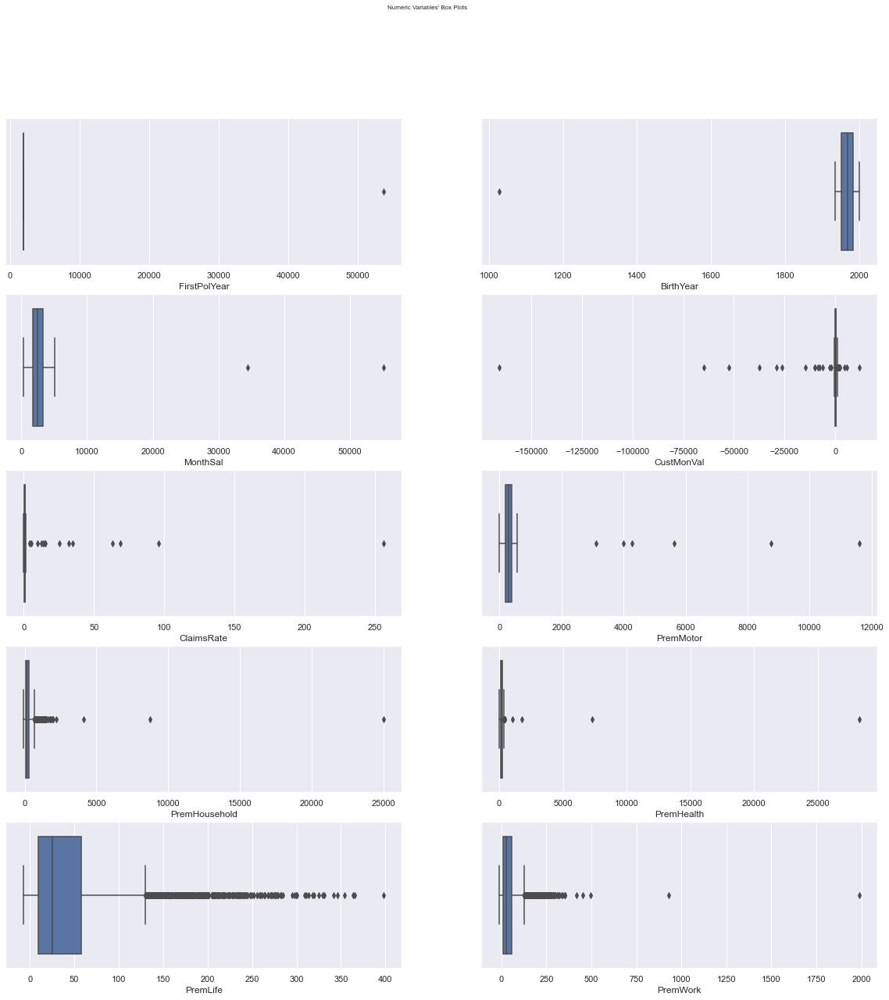

In [523]:
# All Numeric Variables' Box Plots in one figure
sns.set()

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(5, ceil(len(df.drop(['EducDeg','GeoLivArea','Children'],axis=1).columns) / 5), figsize=(20, 20))

# Plot data
# Iterate across axes objects and associate each box plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), df.drop(['EducDeg','GeoLivArea','Children'],axis=1).columns): # Notice the zip() function and flatten() method
    sns.boxplot(x=df.drop(['EducDeg','GeoLivArea','Children'],axis=1)[feat], ax=ax)
    
# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Box Plots"

plt.suptitle(title)

plt.show()

In [524]:
#Splitting the dataframe into numerical and categorical variables.
#Saving those two lists of feature names for later preprocessing.
#Before that, identifying a nominal and binary variable that are interpreted as objects and thus categorical data.
df["GeoLivArea"] = df["GeoLivArea"].astype(object)
df["Children"] = df["Children"].astype(object)

categorical_features = list(df.select_dtypes(exclude=np.number).columns)
numerical_features = list(df.select_dtypes(include=np.number).columns)

#Creating two dataframes
df_numerical = df[numerical_features]
df_categorical = df[categorical_features]

<AxesSubplot:>

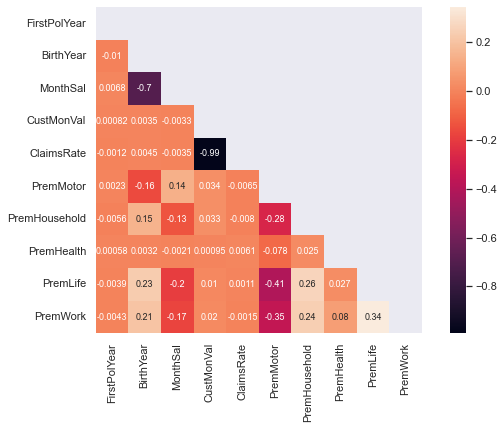

In [525]:
#Create a heatmap to check correlation between numerical features.
#To be detected is a high negative correlation between the ClaimsRate and the CustMonVal of -0.99.
#Monthly salary and birth year have a high negative correlation of -0.7.
#Children and birth year habe a positive correlation of 0.44.
#Children and MonthSal have a negative correlation of 0,39.
#PremMotor has a negative correlation of -0.35 with PremWork and of -0.41 with PremLife. 

corr_matrix = df_numerical.corr()

#Generate a mask for the upper triangle.
mask = np.zeros_like(corr_matrix)
mask[np.triu_indices_from(mask)] = True

#Draw the heatmap with the mask.
plt.figure(figsize=(10, 6))
sns.heatmap(corr_matrix, mask=mask, square=True, annot=True, annot_kws={"size": 9})

In [526]:
df_categorical.T
#One solution would be to introduce the one hot encoder for EducDeg. 
#The second option is the transformation into a numerical variable.

CustID,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,...,10287.0,10288.0,10289.0,10290.0,10291.0,10292.0,10293.0,10294.0,10295.0,10296.0
EducDeg,b'2 - High School',b'2 - High School',b'1 - Basic',b'3 - BSc/MSc',b'3 - BSc/MSc',b'2 - High School',b'2 - High School',b'2 - High School',b'3 - BSc/MSc',b'3 - BSc/MSc',...,b'3 - BSc/MSc',b'2 - High School',b'2 - High School',b'2 - High School',b'1 - Basic',b'4 - PhD',b'1 - Basic',b'3 - BSc/MSc',b'1 - Basic',b'4 - PhD'
GeoLivArea,1.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,1.0,1.0,...,2.0,4.0,1.0,4.0,3.0,2.0,3.0,1.0,2.0,1.0
Children,1.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0


As the quality of data seems to lack, in the following the coherence check and examination of each variable is performed. The goal is to understand the data and find the most suitable method to handle missing values and outliers in the data pre-processing part.

Furthermore, the Data Exploration will be repeated after the Feature Engineering.

<a class="anchor" id="DataExploration">

## 2.1.2. Data Exploration

</a>

<a class="anchor" id="FirstPolYear">

### A. FirstPolYear

</a>

In [527]:
df["FirstPolYear"].info()
#Printing info to see the number of values and the data type.

<class 'pandas.core.series.Series'>
Float64Index: 10296 entries, 1.0 to 10296.0
Series name: FirstPolYear
Non-Null Count  Dtype  
--------------  -----  
10266 non-null  float64
dtypes: float64(1)
memory usage: 418.9 KB


<AxesSubplot:>

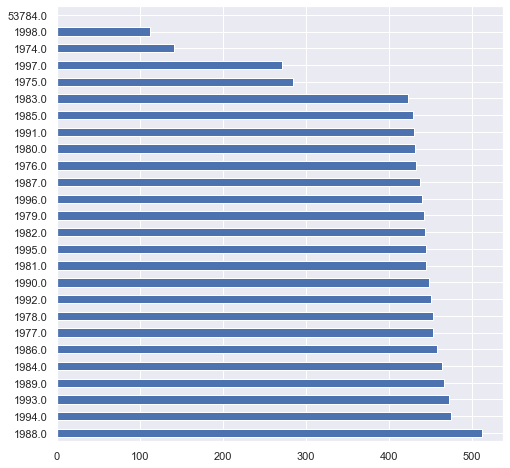

In [528]:
plt.figure(figsize=(8, 8))
df.FirstPolYear.value_counts().plot(kind = 'barh')
#Discovering an odd variable.
#All other values are before 1998.

In [529]:
selection = df[df["FirstPolYear"]>1998].shape[0]

print(f"Number of outliers: {selection}")

Number of outliers: 1


In [530]:
#Checking the detected outlier
df[df['FirstPolYear']>1998]
#Obersation is made, that the rest of the row it looks normal.

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
9295.0,53784.0,1948.0,b'3 - BSc/MSc',3268.0,1.0,0.0,348.85,0.37,351.4,15.0,187.37,22.45,17.78


In [531]:
# #Ricardo has two plots here I am not sure how to interpret!
# sns.scatterplot(data=df, x='FirstPolYear', y='MonthSal',hue='GeoLivArea')

In [532]:
# #Ricardo has two plots here I am not sure how to interpret!
# sns.scatterplot(data=df[(df['MonthSal']<30000)&(df['FirstPolYear']<30000)], x='FirstPolYear', y='MonthSal',hue='GeoLivArea',sizes=(20,20))
# #Trying to find a pattern to put a predicted number in the place of the 53784.

<AxesSubplot:ylabel='FirstPolYear'>

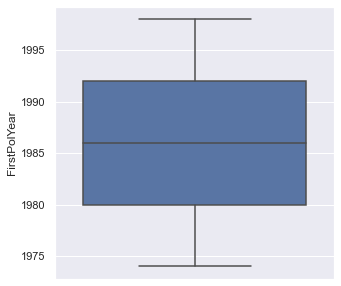

In [533]:
#The previous detected outlier might be an error in data collection.
#Excluding this one in order to have an optimal visualization.
plt.figure(figsize=(5,5))
sns.boxplot(data=df[df['FirstPolYear']<53784],y="FirstPolYear")

In [534]:
df[df['FirstPolYear']<df['BirthYear']]
#Detected 1997 questionable rows. It is impossible to be a customer before being born.
#This might be either a mistake in data collection or children associated to their parents isurance.
#This is a typical procedure in Germany.

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
2.0,1981.0,1995.0,b'2 - High School',677.0,4.0,1.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
14.0,1983.0,2000.0,b'1 - Basic',1043.0,3.0,1.0,-75.12,1.06,44.34,342.85,127.69,267.94,94.46
19.0,1981.0,1982.0,b'1 - Basic',1414.0,3.0,1.0,230.38,0.71,313.17,373.40,121.80,14.78,72.57
23.0,1976.0,1986.0,b'2 - High School',1495.0,1.0,1.0,-89.79,1.08,209.04,308.95,192.48,64.79,54.90
41.0,1994.0,1995.0,b'2 - High School',1177.0,4.0,1.0,121.36,0.84,52.01,455.65,135.47,146.36,148.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10269.0,1987.0,1988.0,b'3 - BSc/MSc',1414.0,3.0,1.0,50.46,0.90,129.58,167.80,184.48,165.92,75.46
10274.0,1989.0,1992.0,b'2 - High School',1035.0,1.0,1.0,293.51,0.58,235.71,195.60,103.13,170.92,58.12
10285.0,1980.0,1987.0,b'3 - BSc/MSc',1504.0,4.0,1.0,-1.55,0.96,390.63,29.45,179.70,-6.00,NaN


In [535]:
#Checking the rows of those missing values 
df[df['FirstPolYear'].isna()].head()
#No correlation detected

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
297.0,NaN,1955.0,b'4 - PhD',3591.0,NaN,NaN,-49.11,1.04,447.64,-25.00,130.58,0.89,12.89
756.0,NaN,NaN,b'4 - PhD',2913.0,3.0,0.0,430.20,0.28,465.20,59.45,94.13,4.89,10.00
897.0,NaN,1960.0,NaN,2643.0,1.0,1.0,-25.00,1.00,515.54,33.90,47.01,12.89,3.78
2228.0,NaN,1979.0,b'3 - BSc/MSc',1987.0,2.0,NaN,429.87,0.25,376.85,33.90,154.25,39.34,4.78
2450.0,NaN,1939.0,NaN,4465.0,4.0,0.0,457.75,0.36,338.73,187.25,175.81,43.23,4.78


<a class="anchor" id="BirthYear">

### B. BirthYear

</a>

<AxesSubplot:>

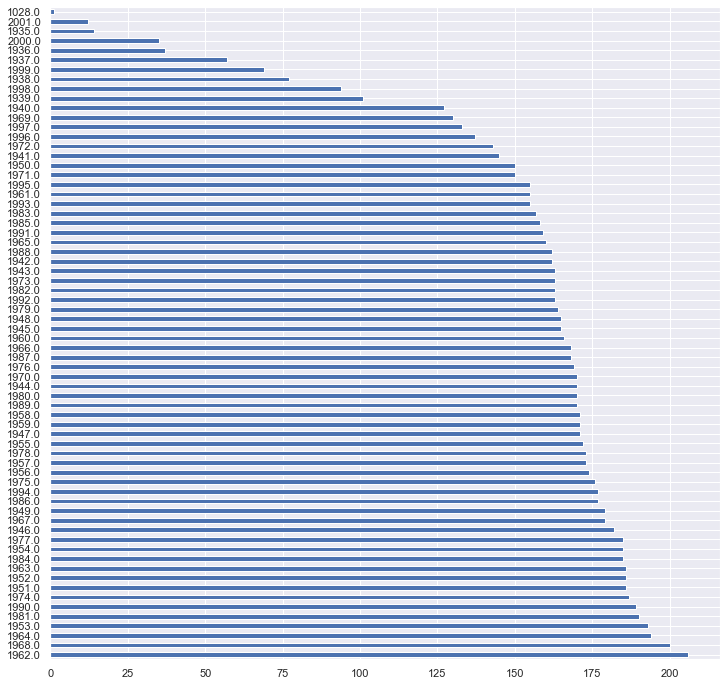

In [536]:
plt.figure(figsize=(12, 12))
df.BirthYear.value_counts().plot(kind = 'barh')
#Detected the questionable value of 1028
#We have customers which are children and adults

In [537]:
selection = df[df["BirthYear"]<1029].shape[0]

print(f"Number of outliers: {selection}")

Number of outliers: 1


In [538]:
#Checked the detected outlier
df[df['BirthYear']==1028]
#Obersation is made, that the rest of the row it looks normal

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
7196.0,1993.0,1028.0,b'3 - BSc/MSc',2830.0,4.0,0.0,146.02,0.77,428.97,192.8,108.91,1.89,23.67


<AxesSubplot:ylabel='BirthYear'>

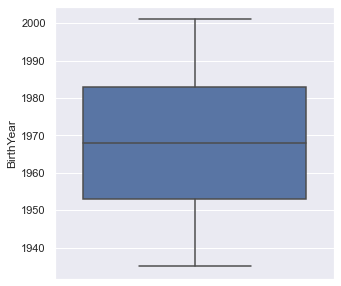

In [539]:
#The previous detected outlier might be an error in data collection 
#Excluding this one in order to have an optimal visualization
plt.figure(figsize=(5,5))
sns.boxplot(data=df[df['BirthYear']>1029],y='BirthYear')

<a class="anchor" id="EducDeg">

### C. EducDeg

</a>

<AxesSubplot:>

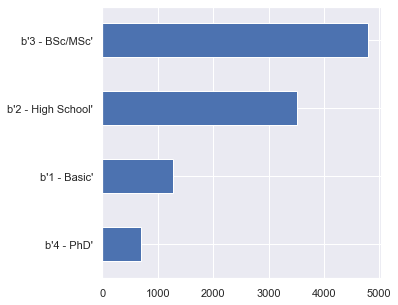

In [540]:
#Observation of the only categorical and ordinal variable Education.
plt.figure(figsize=(5,5))
df.EducDeg.value_counts().sort_values().plot(kind = 'barh')

In [541]:
column = "EducDeg"
#Printing the numbers of each of the five eduaction degrees.
#Unbalanced dataset in terms of the education.
print(f'{column} has {len(df["EducDeg"].unique())} unique values.')
df["EducDeg"].value_counts()

EducDeg has 5 unique values.


b'3 - BSc/MSc'        4799
b'2 - High School'    3510
b'1 - Basic'          1272
b'4 - PhD'             698
Name: EducDeg, dtype: int64

In [542]:
#As the BirthYear and EducDeg have the same number of NaN, check if the missing entries are in the same rows.
df[df['EducDeg'].isna()].head()
#No relation is being detected

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
897.0,NaN,1960.0,NaN,2643.0,1.0,1.0,-25.00,1.00,515.54,33.90,47.01,12.89,3.78
1708.0,1992.0,1946.0,NaN,3827.0,4.0,0.0,355.52,0.33,222.71,146.70,NaN,94.13,105.24
2450.0,NaN,1939.0,NaN,4465.0,4.0,0.0,457.75,0.36,338.73,187.25,175.81,43.23,4.78
2729.0,NaN,1954.0,NaN,3200.0,2.0,0.0,109.25,0.77,211.93,14.45,275.72,77.68,11.67
2771.0,NaN,1984.0,NaN,1473.0,4.0,1.0,443.74,0.31,386.74,104.45,156.92,5.00,27.45


In [543]:
df[df['BirthYear']>2000]['EducDeg']
#Data regarding Education makes sense, because 15 year old people couldn't have any degree only the basic.

CustID
660.0     b'1 - Basic'
690.0     b'1 - Basic'
866.0     b'1 - Basic'
1437.0    b'1 - Basic'
2580.0    b'1 - Basic'
3147.0    b'1 - Basic'
4466.0    b'1 - Basic'
4484.0    b'1 - Basic'
5348.0    b'1 - Basic'
5608.0    b'1 - Basic'
8963.0    b'1 - Basic'
9907.0    b'1 - Basic'
Name: EducDeg, dtype: object

In [544]:
df.groupby('EducDeg')['BirthYear'].max()
#Having a PHD being 23 years old is unusual
#Possibly it is indicating a gifted person

EducDeg
b'1 - Basic'          2001.0
b'2 - High School'    1998.0
b'3 - BSc/MSc'        1996.0
b'4 - PhD'            1993.0
Name: BirthYear, dtype: float64

<a class="anchor" id="MonthSal">

### D. MonthSal

</a>

<AxesSubplot:ylabel='MonthSal'>

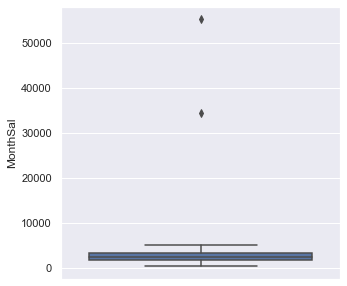

In [545]:
#Visualizing the feature.
plt.figure(figsize=(5,5))
sns.boxplot(data=df,y='MonthSal')

In [546]:
#Viewing the unique values in order to detect outliers
np.sort(df['MonthSal'].unique())
#Two outliers detected

array([  333.,   334.,   335., ..., 34490., 55215.,    nan])

In [547]:
df[(df['MonthSal']==34490)|(df['MonthSal']==55215)]
#Overall, the rows do not look unusual. To notice is that the ouliers are in GeoLivArea 4.

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
5883.0,1995.0,1956.0,b'2 - High School',55215.0,4.0,1.0,122.25,0.79,281.83,147.25,130.58,84.46,66.68
8262.0,1981.0,1991.0,b'2 - High School',34490.0,4.0,0.0,608.89,0.28,57.01,358.95,195.26,113.80,161.14


In [548]:
selection = df[df["MonthSal"]>34489].shape[0]

print(f"Number of outliers: {selection}")

Number of outliers: 2


<AxesSubplot:ylabel='MonthSal'>

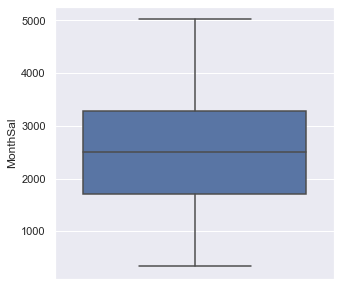

In [549]:
plt.figure(figsize=(5,5))
sns.boxplot(data=df[df['MonthSal']<34490],y='MonthSal')

In [550]:
df.groupby('GeoLivArea')['MonthSal'].median()
#However, this cell and the cell below show that the salary is not influenced by the living area.
#There are more or less the same wages per area.
#Big cities/metropol can not be identified.

GeoLivArea
1.0    2477.0
2.0    2562.0
3.0    2464.0
4.0    2525.0
Name: MonthSal, dtype: float64

In [551]:
#Confirmation of previous assumption
df.groupby('GeoLivArea')['MonthSal'].mean()

GeoLivArea
1.0    2474.074038
2.0    2562.561591
3.0    2481.960641
4.0    2528.740257
Name: MonthSal, dtype: float64

In [552]:
df.groupby('EducDeg')['MonthSal'].max()
#The outliers regarding the salary are in High School
#This value is most likely an error in data collection

EducDeg
b'1 - Basic'           4872.0
b'2 - High School'    55215.0
b'3 - BSc/MSc'         4995.0
b'4 - PhD'             4624.0
Name: MonthSal, dtype: float64

In [553]:
df[df['MonthSal']==0].shape[0]
#Zero customers are unemployed.

0

<a class="anchor" id="GeoLivArea">

### E. GeoLivArea

</a>

<AxesSubplot:>

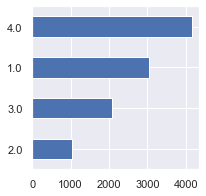

In [554]:
plt.figure(figsize=(3,3))
df.GeoLivArea.value_counts().sort_values().plot(kind = 'barh')
#The largest distribution lives in the area 4.

In [555]:
#Showing the actual numbers of inhabitants of the area.
#Distribution not balanced.
column = "GeoLivArea"

print(f'{column} has {len(df[column].unique())} unique values.')

df[column].value_counts()

GeoLivArea has 5 unique values.


4.0    4145
1.0    3048
3.0    2066
2.0    1036
Name: GeoLivArea, dtype: int64

In [556]:
#Printing the percentages of residents.
#We have an unbalanced dataset in terms of the regions.
print('The % of people living in Area {} is:'.format('4'), round(4145/df.GeoLivArea.value_counts().sum(),3))
print('The % of people living in Area {} is:'.format('1'), round(3048/df.GeoLivArea.value_counts().sum(),3))
print('The % of people living in Area {} is:'.format('3'), round(2066/df.GeoLivArea.value_counts().sum(),3))
print('The % of people living in Area {} is:'.format('2'), round(1036/df.GeoLivArea.value_counts().sum(),3))
print('The number of people living in Area 4 and 1 is:',round(4145/df.GeoLivArea.value_counts().sum() + 3048/df.GeoLivArea.value_counts().sum(),3))

The % of people living in Area 4 is: 0.403
The % of people living in Area 1 is: 0.296
The % of people living in Area 3 is: 0.201
The % of people living in Area 2 is: 0.101
The number of people living in Area 4 and 1 is: 0.699


In [557]:
df[df['GeoLivArea'].isna()]
#Checking the only NaN value in terms of area.
#No meaningful insight

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
297.0,NaN,1955.0,b'4 - PhD',3591.0,NaN,NaN,-49.11,1.04,447.64,-25.0,130.58,0.89,12.89


<a class="anchor" id="Children">

### F. Children

</a>

<AxesSubplot:>

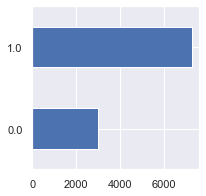

In [558]:
#The majority has children.
plt.figure(figsize=(3,3))
df.Children.value_counts().sort_values().plot(kind = 'barh')

In [559]:
#Showing the actual numbers of customers havong children.
#More than the double number of customers have children.
column = "Children"

print(f'{column} has {len(df[column].unique())} unique values.')

df[column].value_counts()

Children has 3 unique values.


1.0    7262
0.0    3013
Name: Children, dtype: int64

In [560]:
#No inconsistencies detected showing the missing values.
df[df['Children'].isna()].head()

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
297.0,NaN,1955.0,b'4 - PhD',3591.0,NaN,NaN,-49.11,1.04,447.64,-25.00,130.58,0.89,12.89
620.0,1980.0,1994.0,b'3 - BSc/MSc',1333.0,2.0,NaN,312.52,0.40,286.83,-6.10,175.70,52.90,56.79
773.0,1998.0,1949.0,b'2 - High School',3601.0,2.0,NaN,27.01,0.94,104.91,308.95,285.61,64.90,52.90
2228.0,NaN,1979.0,b'3 - BSc/MSc',1987.0,2.0,NaN,429.87,0.25,376.85,33.90,154.25,39.34,4.78
2363.0,1981.0,1975.0,b'2 - High School',1607.0,2.0,NaN,271.51,0.64,292.61,308.40,159.14,11.89,59.68


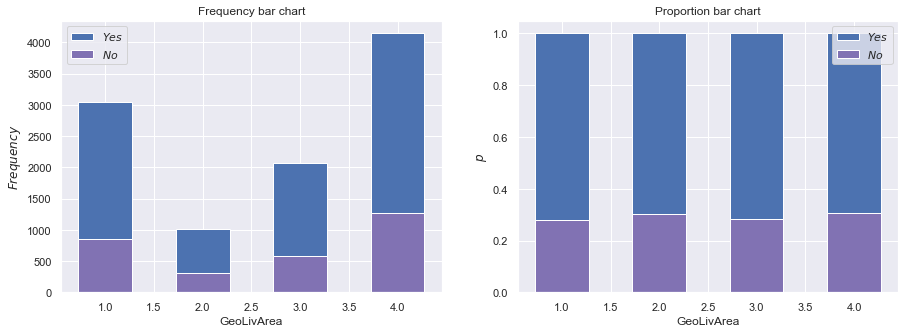

In [561]:
#There is no relationship between the living area and the fact of having children.
visualize_categorical(df,"GeoLivArea","Children")

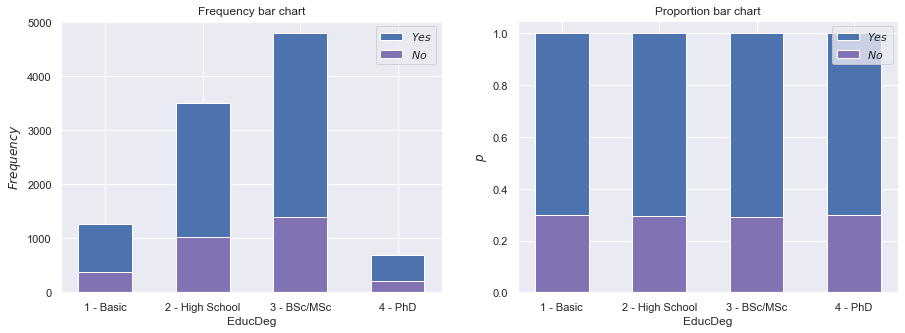

In [562]:
#There is no relationship between Education and the fact of having children.
visualize_categorical(df,"EducDeg","Children")

In [563]:
df.groupby('Children')['BirthYear'].max()
#There are 15 year olds having children in our dataframe.

Children
0.0    2001.0
1.0    2001.0
Name: BirthYear, dtype: float64

In [564]:
df.loc[(df['BirthYear']>2000) & (df['Children']==1)]
#In total, 7 people are 15 years old and have children.
#This will not be further interpreted as it may be realistic.

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
660.0,1991.0,2001.0,b'1 - Basic',1284.0,4.0,1.0,243.50,0.81,46.23,1079.65,72.68,252.27,-10.00
690.0,1997.0,2001.0,b'1 - Basic',1180.0,3.0,1.0,436.10,0.48,54.90,406.20,65.79,112.02,256.05
866.0,1979.0,2001.0,b'1 - Basic',562.0,1.0,1.0,1113.78,0.11,40.34,847.95,94.24,178.70,112.13
3147.0,1994.0,2001.0,b'1 - Basic',372.0,4.0,1.0,488.76,0.36,60.68,270.60,177.59,182.48,107.13
4484.0,1983.0,2001.0,b'1 - Basic',1241.0,3.0,1.0,909.17,0.13,43.34,589.55,142.47,121.80,179.48
5348.0,1980.0,2001.0,b'1 - Basic',1119.0,3.0,1.0,796.71,0.23,148.14,628.45,221.82,45.12,30.23
9907.0,1976.0,2001.0,b'1 - Basic',1422.0,1.0,1.0,467.31,0.37,69.68,231.15,201.26,191.48,82.35


<a class="anchor" id="CustMonVal">

### G. CustMonVal

</a>

Interpretation: <br>
Lifetime value = (annual profit from the customer) X (number of years that they are a customer)- (acquisition cost)


In [565]:
df['CustMonVal'].describe()
#The spread between the cheapest and most expensive customers is very wide. 
#It is worthwhile to focus further on the feature.

count     10296.000000
mean        177.892605
std        1945.811505
min     -165680.420000
25%          -9.440000
50%         186.870000
75%         399.777500
max       11875.890000
Name: CustMonVal, dtype: float64

<AxesSubplot:ylabel='CustMonVal'>

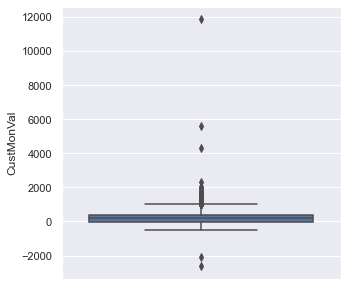

In [566]:
plt.figure(figsize=(5,5))
sns.boxplot(data=df[df['CustMonVal']>-5000],y='CustMonVal')
#People with negative Customer Monetary Value either are recent acquiistions or unprofitable customers.
#A lot of outliers detected ranging between very high and very low values.

In [567]:
df[df['CustMonVal']>0].shape[0]
#Number of customer that are adding profit.
#Would it be beneficial to devide the dataframe in profitable and non-protitable customers?

7526

In [568]:
df[df['CustMonVal']<=0].shape[0]
#Number of customer that are not profitable. 
#There are approximately 27% of the customers adding losses to the company.

2770

In [569]:
#Despite of the missing values, no new customers can be identified.
#Thus, the zero or negative values must be in regard to their annual payment or acquisition cost.
df[df['CustMonVal']<=0].sort_values(by=['FirstPolYear'], ascending=False).head()

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
2860.0,1998.0,1990.0,b'3 - BSc/MSc',1438.0,4.0,1.0,-17.11,0.99,247.27,127.8,264.94,7.89,53.23
3591.0,1998.0,1989.0,b'3 - BSc/MSc',1554.0,1.0,1.0,-71.01,1.05,226.93,313.4,160.14,90.24,46.01
3776.0,1998.0,1993.0,b'3 - BSc/MSc',1454.0,1.0,1.0,-11.11,0.98,411.41,118.9,172.92,5.89,13.89
3703.0,1998.0,1940.0,b'3 - BSc/MSc',4026.0,3.0,1.0,-70.01,1.05,249.16,367.3,195.37,31.34,13.67
2289.0,1998.0,1967.0,b'2 - High School',2853.0,4.0,1.0,-20.89,0.99,526.21,75.0,32.34,11.67,15.78


In [570]:
df[df['CustMonVal']>0].describe()
#Taking a closer look on profitable customers.
#Also negative premiums for 2016 detected.

,FirstPolYear,BirthYear,MonthSal,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
count,7507.000000,7514.000000,7500.000000,7526.000000,7526.000000,7518.000000,7526.000000,7502.000000,7471.000000,7478.000000
mean,1992.983615,1968.006122,2509.708800,323.169332,0.546908,292.806849,226.608378,176.377823,43.202981,42.572196
std,597.868412,20.653221,1221.587279,275.844171,0.263261,228.277094,373.038860,343.288712,47.085939,52.222129
min,1974.000000,1028.000000,333.000000,0.120000,0.000000,1.780000,-75.000000,-2.110000,-7.000000,-12.000000
25%,1980.000000,1953.000000,1695.750000,136.022500,0.320000,187.370000,64.450000,116.800000,10.890000,11.670000
50%,1986.000000,1968.000000,2504.500000,309.075000,0.540000,286.720000,151.150000,166.810000,28.560000,28.450000
75%,1992.000000,1984.000000,3304.500000,452.760000,0.790000,392.520000,305.600000,221.820000,59.790000,58.010000
max,53784.000000,2001.000000,55215.000000,11875.890000,0.990000,11604.420000,25048.800000,28272.000000,398.300000,1988.700000


In [571]:
#Takting a closer look on non-profitable customers
df[df['CustMonVal']<=0].describe()
#Analyzing the group of customers, without placing a value on the disribution
#Non-profitable customers are slightly longer insured.
#Profitable customers have slightly more income.
#Profitable customers have very large span in terms of income and first policy year detectected as outliers.
#Overall, the values of premium are higher for profitable customers. We interpret this as:
#More reversals for non-profitable customers.
#In line with the higher income, maybe also a salary based premium as the premium value differs from customer to customer.
#A very high value of claims rate is being detected for non-profitable customers.
#Profitable customers have either zero or one claims rate.

,FirstPolYear,BirthYear,MonthSal,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
count,2759.000000,2765.000000,2760.000000,2770.000000,2770.000000,2744.000000,2770.000000,2751.000000,2721.000000,2732.000000
mean,1985.835810,1968.012297,2498.401449,-216.819542,1.274928,321.466414,166.478303,158.499400,38.156803,37.733726
std,6.620518,16.883824,961.951848,3695.515343,5.573053,156.794527,285.328084,76.491419,48.363959,49.358179
min,1974.000000,1935.000000,333.000000,-165680.420000,0.000000,-4.110000,-75.000000,5.780000,-7.000000,-12.000000
25%,1980.000000,1954.000000,1749.750000,-75.225000,1.000000,207.762500,13.900000,99.130000,7.000000,7.890000
50%,1986.000000,1968.000000,2494.500000,-41.215000,1.020000,340.730000,84.450000,151.140000,18.780000,19.780000
75%,1991.500000,1981.000000,3241.250000,-25.000000,1.070000,443.530000,226.150000,211.040000,50.120000,49.010000
max,1998.000000,2001.000000,5021.000000,0.000000,256.200000,3106.620000,8762.800000,417.300000,346.400000,417.080000


<a class="anchor" id="ClaimsRate">

### H. ClaimsRate

</a>

In [572]:
df['ClaimsRate'].describe()
#A very strong outlier detected. Already detected in the analysis of non-profitable customer.

count    10296.000000
mean         0.742772
std          2.916964
min          0.000000
25%          0.390000
50%          0.720000
75%          0.980000
max        256.200000
Name: ClaimsRate, dtype: float64

In [573]:
#Showing the actual numbers of claims in the following cells.
df[df["ClaimsRate"] == 1].shape[0]

457

In [574]:
#1783 customers raised overall more than one claim.
df[df["ClaimsRate"] > 1].shape[0]

1783

In [575]:
#The majority of customers have a claims rate between zero and one.
df[df["ClaimsRate"] < 1].shape[0]

8056

In [576]:
#58 customers did not raise a claim.
#The least number of customers.
df[df["ClaimsRate"] == 0].shape[0]

58

<AxesSubplot:ylabel='ClaimsRate'>

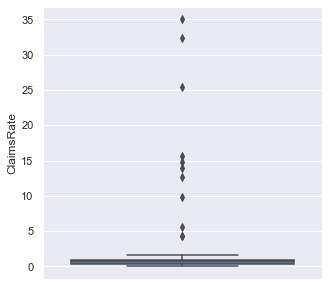

In [577]:
plt.figure(figsize=(5,5))
sns.boxplot(data=df[df['ClaimsRate']<60],y='ClaimsRate')
#Visualization of the values. Largest contribution around 0 and 1.
#Many outliers detected.

In [578]:
#Printing the outlier rows.
df[df['ClaimsRate']>60]
#Row looks normal in terms of premiums. Wouldn't we have at least a negative premium due to payback?
#Or maybe old happenings?
#All customers with a very high customer monetary value, which is in line with the previous defined negative correlation.

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
172.0,1990.0,1989.0,b'3 - BSc/MSc',1086.0,4.0,1.0,-165680.42,256.2,378.07,78.90,166.81,6.89,18.45
656.0,1974.0,1963.0,b'3 - BSc/MSc',3279.0,3.0,1.0,-64891.00,96.0,410.30,117.25,95.35,37.34,22.56
676.0,1994.0,1937.0,b'2 - High School',4435.0,1.0,0.0,-52382.76,63.0,197.48,280.60,276.94,51.12,38.34
9649.0,1990.0,1950.0,b'3 - BSc/MSc',3574.0,3.0,0.0,-37327.08,69.0,319.06,-25.55,245.38,4.89,4.78


<AxesSubplot:xlabel='ClaimsRate', ylabel='CustMonVal'>

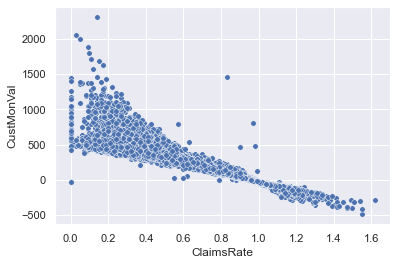

In [579]:
sns.scatterplot(data=df[(df['ClaimsRate']<2)&(df['CustMonVal']<4000)],x='ClaimsRate',y='CustMonVal',s=30)
#For claims rate >1 the lifetime value is lower than 0. 
#Due to correlation only one feature is enough for the segmentation of customers.

<a class="anchor" id="PremMotor">

### I. PremMotor

</a>

In [580]:
df['PremMotor'].describe()
#Very few and low value in terms of payback.

count    10262.000000
mean       300.470252
std        211.914997
min         -4.110000
25%        190.590000
50%        298.610000
75%        408.300000
max      11604.420000
Name: PremMotor, dtype: float64

In [581]:
#One customer with a negative premium and one claims rate.
#Indicating a recent happening?
#A negative premium indicating a recency and recent expensive customers
df[df['PremMotor']<0]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
8952.0,1975.0,1995.0,b'1 - Basic',449.0,4.0,1.0,-16.44,0.99,-4.11,369.5,94.13,220.93,204.15


<AxesSubplot:ylabel='PremMotor'>

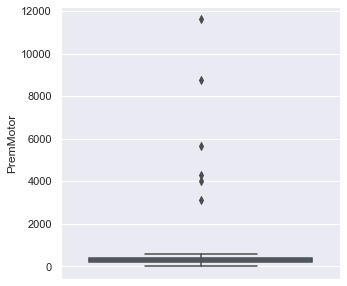

In [582]:
plt.figure(figsize=(5,5))
sns.boxplot(data=df,y='PremMotor')
#The insurance premium amount varies from one payee to another.
#Very high premiums detected in terms of Motor.

In [583]:
selection = df[df['PremMotor']>2000].shape[0]

print(f"Number of outliers: {selection}")

Number of outliers: 6


<AxesSubplot:ylabel='PremMotor'>

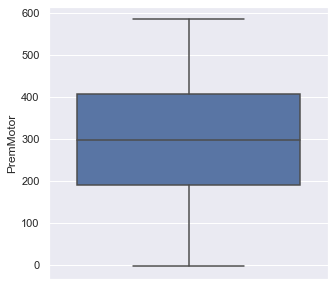

In [584]:
plt.figure(figsize=(5,5))
sns.boxplot(data=df[df['PremMotor']<2000],y='PremMotor')

In [585]:
df[df['PremMotor']>2000]
#Six rows detected which are identified as extreme outliers.
#Here, the reasoning behind a high premium would be beneficial.
#All outliers are between 53 and 73 years old.
#Most of them hold an university degree
#50% of them had a claims rate before
#50% of the defined sample have children.
#Their monthly salary is in 6 cases above the average of 2,507.
#All first years of policy are more than 20 years ago.

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
5129.0,1996.0,1943.0,b'1 - Basic',3763.0,1.0,0.0,466.21,0.90,4003.44,612.90,137.36,121.69,31.34
5212.0,1981.0,1943.0,b'2 - High School',4135.0,3.0,0.0,130.14,0.99,8744.61,101.70,1767.00,155.14,130.58
5294.0,1989.0,1963.0,b'3 - BSc/MSc',3564.0,3.0,1.0,11875.89,0.09,11604.42,48.90,1045.52,103.13,296.47
6702.0,1995.0,1951.0,b'3 - BSc/MSc',2947.0,4.0,0.0,4328.50,0.03,4273.49,83.90,105.13,3.00,3.89
7086.0,1992.0,1963.0,b'3 - BSc/MSc',2460.0,3.0,1.0,5596.84,0.01,5645.50,-25.55,49.01,1.89,1.89
7905.0,1974.0,1959.0,b'3 - BSc/MSc',2354.0,4.0,1.0,-46.89,1.01,3106.62,30.00,59.01,12.89,9.00


<AxesSubplot:xlabel='PremMotor', ylabel='CustMonVal'>

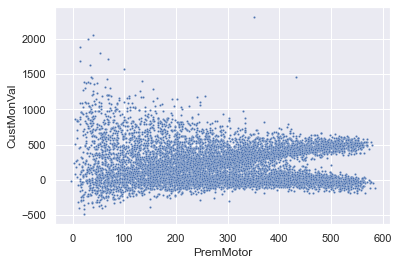

In [586]:
sns.scatterplot(data=df[(df['PremMotor']<2000)&(df['CustMonVal']>-2000)],x='PremMotor',y='CustMonVal',s=5)
#Bin the FirstPolYear 
#Two type of customers pay more than 300€ of motor premium
#Maybe one group has to pay more because they are expensive (had claims rates) and the other group has a higher premium 
#due to other reasons like an expensive car or a high acquisition cost?

In [587]:
df[(df['PremMotor']>400)&(df['CustMonVal']>0)&(df['ClaimsRate']>1)].shape[0]
#The group having a high premium and high lifetime value have overall less claims rate
#Claim rates only ranging between one and zero.
#The group with a value being zero or negative all raised a claim, mostly having a claims rate over one.
# df[(df['PremMotor']>400)&(df['CustMonVal']<=0)&(df['ClaimsRate']<1)].shape[0]

0

<a class="anchor" id="PremHousehold">

### J. PremHousehold

</a>

In [588]:
df['PremHousehold'].describe()
#Overoll, mean indicates a very low profit margin. 
#Maximum value seems to be very high and is being analysed in the following.

count    10296.000000
mean       210.431192
std        352.595984
min        -75.000000
25%         49.450000
50%        132.800000
75%        290.050000
max      25048.800000
Name: PremHousehold, dtype: float64

In [589]:
df[df['PremHousehold']<0]
#1097 rows are being detected that indicate reversals in terms of insurance guarantee.

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
15.0,1983.0,1975.0,b'2 - High School',1981.0,1.0,1.0,-89.00,1.12,504.43,-70.00,72.79,10.89,16.89
31.0,1988.0,1975.0,b'2 - High School',2148.0,4.0,1.0,427.76,0.19,483.09,-15.00,92.24,3.89,-5.11
37.0,1982.0,1972.0,b'2 - High School',2401.0,4.0,1.0,7.24,0.94,320.95,-25.55,145.25,26.56,84.35
45.0,1985.0,1990.0,b'3 - BSc/MSc',1065.0,1.0,1.0,-128.68,1.19,111.80,-35.00,208.26,224.71,44.23
49.0,1985.0,1974.0,b'3 - BSc/MSc',2381.0,3.0,1.0,-132.88,1.20,468.09,-45.55,92.24,1.89,14.89
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10251.0,1997.0,1957.0,b'3 - BSc/MSc',2809.0,1.0,1.0,-40.11,1.03,362.18,-30.00,166.92,49.12,14.89
10253.0,1978.0,1968.0,b'3 - BSc/MSc',2499.0,1.0,1.0,-84.00,1.11,532.10,-60.00,43.12,3.89,2.89
10270.0,1990.0,1976.0,b'2 - High School',1858.0,1.0,1.0,-207.91,1.34,175.59,-40.55,256.16,142.36,11.00


<AxesSubplot:ylabel='PremHousehold'>

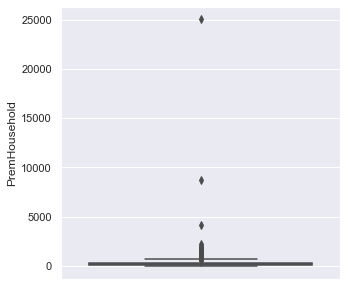

In [590]:
plt.figure(figsize=(5,5))
sns.boxplot(data=df,y='PremHousehold')
#Two outlier are being detected

<AxesSubplot:ylabel='PremHousehold'>

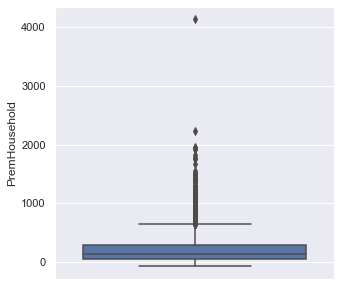

In [591]:
plt.figure(figsize=(5,5))
sns.boxplot(data=df[df['PremHousehold']<5000],y='PremHousehold')
#Visualising the feature.

In [592]:
df[df['PremHousehold']>5000]
#Printing the outlier rows.
#Both customers seem to be between 44 and 50.
#They have been insuranced for about 40 years.
#Their lifetime value does not seem to be related to the high premium.
#They both had claims rates.
#Both of their salaries are above the average of 2,507.

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
6836.0,1975.0,1966.0,b'3 - BSc/MSc',2832.0,4.0,1.0,-31.00,1.00,535.10,8762.8,41.12,-6.00,9.78
8867.0,1978.0,1972.0,b'2 - High School',2618.0,4.0,1.0,473.54,0.98,508.43,25048.8,36.23,9.89,11.89


<AxesSubplot:xlabel='PremHousehold', ylabel='CustMonVal'>

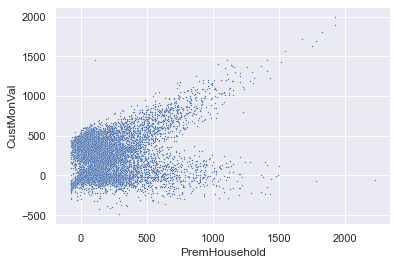

In [593]:
sns.scatterplot(data=df[(df['PremHousehold']<4000)&(df['CustMonVal']>-2000)&(df['CustMonVal']<2000)],x='PremHousehold',y='CustMonVal',s=2)
#2 different type of customer that pay more than 500€ of premium.
#There must be a connected reason in terms of premium allocation that makes a different here.
#The linear trend shows that if the household premium increases so does the lifetime value of the customer. 
#Here money has been accumulated.

In [594]:
df[(df['PremHousehold']>500)&(df['CustMonVal']>0)&(df['ClaimsRate']>1)].shape[0]
#In most of the cases the high premium is in line with a high lifetime value of the customer. 
#Hence, not so much time/money was the insurance needed. 
#Customers having a high customer lifetime value are identified having a claims rate between one and zero.
# df[(df['PremHousehold']>500)&(df['CustMonVal']<=0)&(df['ClaimsRate']>1)].shape[0]
#The second group are have a overall higher claims rate, with the majority having a rate higher than one.

0

<a class="anchor" id="PremHealth">

### K. PremHealth

</a>

In [595]:
df['PremHealth'].describe()
#Mean indicates a profit margin of 172 on average.
#Big span between the premiums detected.

count    10253.000000
mean       171.580833
std        296.405976
min         -2.110000
25%        111.800000
50%        162.810000
75%        219.820000
max      28272.000000
Name: PremHealth, dtype: float64

In [596]:
df[df['PremHealth']<0]
#Interesting customer, as the premium is negative, but the claims rate is zero.
#The lifetime value is above the average of 178.

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
1360.0,1991.0,1971.0,b'4 - PhD',2694.0,4.0,1.0,487.89,0.06,580.11,-30.0,-2.11,-1.0,1.0


<AxesSubplot:ylabel='PremHealth'>

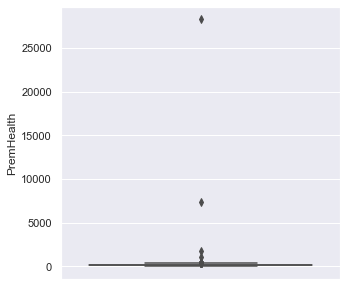

In [597]:
plt.figure(figsize=(5,5))
sns.boxplot(data=df,y='PremHealth')
#Detected one outlier with a very high value.

In [598]:
selection = df[df["PremHealth"]>1000].shape[0]

print(f"Number of outliers: {selection}")

Number of outliers: 4


<AxesSubplot:ylabel='PremHealth'>

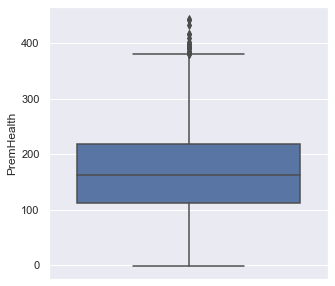

In [599]:
plt.figure(figsize=(5,5))
sns.boxplot(data=df[df['PremHealth']<1000],y='PremHealth')
#Visualising the feature exclusing four outliers.

In [600]:
df[df['PremHealth']>1000]
#Showing the four values.
#Both have same characteristics in terms of living area and education varying between b'2 and b'3.

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
5212.0,1981.0,1943.0,b'2 - High School',4135.0,3.0,0.0,130.14,0.99,8744.61,101.70,1767.00,155.14,130.58
5294.0,1989.0,1963.0,b'3 - BSc/MSc',3564.0,3.0,1.0,11875.89,0.09,11604.42,48.90,1045.52,103.13,296.47
7962.0,1995.0,1942.0,b'3 - BSc/MSc',4002.0,3.0,0.0,1457.99,0.83,431.86,107.80,7322.48,12.89,930.44
9150.0,1985.0,1994.0,b'2 - High School',987.0,3.0,1.0,804.05,0.97,26.34,829.05,28272.00,65.68,138.25


<AxesSubplot:xlabel='PremHealth', ylabel='CustMonVal'>

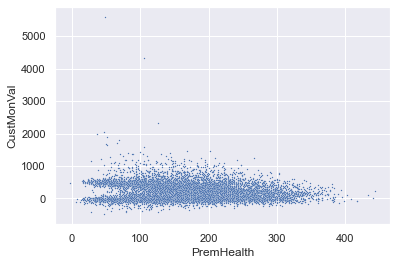

In [601]:
sns.scatterplot(data=df[(df['PremHealth']<500)&(df['CustMonVal']>-2000)],x='PremHealth',y='CustMonVal',s=2)
#2 type of customers that pay less than 100€ euros.
#Maybe one group of the sampe pays less because they are healthy and never made use of the insurance. 
#Thus, they have a positive lifetime value.

In [602]:
df[(df['PremHealth']<100)&(df['CustMonVal']>0)&(df['ClaimsRate']<1)].shape[0]
#More than double the number of customers paying a premium of 100 have a current positive lifetime value.
#All of those customers have a claims rate of below one.
# df[(df['PremHealth']<100)&(df['CustMonVal']<=0)&(df['ClaimsRate']<1)].shape[0]
#The other group is combined of customers which all raised a claim and have on average more than one claims rate.
#1/3 of the customers paying a premium of 100 have a current negative lifetime value.

1340

<a class="anchor" id="PremLife">

### L. PremLife

</a>

In [603]:
df['PremLife'].describe()
#Mean indicates a very low profit margin.
#No huge span between the premiums detected.

count    10192.000000
mean        41.855782
std         47.480632
min         -7.000000
25%          9.890000
50%         25.560000
75%         57.790000
max        398.300000
Name: PremLife, dtype: float64

<AxesSubplot:ylabel='PremLife'>

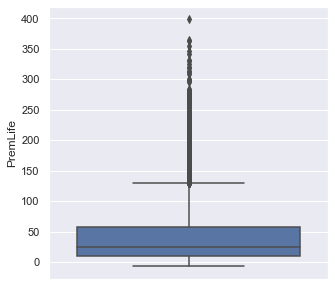

In [604]:
plt.figure(figsize=(5,5))
sns.boxplot(data=df,y='PremLife')
#Detected one outlier with a very high value.

<AxesSubplot:ylabel='PremLife'>

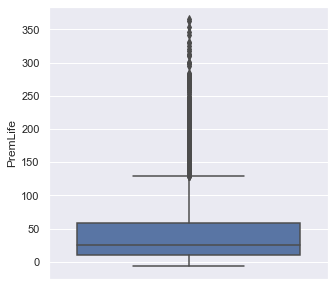

In [605]:
plt.figure(figsize=(5,5))
sns.boxplot(data=df[df['PremLife']<370],y='PremLife')
#Visualising the feature exclusing two outliers.

In [606]:
selection = df[df["PremLife"]>370].shape[0]

print(f"Number of outliers: {selection}")

Number of outliers: 1


In [607]:
df[df['PremLife']<0]
#A lot of corrected premiums in 2016.
#No distinct correlation/reasoning detectable.

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
16.0,1988.0,1979.0,b'3 - BSc/MSc',974.0,4.0,1.0,290.06,0.53,318.06,93.90,247.49,-3.00,19.67
27.0,1978.0,1937.0,b'4 - PhD',4281.0,3.0,0.0,430.86,0.38,330.84,162.80,228.82,-5.00,22.78
29.0,1995.0,1952.0,b'3 - BSc/MSc',3639.0,4.0,0.0,264.17,0.50,301.28,18.90,258.05,-4.00,-0.11
56.0,1995.0,1966.0,b'3 - BSc/MSc',2885.0,2.0,1.0,-15.22,0.98,559.66,44.45,17.56,-1.11,10.89
88.0,1997.0,1970.0,b'3 - BSc/MSc',2423.0,2.0,1.0,-46.00,1.03,581.33,55.00,17.67,-6.00,-1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10241.0,1976.0,1954.0,b'2 - High School',2897.0,3.0,1.0,674.12,0.30,252.27,482.30,228.82,-3.00,32.45
10244.0,1988.0,1970.0,b'4 - PhD',2278.0,1.0,1.0,500.55,0.19,569.55,60.00,37.45,-4.00,-12.00
10249.0,1977.0,1967.0,b'2 - High School',2211.0,4.0,1.0,-10.32,0.97,484.87,18.90,82.57,-2.00,-0.22


<AxesSubplot:xlabel='PremLife', ylabel='CustMonVal'>

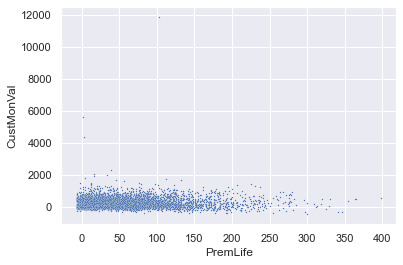

In [608]:
sns.scatterplot(data=df[(df['PremLife']<500)&(df['CustMonVal']>-2000)],x='PremLife',y='CustMonVal',s=2)
#No gap detectable.
#No cluster detectable.

<a class="anchor" id="PremWork">

### L. PremWork

</a>

In [609]:
df['PremWork'].describe()
#Mean indicates a very low profit margin of 41 on average.

count    10210.000000
mean        41.277514
std         51.513572
min        -12.000000
25%         10.670000
50%         25.670000
75%         56.790000
max       1988.700000
Name: PremWork, dtype: float64

<AxesSubplot:ylabel='PremWork'>

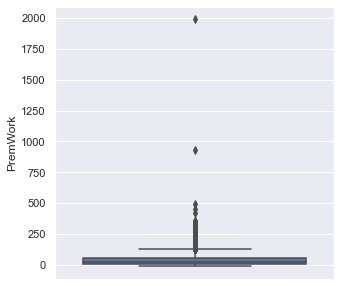

In [610]:
plt.figure(figsize=(5,5))
sns.boxplot(data=df,y='PremWork')
#Detected one outlier with a very high value.

<AxesSubplot:ylabel='PremWork'>

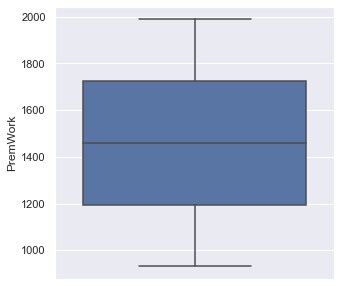

In [611]:
plt.figure(figsize=(5,5))
sns.boxplot(data=df[df['PremWork']>750],y='PremWork')
#Visualising the feature exclusing two outliers.

In [612]:
selection = df[df["PremWork"]>750].shape[0]

print(f"Number of outliers: {selection}")

Number of outliers: 2


In [613]:
df[df['PremWork']<0].head()
#A lot of corrected premiums in 2016
#Premium with the largest number of paybacks.
#No distinct correlation/reasoning detectable.

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
29.0,1995.0,1952.0,b'3 - BSc/MSc',3639.0,4.0,0.0,264.17,0.50,301.28,18.90,258.05,-4.00,-0.11
30.0,1980.0,1972.0,b'3 - BSc/MSc',2660.0,3.0,0.0,2.00,0.96,524.21,25.00,54.90,7.00,-5.00
31.0,1988.0,1975.0,b'2 - High School',2148.0,4.0,1.0,427.76,0.19,483.09,-15.00,92.24,3.89,-5.11
52.0,1982.0,1966.0,b'3 - BSc/MSc',3234.0,4.0,1.0,-14714.08,25.36,557.44,20.00,29.56,5.00,-9.00
65.0,1982.0,1973.0,b'3 - BSc/MSc',2294.0,3.0,0.0,-124.32,1.19,452.53,-45.55,104.91,17.78,-4.11


<AxesSubplot:xlabel='PremWork', ylabel='CustMonVal'>

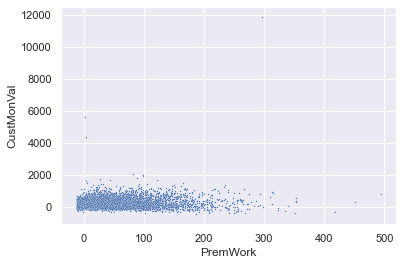

In [614]:
sns.scatterplot(data=df[(df['PremWork']<500)&(df['CustMonVal']>-2000)],x='PremWork',y='CustMonVal',s=2)
#No gap detectable.
#No cluster detectable.

In [615]:
mask = (df['PremMotor'] < 0) | (df['PremHealth'] < 0) | (df['PremWork'] < 0) | (df['PremHousehold'] < 0) | (df['PremLife'] < 0)
filtered_df = df.loc[mask]
num_negatives = mask.sum()
num_negatives

2234

<a class="anchor" id="DataPre-Processing">

# 3. Data Pre-Processing

</a>

Identify customer segements. Invest time into evaluating your preprocessing pipeling, thinking how you want to do your
clustering, possible approaches, and advantages or disadvantages of different decisions.


<a class="anchor" id="Missingiandnconsistentvalues">

## 3.1. Missing and inconsistent values

</a>

In the following we will perform data editing by fixing inconsistent and missing values.

#### Inconsistent values

In [616]:
#df[df['FirstPolYear']==53784]
#Inconsistent value will further be handeled like a missing value.
#As we decided to treat wrong values not as outliers.
df.at[9295,'FirstPolYear'] = np.nan

In [617]:
#df[df['BirthYear']==1028]
#Inconsistent value will further be handeled like a missing value.
#As we decided to treat wrong values not as outliers.
df.at[7196, 'BirthYear'] = np.nan

#### Impute missing values with mode and median 

In [618]:
# https://vitalflux.com/pandas-impute-missing-values-mean-median-mode/
#Taking a look at the missing values again.
#We have missing values in 10 out of 13 features.
#In the following we will replacethe missing values.
df.isnull().sum()

FirstPolYear      31
BirthYear         18
EducDeg           17
MonthSal          36
GeoLivArea         1
Children          21
CustMonVal         0
ClaimsRate         0
PremMotor         34
PremHousehold      0
PremHealth        43
PremLife         104
PremWork          86
dtype: int64

In [619]:
#Education
#df['EducDeg'] = df['EducDeg'].fillna(df['EducDeg'].mode()[0])
#Filling the 17 missing values with the mode
#Only categorical variable.
#Decided to fill the missing values with the mode as we do not want to loose more data in the rows.

In [620]:
#GeoLivArea
#df['GeoLivArea'] = df['GeoLivArea'].fillna(df['GeoLivArea'].mode()[0])
#Filling the one missing value of the living area feature with the mode.
#Nominal variable.

In [621]:
#Children
#df['Children'] = df['Children'].fillna(df['Children'].mode()[0])
#Filling the one missing value of the children feature with the mode.
#Binary variable.

In [622]:
#Filling the missing values of the remaining discrete variables with the median.
#df.fillna(df.median(numeric_only=True), inplace=True)

In [623]:
# #Control if everything worked well
# df.isnull().sum()

#### Impute missing values using KnnImputer
- First, with five neighbors for numerical variables.
- Second, using one neighbor for categorical variables.

In [624]:
#Implementing the Knn Imputer for numerical variables
nan_imputer = KNNImputer(n_neighbors=5,weights='distance')
filled_val_num = nan_imputer.fit_transform(df[numerical_features])

In [625]:
df_knn_num = pd.DataFrame(filled_val_num,columns=numerical_features)
df_knn_num.head()

,FirstPolYear,BirthYear,MonthSal,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
0,1985.0,1982.0,2177.0,380.97,0.39,375.85,79.45,146.36,47.01,16.89
1,1981.0,1995.0,677.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
2,1991.0,1970.0,2277.0,504.67,0.28,206.15,224.50,124.58,86.35,99.02
3,1990.0,1981.0,1099.0,-16.99,0.99,182.48,43.35,311.17,35.34,28.34
4,1986.0,1973.0,1763.0,35.23,0.90,338.62,47.80,182.59,18.78,41.45


Change of the variable EducDeg a priori for imputing missing values

In [626]:
#As we have an ordinal order in our dataset, it makes sense to transform the variable EducDeg into a 
#numerical type. One-Hot_encoding does not add value in this regard.
df["EducDeg"].unique()

#Changing the values of the feature.
df['EducDeg'] = df['EducDeg'].replace({b'1 - Basic': '1'}).replace({b'2 - High School': '2'})\
        .replace({b'3 - BSc/MSc': '3'}).replace({b'4 - PhD': '4'})


#Done here in order to the knnimputer work for categorical data.

In [627]:
#Implementing the Knn Imputer for categorical variables
imputer = KNNImputer(n_neighbors=1)
filled_cat_val = imputer.fit_transform(df[categorical_features])

In [628]:
df_knn_cat = pd.DataFrame(filled_cat_val,columns=categorical_features)
df_knn_cat.head()

,EducDeg,GeoLivArea,Children
0,2.0,1.0,1.0
1,2.0,4.0,1.0
2,1.0,3.0,0.0
3,3.0,4.0,1.0
4,3.0,4.0,1.0


In [629]:
#Combining the two dataframes
df = pd.concat([df_knn_num,df_knn_cat],axis=1)
df.head()

,FirstPolYear,BirthYear,MonthSal,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,EducDeg,GeoLivArea,Children
0,1985.0,1982.0,2177.0,380.97,0.39,375.85,79.45,146.36,47.01,16.89,2.0,1.0,1.0
1,1981.0,1995.0,677.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13,2.0,4.0,1.0
2,1991.0,1970.0,2277.0,504.67,0.28,206.15,224.50,124.58,86.35,99.02,1.0,3.0,0.0
3,1990.0,1981.0,1099.0,-16.99,0.99,182.48,43.35,311.17,35.34,28.34,3.0,4.0,1.0
4,1986.0,1973.0,1763.0,35.23,0.90,338.62,47.80,182.59,18.78,41.45,3.0,4.0,1.0


In [630]:
df.isnull().sum()

FirstPolYear     0
BirthYear        0
MonthSal         0
CustMonVal       0
ClaimsRate       0
PremMotor        0
PremHousehold    0
PremHealth       0
PremLife         0
PremWork         0
EducDeg          0
GeoLivArea       0
Children         0
dtype: int64

<a class="anchor" id="FeatureEngineering">

## 3.2. Feature Engineering

</a>

 In the following data wrangling (feature extraction/engineering and transformation) is performed.

In [631]:
#Transforming the variable first policy year in order to make it more intuitive and easier to interpret.
#Classify number of years insuranced.
df['CustomerYears'] = 2016 - df['FirstPolYear']
df = df.drop(["FirstPolYear"], axis= 1)

In [632]:
#Feature transfroming in order to make it more intuitive and simple to interpret.
#Adding the variable age to the dataframe and the subset as well as removing the feature birth year.
df['Age'] = 2016 - df['BirthYear']
df = df.drop(["BirthYear"], axis= 1)

In [633]:
# creating a dataset with the original feautures (only FirstPolYear and BirthYear changed)
#Scaled with outliers for the DBScan outlier removal
df_original_features = df.copy()

In [634]:
#Transforming the variable monthly salary into annual salary to have a proper benchmark.
#Dropping the variable monthly salary.
#Calculating the slary effort and saving the results in a new variable.

df['Total_Prem'] = df['PremMotor']+df['PremHousehold']+df['PremHealth']+df['PremLife']+df['PremWork']
df['%MotorPrem'] = round((df['PremMotor'] / df['Total_Prem']) * 100,0)
df['%HouseholdPrem'] = round((df['PremHousehold'] / df['Total_Prem']) * 100,0)
df['%HealthPrem'] = round((df['PremHealth'] / df['Total_Prem']) * 100,0)
df['%LifePrem'] = round((df['PremLife'] / df['Total_Prem']) * 100,0)
df['%WorkPrem'] = round((df['PremWork'] / df['Total_Prem']) * 100,0)
df['AnnualSal'] = df['MonthSal']*12
df.drop('MonthSal',axis=1,inplace=True)
df['Salary_effort'] = round((df['Total_Prem']/df['AnnualSal'])*100,0)

In [635]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10296 entries, 0 to 10295
Data columns (total 20 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   CustMonVal      10296 non-null  float64
 1   ClaimsRate      10296 non-null  float64
 2   PremMotor       10296 non-null  float64
 3   PremHousehold   10296 non-null  float64
 4   PremHealth      10296 non-null  float64
 5   PremLife        10296 non-null  float64
 6   PremWork        10296 non-null  float64
 7   EducDeg         10296 non-null  float64
 8   GeoLivArea      10296 non-null  float64
 9   Children        10296 non-null  float64
 10  CustomerYears   10296 non-null  float64
 11  Age             10296 non-null  float64
 12  Total_Prem      10296 non-null  float64
 13  %MotorPrem      10296 non-null  float64
 14  %HouseholdPrem  10296 non-null  float64
 15  %HealthPrem     10296 non-null  float64
 16  %LifePrem       10296 non-null  float64
 17  %WorkPrem       10296 non-null 

In [636]:
#Updating the two dataframes after data engineering
df["GeoLivArea"] = df["GeoLivArea"].astype(object)
df["Children"] = df["Children"].astype(object)
df["EducDeg"] = df["EducDeg"].astype(object)

categorical_features_transformed = list(df.select_dtypes(exclude=np.number).columns)
numerical_features_transformed = list(df.select_dtypes(include=np.number).columns)

#Creating two dataframes
df_numerical_transformed = df[numerical_features_transformed]
df_categorical_transformed = df[categorical_features_transformed]

features_transformed = numerical_features_transformed + categorical_features_transformed
features_transformed

['CustMonVal',
 'ClaimsRate',
 'PremMotor',
 'PremHousehold',
 'PremHealth',
 'PremLife',
 'PremWork',
 'CustomerYears',
 'Age',
 'Total_Prem',
 '%MotorPrem',
 '%HouseholdPrem',
 '%HealthPrem',
 '%LifePrem',
 '%WorkPrem',
 'AnnualSal',
 'Salary_effort',
 'EducDeg',
 'GeoLivArea',
 'Children']

In [637]:
categorical_features_transformed

['EducDeg', 'GeoLivArea', 'Children']

In [638]:
df_numerical_transformed.corr()

,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,CustomerYears,Age,Total_Prem,%MotorPrem,%HouseholdPrem,%HealthPrem,%LifePrem,%WorkPrem,AnnualSal,Salary_effort
CustMonVal,1.000000,-0.992622,0.033531,0.032664,0.000936,0.010615,0.020263,0.003472,-0.003811,0.043359,-0.016991,0.042376,-0.038672,-0.000889,0.002020,-0.003274,0.024767
ClaimsRate,-0.992622,1.000000,-0.006471,-0.007958,0.006084,0.001272,-0.001212,-0.003888,-0.005148,-0.005046,-0.004266,-0.011792,0.026896,0.004261,0.003721,-0.003480,0.000246
PremMotor,0.033531,-0.006471,1.000000,-0.277196,-0.078093,-0.412147,-0.352446,0.005248,0.174701,0.112854,0.660103,-0.462510,-0.264749,-0.391996,-0.379076,0.135621,-0.171258
PremHousehold,0.032664,-0.007958,-0.277196,1.000000,0.024833,0.264177,0.241795,0.009861,-0.170178,0.692144,-0.499446,0.675485,-0.207687,0.117744,0.114755,-0.132950,0.478336
PremHealth,0.000936,0.006084,-0.078093,0.024833,1.000000,0.028290,0.080392,-0.003996,-0.002599,0.622757,-0.165713,0.029147,0.299499,0.022471,0.025410,-0.002113,0.585075
PremLife,0.010615,0.001272,-0.412147,0.264177,0.028290,1.000000,0.348589,-0.010471,-0.259701,0.168790,-0.615825,0.424140,-0.041360,0.946399,0.350265,-0.195669,0.297516
PremWork,0.020263,-0.001212,-0.352446,0.241795,0.080392,0.348589,1.000000,-0.017555,-0.234551,0.217126,-0.560679,0.376057,-0.037976,0.317592,0.899464,-0.174620,0.303715
CustomerYears,0.003472,-0.003888,0.005248,0.009861,-0.003996,-0.010471,-0.017555,1.000000,-0.017525,0.004260,0.013523,-0.008388,-0.005541,-0.008194,-0.012041,-0.023241,0.015982
Age,-0.003811,-0.005148,0.174701,-0.170178,-0.002599,-0.259701,-0.234551,-0.017525,1.000000,-0.102158,0.218237,-0.217428,0.102143,-0.200346,-0.195287,0.787644,-0.480612
Total_Prem,0.043359,-0.005046,0.112854,0.692144,0.622757,0.168790,0.217126,0.004260,-0.102158,1.000000,-0.304224,0.399559,-0.094592,0.055871,0.064821,-0.078584,0.711175


<AxesSubplot:>

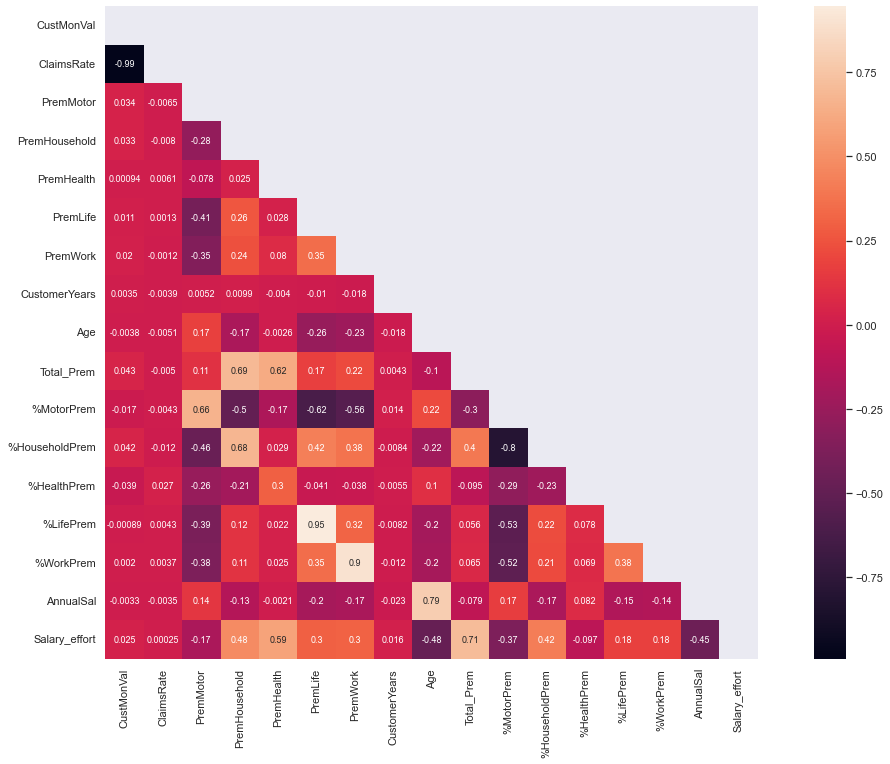

In [639]:
#Create a heatmap to check correlation between newly created numerical features.
#As expeceted, Age and CustomerYear have identical correlation as previously defined due to mutual information.
#The feature Education does not reveal strong correlations with a meaningful interpretation.
#The correlation matrix shows, that PCA (principal component analysis) does not add value to
#apply before introducing the clustering algorithm for noise reduction
#PCA is meant for variables with a strong correlation. 
#As our correlation coefficients are not substantial, PCA makes no sense in the following.

corr_matrix = df_numerical_transformed.corr()

#Generate a mask for the upper triangle.
mask = np.zeros_like(corr_matrix)
mask[np.triu_indices_from(mask)] = True

#Draw the heatmap with the mask.
plt.figure(figsize=(20, 12))
sns.heatmap(corr_matrix, mask=mask, square=True, annot=True, annot_kws={"size": 9})

<a class="anchor" id="Handlingoutliers">

## 3.3. Handling outliers

</a>

To compare later on scores of our models with different training data, we create three datasets:

#### Dataset without outlier handling

In [640]:
#For Clustering algorithms, which are not sensitive to sclaing.
df_with_outliers = df.copy()

#### Outlier detection using DBScan

In [641]:
# # it is common practise to use 2*dim as MinPts for DBScan.
# # We have 20 numerical features-> so we choose twice this dimensions as n_neighbors =40
# # Minimum samples (“MinPts”): the fewest number of points required to form a cluster
# # Calculate the average distance between each point in the data set and its 
# #20 nearest neighbors (selected MinPts value)

#neigh = NearestNeighbors(n_neighbors=26)
#nbrs = neigh.fit(df)
#distances, indices = nbrs.kneighbors(df)

In [642]:
# # plot a k-distance plot to see the best epsilon value.
# (epsilon or “eps”): the maximum distance two points can be from one another while still 
# belonging to the same cluster
#distances = np.sort(distances, axis=0)
#distances = distances[:,1]
#plt.figure(figsize=(20,10))
#plt.plot(distances)
#plt.xlim(0, 10400)
#plt.ylim(0, 1000)
#plt.axhline(y=200,color='r', linestyle='-')
#plt.title('K-distance Graph',fontsize=20)
#plt.xlabel('Data Points sorted by distance',fontsize=14)
#plt.ylabel('Epsilon',fontsize=14)
#plt.show()
## point of maximum curvature represents the best eps value (around 0.68 eps)

In [643]:
# # create a DBSCAN object and fit it to the data
#dbscan = DBSCAN(eps=200, min_samples=40)
#dbscan.fit(df_original_features)
#
## get the labels for each data point
#labels = dbscan.labels_
#
## identify outliers as data points that are not in any cluster
#outliers = (labels == -1)
#
## remove the outliers from the dataset
#df_without_outliers_dbscan = df_original_features[~outliers]

In [644]:
# #see how much data got removed
# # original dataset
#print('Percentage of data kept after removing outliers:', np.round(df_without_outliers_dbscan.shape[0] / df.shape[0], 4))

#### Dataset with outlier handling using outlier capping

In [645]:
outlier_features = numerical_features_transformed
df_outlier_capping = outlier_capping(df, outlier_features)
df_without_outliers = df_outlier_capping.copy()

In [646]:
outlier_features 

['CustMonVal',
 'ClaimsRate',
 'PremMotor',
 'PremHousehold',
 'PremHealth',
 'PremLife',
 'PremWork',
 'CustomerYears',
 'Age',
 'Total_Prem',
 '%MotorPrem',
 '%HouseholdPrem',
 '%HealthPrem',
 '%LifePrem',
 '%WorkPrem',
 'AnnualSal',
 'Salary_effort']

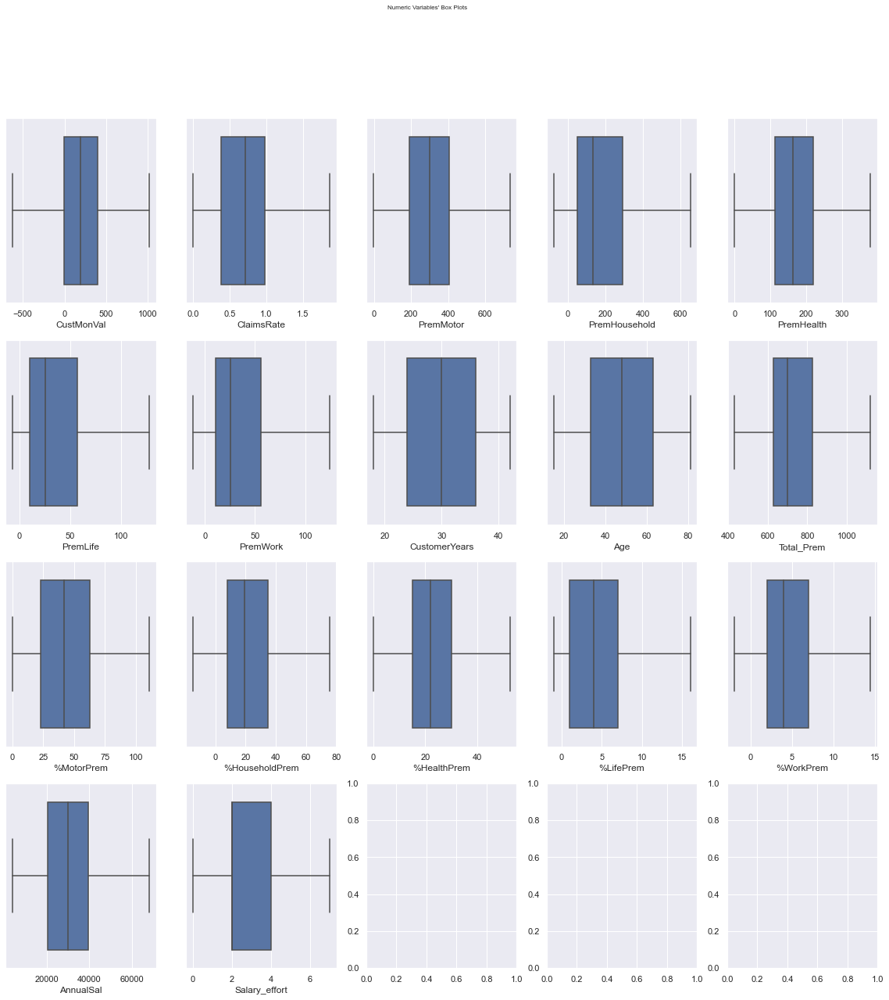

In [647]:
# All Numeric Variables' Box Plots in one figure
sns.set()

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(4, ceil(len(df_without_outliers.drop(['EducDeg','GeoLivArea','Children'],axis=1).columns) / 4), figsize=(20, 20))

# Plot data
# Iterate across axes objects and associate each box plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), df_without_outliers.drop(['EducDeg','GeoLivArea','Children'],axis=1).columns): # Notice the zip() function and flatten() method
    sns.boxplot(x=df_without_outliers.drop(['EducDeg','GeoLivArea','Children'],axis=1)[feat], ax=ax)
    
# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Box Plots"

plt.suptitle(title)

plt.show()

<a class="anchor" id="RepeatedDataExploration">

## 3.4. Repeated Data Exploration

</a>

As now the data cleansing part in terms of outlier removal has been fullfilled, we are able to perform better visualizations. Checking the distributions and interpreting relationships.

Text(0.5, 1.0, 'Distribution of Years as a Customer')

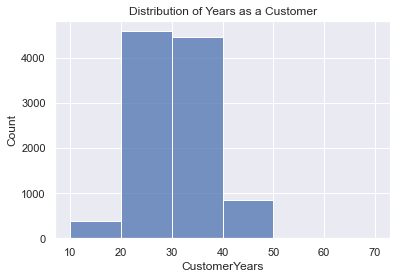

In [648]:
sns.histplot(data=df_without_outliers, x="CustomerYears", bins = list(range(10, 80, 10)))
plt.title("Distribution of Years as a Customer")

Text(0.5, 1.0, "Distribution of the Customer's Age")

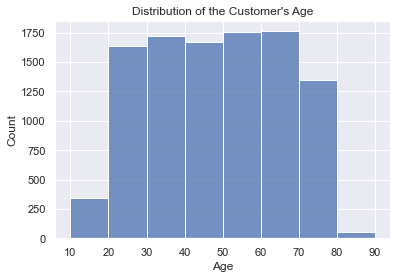

In [649]:
sns.histplot(data=df_without_outliers, x="Age", bins = list(range(10, 100, 10)))
plt.title("Distribution of the Customer's Age")

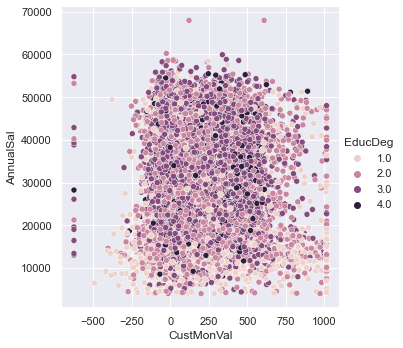

In [650]:
sns.relplot(
    data=df_without_outliers, x="CustMonVal", y="AnnualSal", hue="EducDeg",
)
#This indicates a very well distrubution of the three variables.
#No trend detectable, despite of young people having a lower educational degree.
#Some remaining outliers detected.

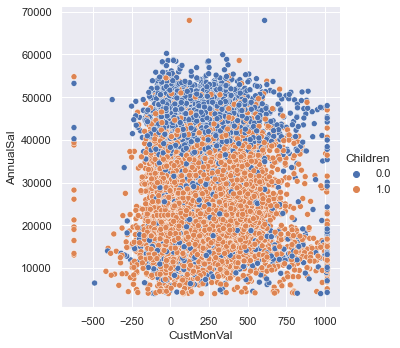

In [651]:
sns.relplot(
    data=df_without_outliers, x="CustMonVal", y="AnnualSal", hue="Children",
)
#Overall there is only the trend detectable, that people with a higher salary have no and therefore less children.
#Some remaining outliers detected.
#Having children does not indicate a relationship with the lifetime value.
#Also, the salary does not seem to have a clear relationship with the lifetime value.

In [652]:
# sns.pairplot(df_without_outliers, hue="GeoLivArea")
#Pairplot indicating total randomness of the feature.

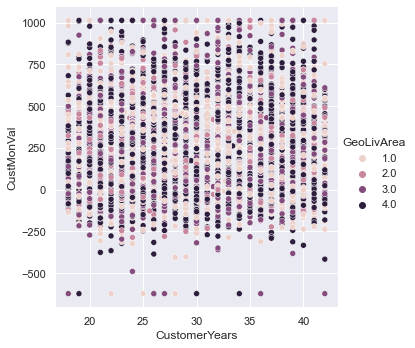

In [653]:
sns.relplot(
    data=df_without_outliers, x="CustomerYears", y="CustMonVal", hue="GeoLivArea",
)
#After outlier removal there is no dependency with the living area in terms of customer characteristics detectable.
#Some remaining outliers detected.

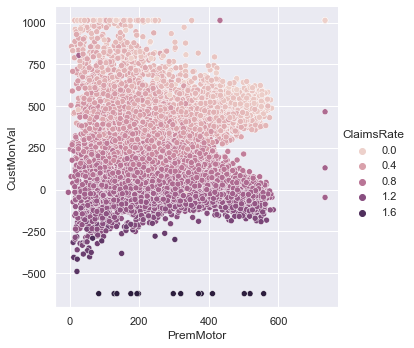

In [654]:
sns.relplot(
    data=df_without_outliers, x="PremMotor", y="CustMonVal", hue="ClaimsRate",)
#Thinking about the premium going deeper into correlations with the features claims rate and lifetime value. 
#The only trend detectable is, that customers with higher claims rates have a lower customer lifetime value.
#This is rational and already seen in the analysis before.
#Some remaining capped outliers detected.
#High claim rates are being detected for customers with low lifetime value and there is no dependency detected with the premium.

<a class="anchor" id="VariableSelection">

## 3.5. Variable Selection

</a>

In the following, selected features will be removed based on their relevance as part of the Pre-Processing.

In the following: A subset of the variables in the dataset is selected. If highly correlated features exist, one is being removed to avoid bias. The purpose of feature selection is to reduce the dimensionality to avoid discrimination, reduce noise and simplify interpretation. 

- Remove ClaimsRate due to its high correlation of -0.99 with the variable MonthVal.
- Remove GeoLivArea due to no clear structure of the data points as seen in pairplot, only providing noise.
- Remove CustomerYears due to an overall low correlation.

In [655]:
df_without_outliers.head().T

,0,1,2,3,4
CustMonVal,380.97,-131.13,504.67,-16.99,35.23
ClaimsRate,0.39,1.12,0.28,0.99,0.9
PremMotor,375.85,77.46,206.15,182.48,338.62
PremHousehold,79.45,416.2,224.5,43.35,47.8
PremHealth,146.36,116.69,124.58,311.17,182.59
PremLife,47.01,127.69,86.35,35.34,18.78
PremWork,16.89,106.13,99.02,28.34,41.45
EducDeg,2.0,2.0,1.0,3.0,3.0
GeoLivArea,1.0,4.0,3.0,4.0,4.0
Children,1.0,1.0,0.0,1.0,1.0


In [656]:
#Removing the decided variable from the dataframes
df_with_outliers.drop(["ClaimsRate"],axis=1,inplace=True)
df_without_outliers.drop(["ClaimsRate"],axis=1,inplace=True)
df_with_outliers.drop(["GeoLivArea"],axis=1,inplace=True)
df_without_outliers.drop(["GeoLivArea"],axis=1,inplace=True)
df_with_outliers.drop(["CustomerYears"],axis=1,inplace=True)
df_without_outliers.drop(["CustomerYears"],axis=1,inplace=True)
#Removing the decided variable from the lists
numerical_features.remove('ClaimsRate')
numerical_features_transformed.remove('ClaimsRate')
features_transformed.remove('ClaimsRate')
categorical_features.remove('GeoLivArea')
categorical_features_transformed.remove('GeoLivArea')
features_transformed.remove('GeoLivArea')
# numerical_features.remove('CustomerYears')
numerical_features_transformed.remove('CustomerYears')
features_transformed.remove('CustomerYears')

In [657]:
df_without_outliers.head().T

,0,1,2,3,4
CustMonVal,380.97,-131.13,504.67,-16.99,35.23
PremMotor,375.85,77.46,206.15,182.48,338.62
PremHousehold,79.45,416.2,224.5,43.35,47.8
PremHealth,146.36,116.69,124.58,311.17,182.59
PremLife,47.01,127.69,86.35,35.34,18.78
PremWork,16.89,106.13,99.02,28.34,41.45
EducDeg,2.0,2.0,1.0,3.0,3.0
Children,1.0,1.0,0.0,1.0,1.0
Age,34.0,21.0,46.0,35.0,43.0
Total_Prem,665.56,910.96,740.6,600.68,629.24


In [658]:
features_transformed

['CustMonVal',
 'PremMotor',
 'PremHousehold',
 'PremHealth',
 'PremLife',
 'PremWork',
 'Age',
 'Total_Prem',
 '%MotorPrem',
 '%HouseholdPrem',
 '%HealthPrem',
 '%LifePrem',
 '%WorkPrem',
 'AnnualSal',
 'Salary_effort',
 'EducDeg',
 'Children']

<a class="anchor" id="FeatureScaling">

## 3.6. Feature Scaling

</a>

Scaling data helps to ensure that variables are weighted equally in the clustering process, and can also help to improve the interpretability of the results.

#### With Outliers

In [659]:
df_scaled_dict = return_scaled_datasets(df_with_outliers, features_transformed)

df_scale_standard = df_scaled_dict["standard"][0]

df_scale_minmax = df_scaled_dict["minmax"][0]

df_scale_minmax_minus = df_scaled_dict["minmaxminus"][0]

df_scale_robust = df_scaled_dict["robust"][0]


#### Without Outliers

In [660]:
# Returns for each of the below scaler a scaled X_train_fs dataset:
# Standard Scaler
# MinMax Scaler with feature range (0,1)
# MinMax Scaler with feature range (-1,1)
# Robust Scaler
# Saves the datasets in new variables.

df_scaled_dict_outliers_removed = return_scaled_datasets(df_without_outliers, features_transformed)

df_scale_standard_outliers_removed = df_scaled_dict_outliers_removed["standard"][0]

df_scale_minmax_outliers_removed = df_scaled_dict_outliers_removed["minmax"][0]

df_scale_minmax_minus_outliers_removed = df_scaled_dict_outliers_removed["minmaxminus"][0]

df_scale_robust_outliers_removed = df_scaled_dict_outliers_removed["robust"][0]

In [661]:
df_scale_robust_outliers_removed.head()

,CustMonVal,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Age,Total_Prem,%MotorPrem,%HouseholdPrem,%HealthPrem,%LifePrem,%WorkPrem,AnnualSal,Salary_effort,EducDeg,Children
0,0.474320,0.352792,-0.221737,-0.154006,0.457555,-0.193179,-0.466667,-0.167990,0.350,-0.259259,0.000000,0.500000,-0.2,-0.204327,0.5,-1.0,0.0
1,-0.777093,-1.022024,1.177889,-0.429933,2.169779,1.770297,-0.900000,1.074652,-0.825,1.000000,-0.600000,2.000000,1.6,-1.151745,2.5,-1.0,0.0
2,0.776604,-0.429091,0.381131,-0.356557,1.292445,1.613861,-0.066667,0.211993,-0.350,0.407407,-0.333333,1.333333,1.8,-0.141165,0.5,-2.0,-1.0
3,-0.498170,-0.538150,-0.371779,1.378704,0.209890,0.058746,-0.433333,-0.496525,-0.300,-0.444444,2.000000,0.333333,0.2,-0.885204,1.5,0.0,0.0
4,-0.370561,0.181257,-0.353283,0.182928,-0.141553,0.347195,-0.166667,-0.351905,0.300,-0.407407,0.466667,-0.166667,0.6,-0.465814,0.5,0.0,0.0


To-Do: Decide on scaler

<a class="anchor" id="ClusteringAnalysis">

# 4. Clustering Analysis

</a>

In the following slected clustering algorithms are applied using the Euclidean distance as a distance measure.

In [662]:
#First approach seperating the variables for the perspectives. 
#The quality of the results were not optimal.

#Defining the demo features.
demo_features = ['EducDeg', 'Children', 'Age', 'AnnualSal']

#Defining clients value features.
value_features = ['CustMonVal', 'Total_Prem', 'Salary_effort']

#Indicates customer loyality.
product_features = ['PremMotor', 'PremHousehold', 'PremHealth', 'PremLife',
       'PremWork', '%MotorPrem', '%HouseholdPrem', '%HealthPrem', '%LifePrem', '%WorkPrem']

In [663]:
#New definition of the variables for the perspectives.

#Defining the demo features of a customer.
demo_features_new = ['EducDeg', 'Children','Age']
#We could run this cell without Age and 

#Defining clients value features indicating loyality for the analysis.
value_features_new = ['CustMonVal','AnnualSal','Salary_effort']
# therefore here with the CustomerYears to check for a positive impact on the scores.

#Indicates customer payments of the offering products.
product_features_new = ['PremMotor', 'PremHousehold', 'PremHealth', 'PremLife','PremWork']

<a class="anchor" id="DemographicSegments">

## 4.1. Demographic Segments

</a>

<a class="anchor" id="K-Prototypes">

### 4.1.1. K-Prototypes

</a>

Like k-means, k-prototypes uses a centroid-based approach to clustering, where the data points are partitioned into k clusters based on their distance to the centroids of the clusters. 

K-prototypes is a clustering algorithm that is designed to handle numerical and categorical data. It is an extension of the k-means algorithm that is specifically tailored to handle mixed data types.

In [665]:
#Sensitive to scaling and outliers. Thus, scaled dataset is used.
df_demo_features = df_without_outliers[demo_features_new]
# df_demo_features["EducDeg"] = df_demo_features["EducDeg"].astype(object)
# # df_demo_features["GeoLivArea"] = df_demo_features["GeoLivArea"].astype(object)
# df_demo_features["Children"] = df_demo_features["Children"].astype(object)
df_demo_features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10296 entries, 0 to 10295
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   EducDeg   10296 non-null  object 
 1   Children  10296 non-null  object 
 2   Age       10296 non-null  float64
dtypes: float64(1), object(2)
memory usage: 241.4+ KB


In [666]:
categorical_features_demo = list(df_demo_features.select_dtypes(exclude=np.number).columns)
numerical_features_demo = list(df_demo_features.select_dtypes(include=np.number).columns)
categorical_features_demo

['EducDeg', 'Children']

In [667]:
def elbow_kprototypes(df, categorical_features):
    cost = {}
    for k in range(1, 8):
        kproto = KPrototypes(n_clusters=k, init='Huang', n_init=1, random_state=42)
        kproto.fit_predict(df, categorical=categorical_features)
        cost[k] = kproto.cost_
    plt.figure()
    plt.plot(list(cost.keys()), list(cost.values()))
    plt.xlabel("Number of clusters")
    plt.ylabel("Cost")
    plt.show()

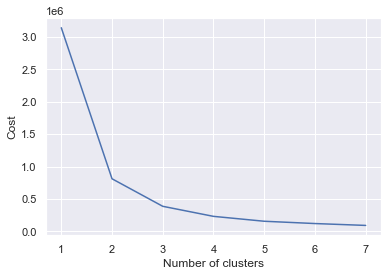

In [668]:
df = df_demo_features
categorical_features = [0]

elbow_kprototypes(df, categorical_features)

Two kinks are to be discovered in the elbow function. Thus we will run the K-Prototype Clustering Algorithm with two and three clusters.

In [669]:
def silhouette_score_kproto(df, n_clusters_range, inits, categorical_features):
    results = []
    for n_clusters in n_clusters_range:
        for init in inits:
            kproto = KPrototypes(n_clusters=n_clusters, init=init)
            clusters = kproto.fit_predict(df, categorical=categorical_features)
            silhouette_avg = silhouette_score(df, clusters)
            results.append({'Silhouette Score': silhouette_avg, 'n_clusters': n_clusters, 'init': init})
    
    df_results = pd.DataFrame(results).sort_values('Silhouette Score', ascending=False).reset_index(drop=True)
    return df_results

In [670]:
def silhouette_score_kproto_scalers(df, n_clusters_range, inits, categorical_features):
    results = []
    for n_clusters in n_clusters_range:
        for init in inits:
            for scaler in scalers:
                # Scale the data
                df_scaled = scaler.fit_transform(df)
                kproto = KPrototypes(n_clusters=n_clusters, init=init)
                clusters = kproto.fit_predict(df_scaled, categorical=categorical_features)
                silhouette_avg = silhouette_score(df_scaled, clusters)
                results.append({'Silhouette Score': silhouette_avg, 'n_clusters': n_clusters, 'init': init, 'scaler': scaler})
    
    df_results = pd.DataFrame(results).sort_values('Silhouette Score', ascending=False).reset_index(drop=True)
    return df_results

In [671]:
df = df_demo_features
categorical_features = [0, 1]
scalers = [MinMaxScaler(), MinMaxScaler(feature_range=(-1, 1)), StandardScaler(), RobustScaler()]
n_clusters_range = [2,3,4]
inits = ['Huang', 'random', 'Cao']

silhouette_score_kproto(df, n_clusters_range, inits, categorical_features)

,Silhouette Score,n_clusters,init
0,0.621989,2,Huang
1,0.621989,2,random
2,0.621989,2,Cao
3,0.575268,3,Huang
4,0.575268,3,random
5,0.574970,3,Cao
6,0.552962,4,Cao
7,0.551422,4,Huang
8,0.549152,4,random


In [672]:
# The implementataion of scalers do not have a positive impact on our analysis.
# silhouette_score_kproto_scalers(df, n_clusters_range, inits, categorical_features)

In [673]:
kproto = KPrototypes(n_clusters=3, init='Huang')
labels = kproto.fit_predict(df, categorical=categorical_features)
r2(df, labels)

0.882202851374487

In [674]:
kproto = KPrototypes(n_clusters=2, init='Huang')
labels = kproto.fit_predict(df, categorical=categorical_features)
r2(df, labels)

0.7455937478075739

In [675]:
kproto = KPrototypes(n_clusters=4, init='Huang')
labels = kproto.fit_predict(df, categorical=categorical_features)
r2(df, labels)

0.9313870417723012

In [676]:
def kprototypes(df, n_clusters, categorical_features,perplexity):
    kproto = KPrototypes(n_clusters=n_clusters, init='Huang', n_init=1)
    labels = kproto.fit_predict(df, categorical=categorical_features)
#     df['Clusters']=labels
    df_concat = pd.concat((df, pd.Series(labels, name='labels')), axis=1)
    two_dim = TSNE(random_state=42, perplexity=perplexity,n_jobs=-1).fit_transform(df)

    # Create a data frame from the transformed data
    df_tsne = pd.DataFrame(two_dim)
    # Plot the data using scatter plot

    df_tsne.plot.scatter(x=0, y=1, color=labels, colormap='tab10',figsize=(15,10))
    plt.show()

    return pd.Series(labels).value_counts()
    return kproto.cluster_centroids_
    return kproto.labels_
    return kproto.n_iter
    return kproto.cost_

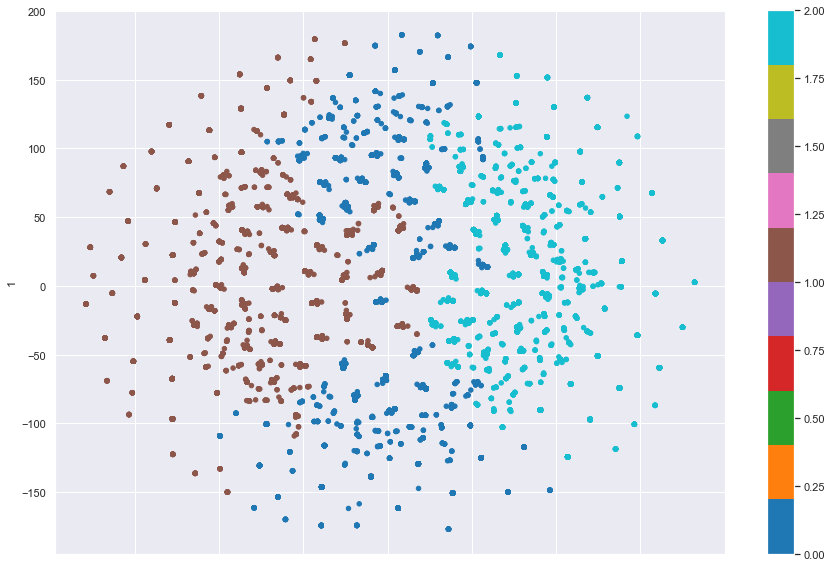

1    3704
0    3392
2    3200
dtype: int64

In [677]:
df = df_demo_features
n_clusters = 3
categorical_features = [0,1]
perplexity = 5

#KPrototypesClusteringAlgorithm().
kprototypes(df, n_clusters,categorical_features,perplexity)

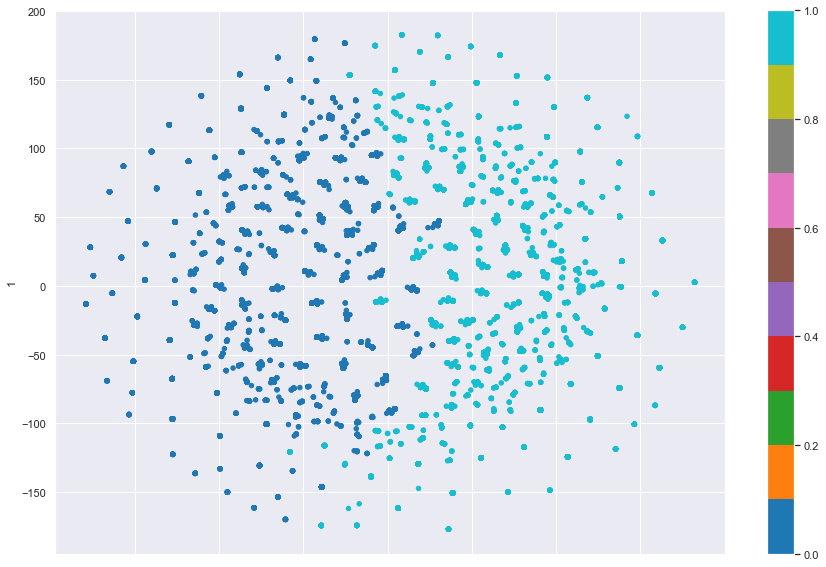

0    5195
1    5101
dtype: int64

In [678]:
df = df_demo_features
n_clusters = 2
categorical_features = [0,1]
perplexity = 5

#KPrototypesClusteringAlgorithm().
kprototypes(df, n_clusters,categorical_features,perplexity)

In [679]:
kproto = KPrototypes(n_clusters=3, init='Huang',random_state=42)
labels_kproto_three = kproto.fit_predict(df_demo_features, categorical=categorical_features)

In [680]:
df_concat_three_clusters = pd.concat((df_demo_features, pd.Series(labels_kproto_three, name='labels')), axis=1)

In [681]:
grouped = df_concat_three_clusters.groupby("labels")

# Calculate mode for categorical columns
mode_EducDeg = grouped["EducDeg"].apply(lambda x: x.value_counts().idxmax())
#mode_Children = grouped["Children"].apply(lambda x: x.mode())
mode_Children = grouped["Children"].apply(lambda x: x.value_counts().idxmax())

# Calculate mean for numerical column
mean_Age = grouped["Age"].mean().to_frame()
mode_EducDeg = mode_EducDeg.to_frame()
mode_Children = mode_Children.to_frame()

## Combine results into a new data frame
result_three = pd.concat([mode_EducDeg, mode_Children, mean_Age], axis=1)

In [682]:
demo_labels3 = result_three.rename(index={0: "40s_with_Kids", 1: "20s_with_Kids", 2: "Retired_without_Kids"})
demo_labels3
#The Education is not influencing the analysis with three clusters

,EducDeg,Children,Age
labels,,,
40s_with_Kids,3.0,1.0,48.570072
20s_with_Kids,3.0,1.0,28.064422
Retired_without_Kids,3.0,0.0,68.134260


In [683]:
pd.Series(labels_kproto_three).value_counts()

1    3519
0    3440
2    3337
dtype: int64

In [685]:
demo_labels3 = pd.Series(labels_kproto_three)
demo_labels3= demo_labels3.replace({0: "40s_with_Kids", 1: "20s_with_Kids", 2: "Retired_without_Kids"}) 
demo_labels3.head()

0    20s_with_Kids
1    20s_with_Kids
2    40s_with_Kids
3    20s_with_Kids
4    40s_with_Kids
dtype: object

In [686]:
kproto = KPrototypes(n_clusters=4, init='Huang',random_state=42)
labels_kproto_four = kproto.fit_predict(df_demo_features, categorical=categorical_features)
labels_kproto_four

array([1, 0, 1, ..., 1, 1, 1], dtype=uint16)

In [687]:
df_concat_four_clusters = pd.concat((df_demo_features, pd.Series(labels_kproto_four, name='labels')), axis=1)

In [688]:
grouped = df_concat_four_clusters.groupby("labels")

# Calculate mode for categorical columns
mode_EducDeg = grouped["EducDeg"].apply(lambda x: x.value_counts().idxmax())
#mode_Children = grouped["Children"].apply(lambda x: x.mode())
mode_Children = grouped["Children"].apply(lambda x: x.value_counts().idxmax())

# Calculate mean for numerical column
mean_Age = grouped["Age"].mean().to_frame()
mode_EducDeg = mode_EducDeg.to_frame()
mode_Children = mode_Children.to_frame()

# Combine results into a new data frame
result_four = pd.concat([mode_EducDeg, mode_Children, mean_Age], axis=1)

In [689]:
demo_labels_four_clusters = result_four.rename(index={0: "Retired_without_Kids", 1: "30s_with_Kids", 2: "20s_with_Kids", 3: "50s_with_Kids"})
demo_labels_four_clusters

,EducDeg,Children,Age
labels,,,
Retired_without_Kids,2.0,1.0,25.026158
30s_with_Kids,3.0,1.0,39.825406
20s_with_Kids,3.0,1.0,54.919728
50s_with_Kids,3.0,0.0,70.172091


In [690]:
pd.Series(labels_kproto_four).value_counts()

2    2670
3    2632
0    2501
1    2493
dtype: int64

In [691]:
demo_labels = pd.Series(labels_kproto_four)
demo_labels = demo_labels.replace({0: "Retired_without_Kids", 1: "30s_with_Kids", 2: "20s_with_Kids", 3: "50s_with_Kids"})
demo_labels.head()

0           30s_with_Kids
1    Retired_without_Kids
2           30s_with_Kids
3           30s_with_Kids
4           30s_with_Kids
dtype: object

In [692]:
# kproto = KPrototypes(n_clusters=2, init='Huang',random_state=42)
# labels_kproto_two = kproto.fit_predict(df_demo_features, categorical=categorical_features)
# labels_kproto_two

In [693]:
# df_concat_two_clusters = pd.concat((df_demo_features, pd.Series(labels_kproto_two, name='labels')), axis=1)

In [694]:
# grouped = df_concat_two_clusters.groupby("labels")

# # Calculate mode for categorical columns
# mode_EducDeg = grouped["EducDeg"].apply(lambda x: x.value_counts().idxmax())
# #mode_Children = grouped["Children"].apply(lambda x: x.mode())
# mode_Children = grouped["Children"].apply(lambda x: x.value_counts().idxmax())

# # Calculate mean for numerical column
# mean_Age = grouped["Age"].mean().to_frame()
# mode_EducDeg = mode_EducDeg.to_frame()
# mode_Children = mode_Children.to_frame()

# # Combine results into a new data frame
# result_two = pd.concat([mode_EducDeg, mode_Children, mean_Age], axis=1)

In [695]:
# demo_labels_two_clusters = result_two.rename(index={0: "Retired_with_Kids", 1: "30s_with_Kids"})
# demo_labels_two_clusters

<a class="anchor" id="ValueSegments">

## 4.2. Value Segments

</a>

<a class="anchor" id="Hierarchical+K-Means">

### 4.2.1. Hierarchical + K-Means

</a>

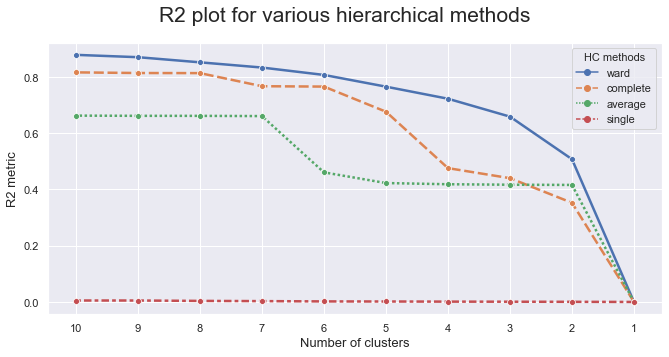

In [696]:
hierarchical().r2_plot(df_scale_minmax_outliers_removed[value_features_new])

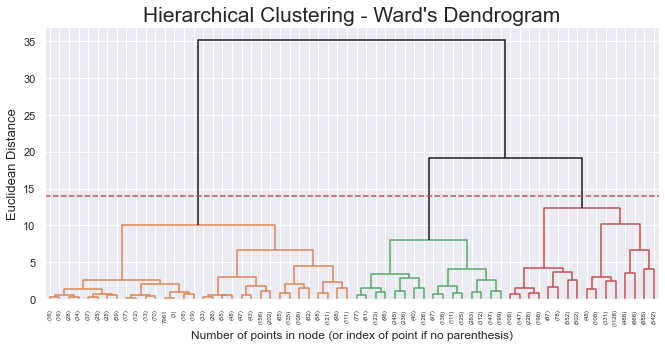

In [697]:
hierarchical().dendogram(df_scale_minmax_outliers_removed[value_features_new],'ward','euclidean',14)

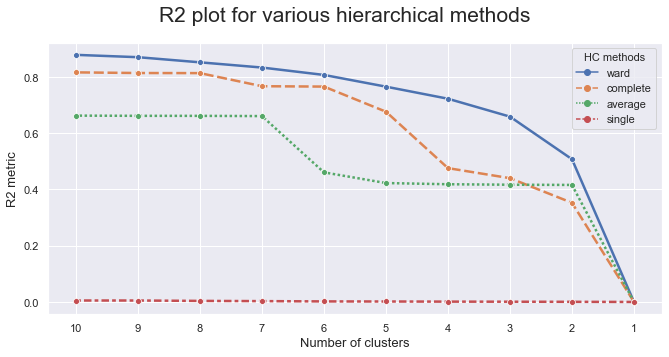

In [698]:
hierarchical().r2_plot(df_scale_minmax_minus_outliers_removed[value_features_new])

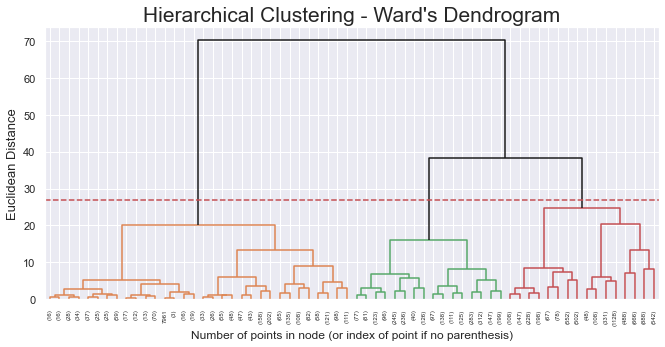

In [699]:
hierarchical().dendogram(df_scale_minmax_minus_outliers_removed[value_features_new],'ward','euclidean',27)

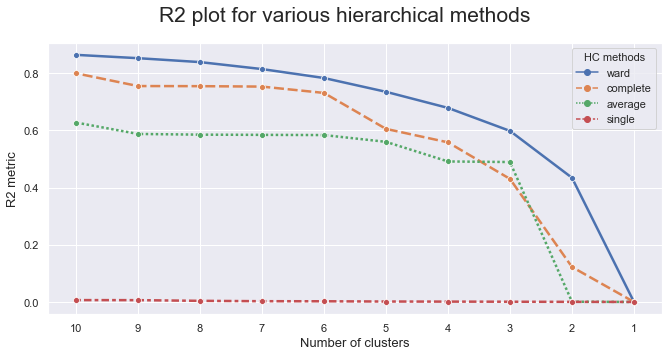

In [700]:
hierarchical().r2_plot(df_scale_robust_outliers_removed[value_features_new])
#it has a very discrepant dendogram so it was not chosen

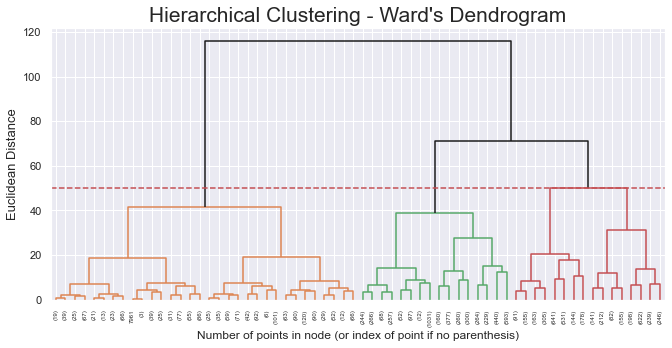

In [701]:
hierarchical().dendogram(df_scale_robust_outliers_removed[value_features_new],'ward','euclidean',50)

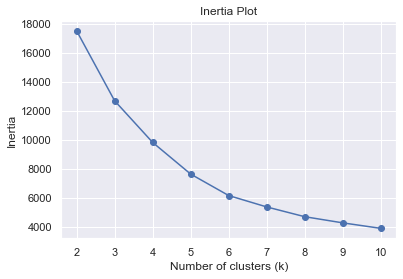

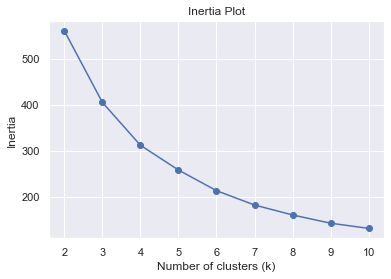

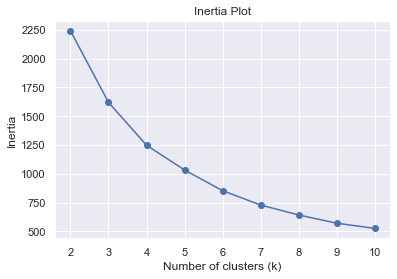

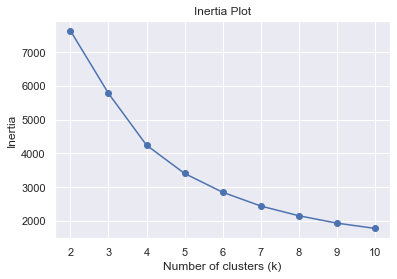

In [702]:
all_scalers = [df_scale_standard_outliers_removed[value_features_new],df_scale_minmax_outliers_removed[value_features_new],df_scale_minmax_minus_outliers_removed[value_features_new],df_scale_robust_outliers_removed[value_features_new]]
kmeans().inertia_plot(all_scalers,2,10)

In [703]:
dict_ = {}
x=0
columns=['standard','minmax','minmax_minus','robust']
for df_ in [df_scale_standard_outliers_removed,df_scale_minmax_outliers_removed,df_scale_minmax_minus_outliers_removed,df_scale_robust_outliers_removed]: 
    
    avg_silhouette = []
    for nclus in range(3,5):
        # Initialize the KMeans object with n_clusters value and a random generator
        # seed of 10 for reproducibility.
        kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
        cluster_labels = kmclust.fit_predict(df_[value_features_new])

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed clusters
        silhouette_avg = silhouette_score(df_[value_features_new], cluster_labels)
        avg_silhouette.append(silhouette_avg)
    dict_[columns[x]] = avg_silhouette
    x=x+1
    
df_scaler_ = pd.DataFrame.from_dict(data=dict_)
df_scaler_.index = [3,4]
df_scaler_

,standard,minmax,minmax_minus,robust
3,0.363158,0.353831,0.353831,0.358087
4,0.351512,0.367750,0.367750,0.373904


For n_clusters = 2, the average silhouette_score is : 0.49031362743005774
For n_clusters = 3, the average silhouette_score is : 0.35808705171796734
For n_clusters = 4, the average silhouette_score is : 0.3739036243310001
For n_clusters = 5, the average silhouette_score is : 0.38011847491492085
For n_clusters = 6, the average silhouette_score is : 0.36506696783569126
For n_clusters = 7, the average silhouette_score is : 0.36517572242483826
For n_clusters = 8, the average silhouette_score is : 0.3475630072567092
For n_clusters = 9, the average silhouette_score is : 0.35411152984971356


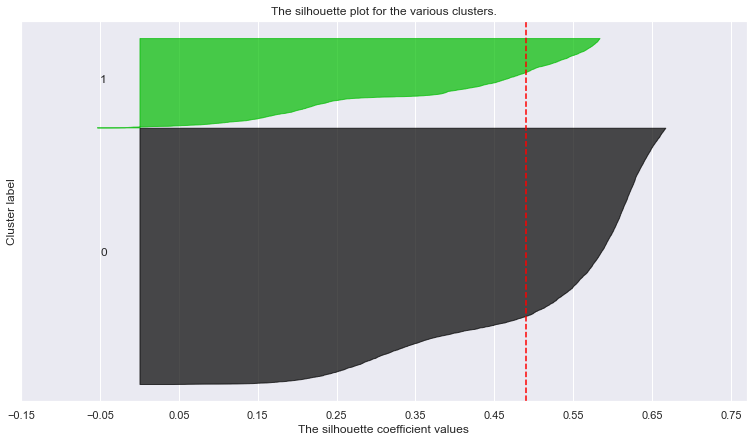

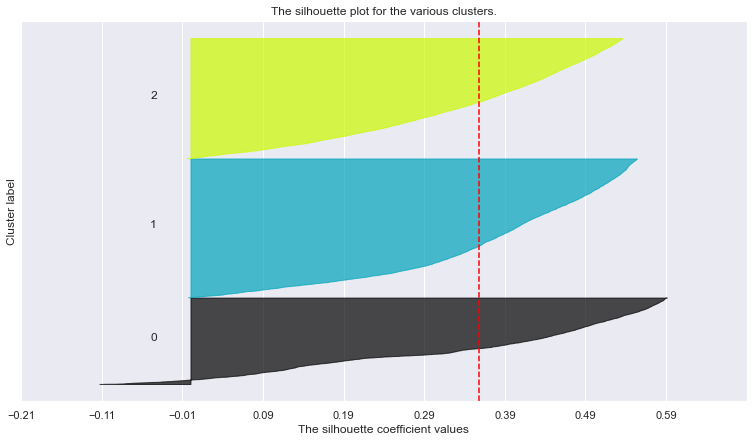

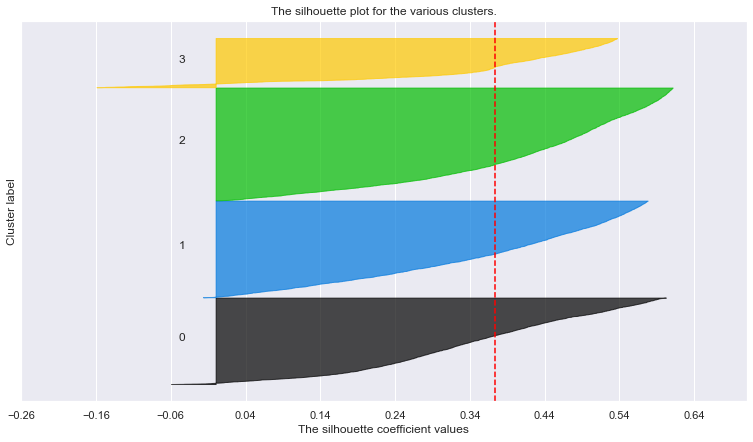

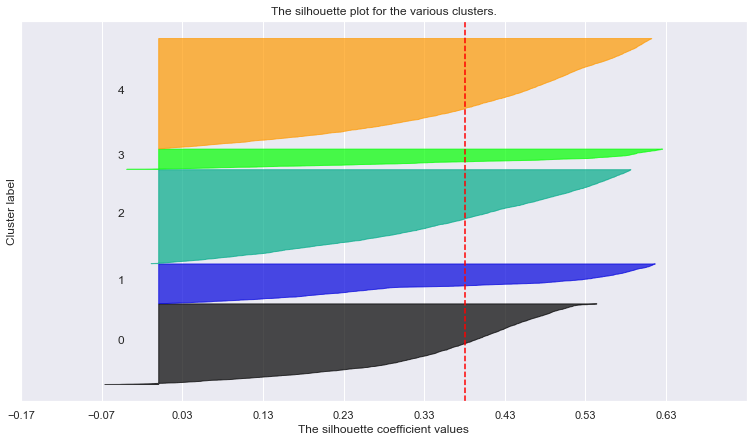

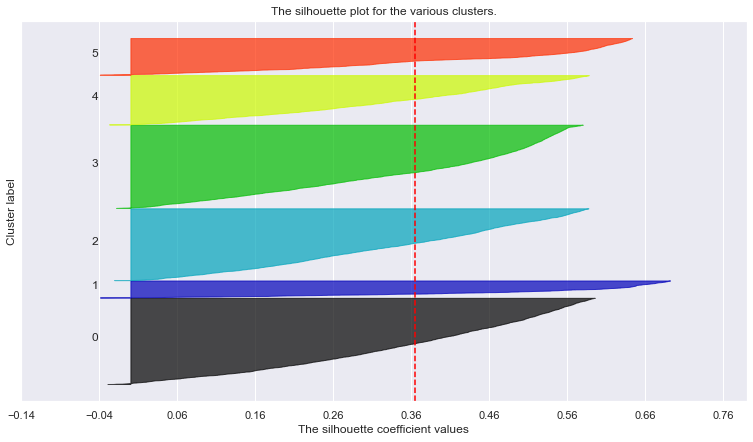

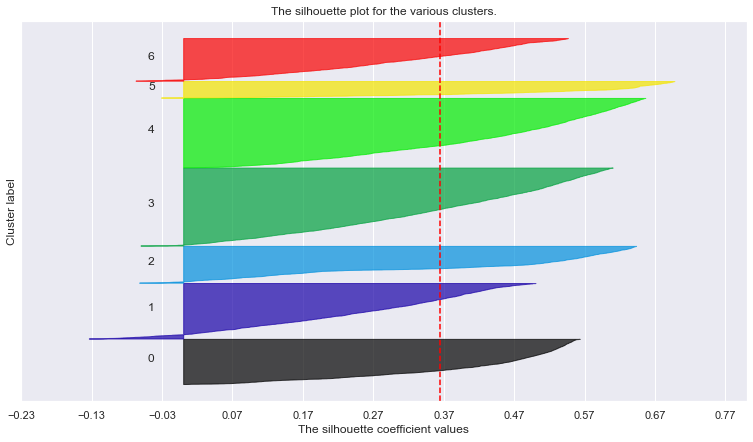

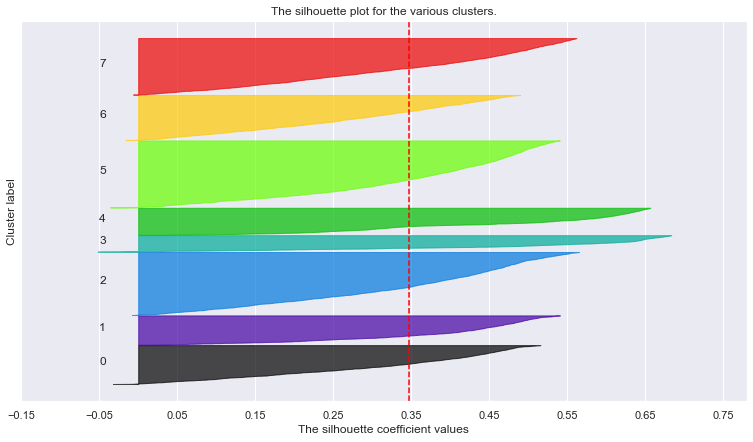

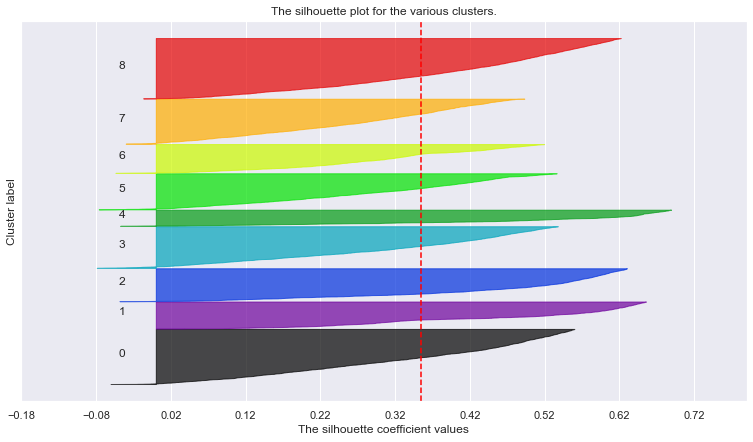

In [704]:
kmeans().silhouette(10,df_scale_robust_outliers_removed,value_features_new)

Scaler with the highest Silhouette score is MinMax with four clusters. The RobustScaler is not considered because the inertia is higher.

In [705]:
#kmeans().plot_silhouette(10,df_scale_minmax_outliers_removed,value_features_new)
#so 4 clusters (dont forget that the first value in the plot is a 0 so to every nº has to be summed 1)

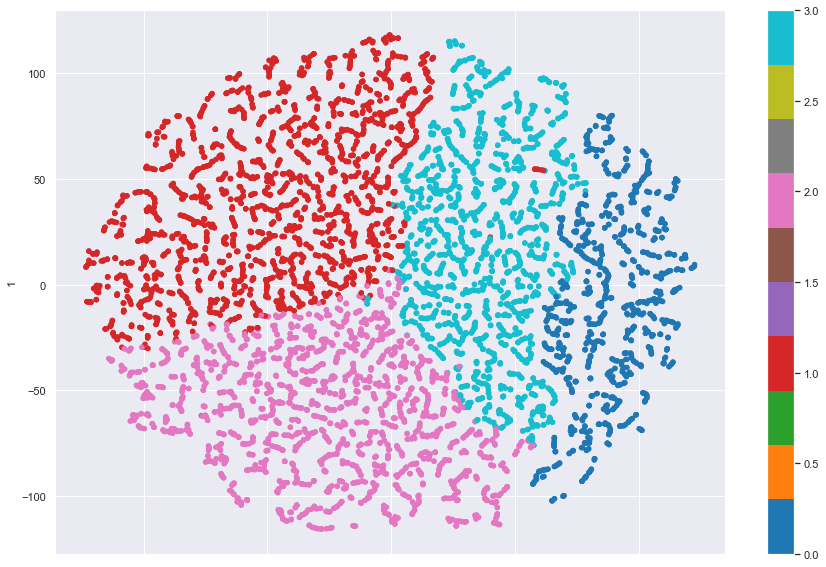

,CustMonVal,AnnualSal,Salary_effort
labels,,,
0,334.415057,12895.582822,6.537832
1,18.901102,38407.801184,1.837522
2,438.141057,36896.149230,2.016274
3,155.009726,21127.492187,3.576376


In [706]:
kmeans().kmeans_cluster(df_scale_robust_outliers_removed,df_without_outliers,value_features_new,4,5)[0]

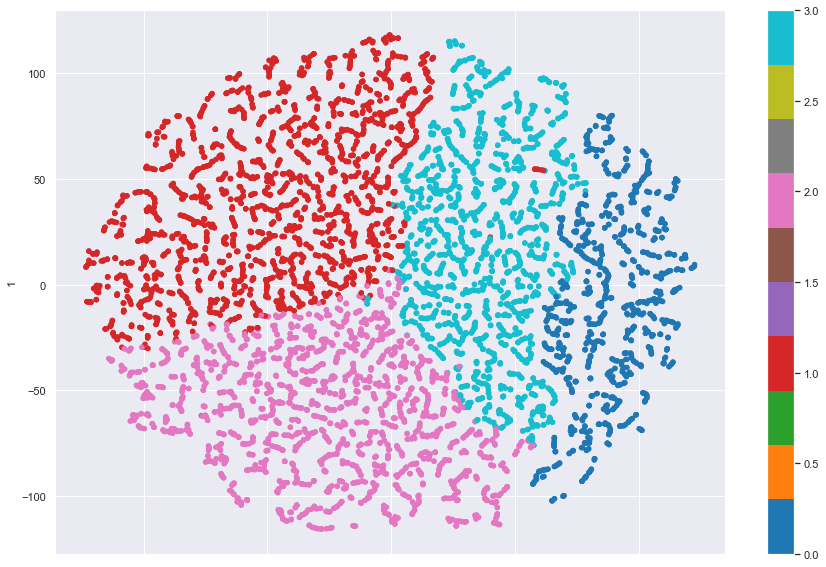

0.7009580791375369

In [707]:
kmeans().kmeans_cluster(df_scale_robust_outliers_removed,df_without_outliers,value_features_new,4,5)[1]
# Robust has 0.01 less R2 but is has the highest silhouette score thus we considered the most appropriatte scaler

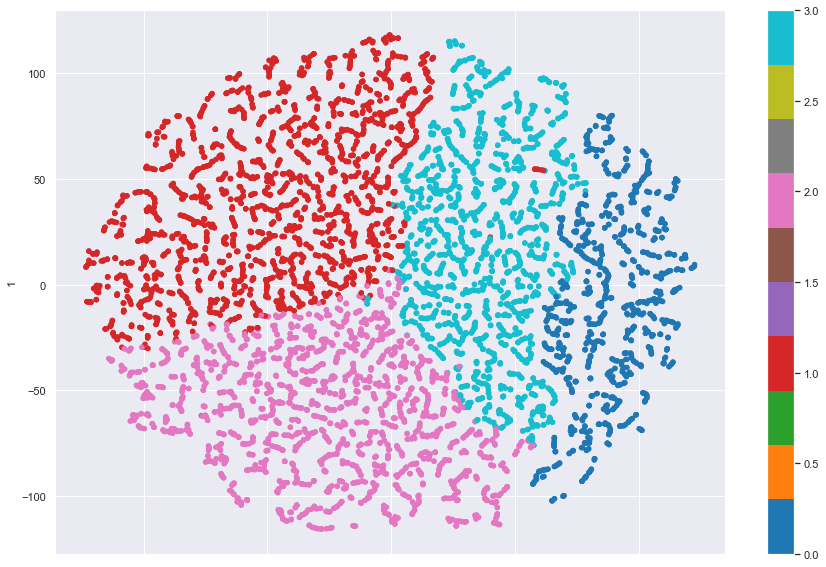

1    3342
2    2888
3    2599
0    1467
Name: labels, dtype: int64

In [708]:
kmeans().kmeans_cluster(df_scale_robust_outliers_removed,df_without_outliers,value_features_new,4,5)[2]['labels'].value_counts()

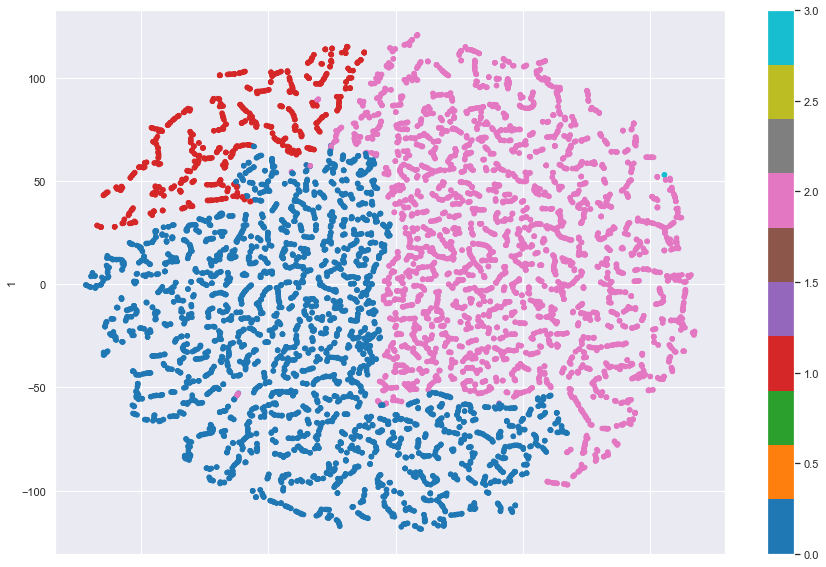

In [709]:
value_labels = kmeans().kmeans_cluster(df_scale_minmax,df_with_outliers,value_features_new,4,5)[2]['labels']

In [710]:
value_labels.head()

0    0
1    1
2    0
3    0
4    0
Name: labels, dtype: int32

In [711]:
value_labels = value_labels.replace({0: "Low_Salary_High_CMV", 1: "High_Sal_Low_CMV", 2: "High_Sal_High_CMV", 3: "Medium_Sal_Medium_CMV"})
value_labels.head()

0    Low_Salary_High_CMV
1       High_Sal_Low_CMV
2    Low_Salary_High_CMV
3    Low_Salary_High_CMV
4    Low_Salary_High_CMV
Name: labels, dtype: object

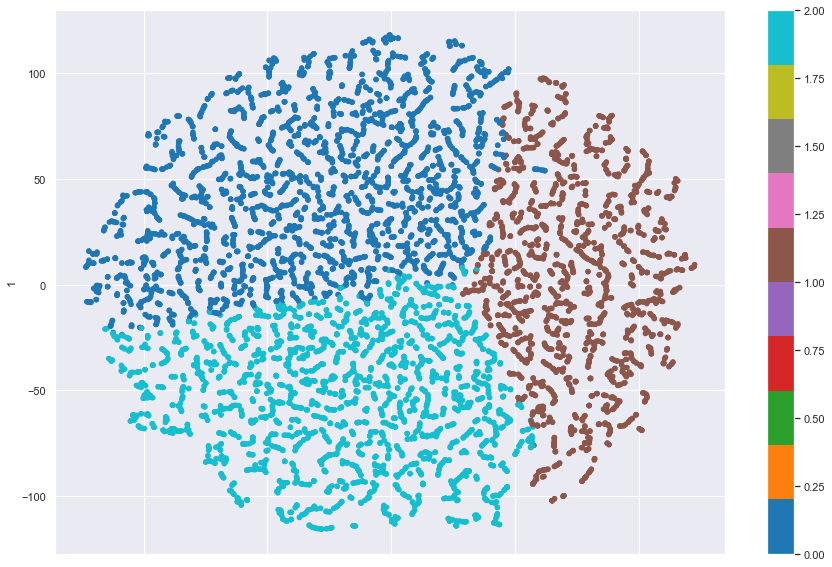

,CustMonVal,AnnualSal,Salary_effort
labels,,,
0,12.392656,34793.273964,2.119428
1,258.949208,15209.999546,5.566499
2,418.776576,35076.594866,2.157983


In [712]:
kmeans().kmeans_cluster(df_scale_robust_outliers_removed,df_without_outliers,value_features_new,3,5)[0]

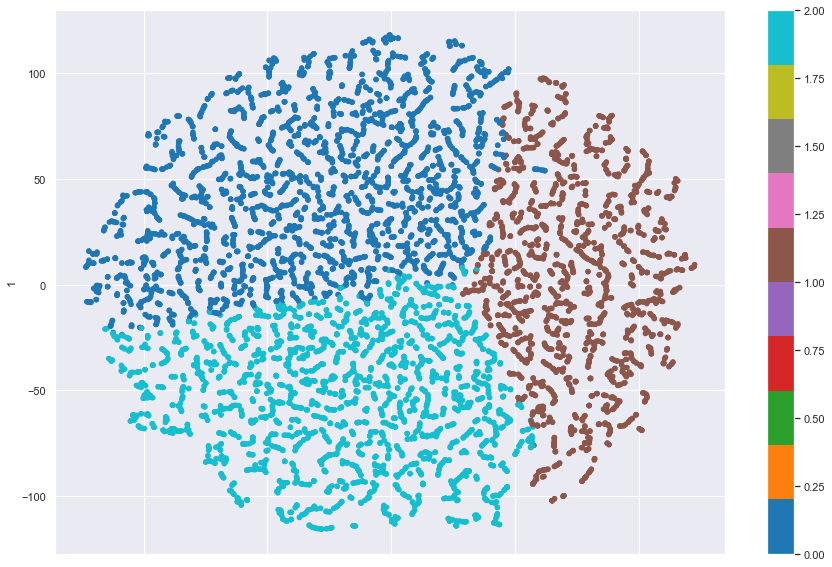

0.5229649266837867

In [713]:
kmeans().kmeans_cluster(df_scale_robust_outliers_removed,df_without_outliers,value_features_new,3,5)[1]

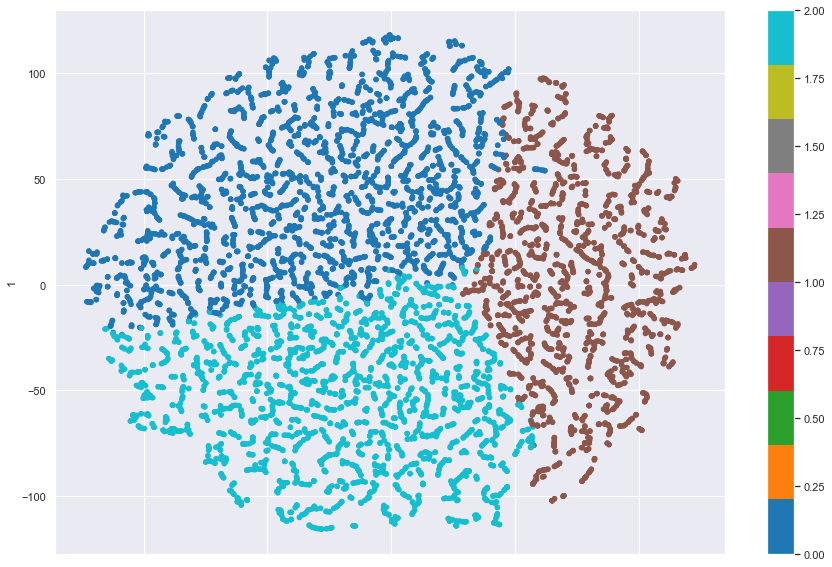

0    4128
2    3589
1    2579
Name: labels, dtype: int64

In [714]:
kmeans().kmeans_cluster(df_scale_robust_outliers_removed,df_without_outliers,value_features_new,3,5)[2]['labels'].value_counts()

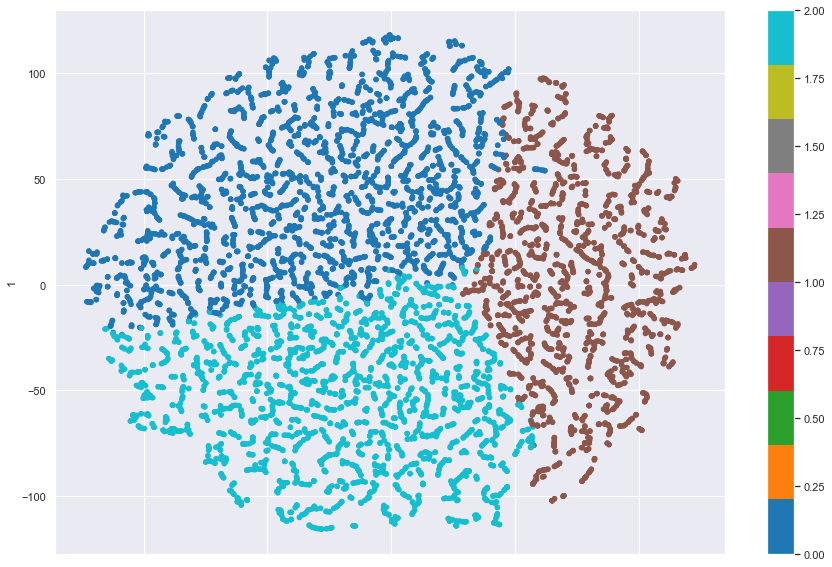

In [715]:
value_labels3 = kmeans().kmeans_cluster(df_scale_robust_outliers_removed,df_without_outliers,value_features_new,3,5)[2]['labels']

In [716]:
value_labels3 

0        2
1        1
2        2
3        1
4        0
        ..
10291    0
10292    1
10293    2
10294    2
10295    2
Name: labels, Length: 10296, dtype: int32

In [717]:
value_labels3 = value_labels3.replace({0: "High_Sal_Low_CMV", 1: "Low_Sal_Medium_CMV", 2: "High_Sal_High_CMV"})
value_labels3.head()

0     High_Sal_High_CMV
1    Low_Sal_Medium_CMV
2     High_Sal_High_CMV
3    Low_Sal_Medium_CMV
4      High_Sal_Low_CMV
Name: labels, dtype: object

<a class="anchor" id="DB-Scan">

### 4.2.3. DB-Scan

</a>

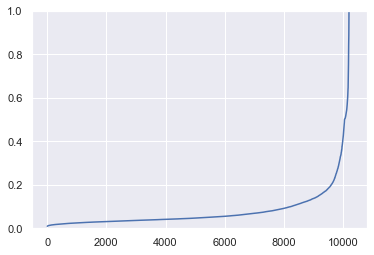

In [721]:
density().distance(df_scale_robust,value_features_new,10)

,CustMonVal,AnnualSal,Salary_effort
dbscan_labels,,,
0,193.883388,29982.593891,3.351083
1,-165680.420000,13032.000000,5.000000
2,122.250000,662580.000000,0.000000
3,608.890000,413880.000000,0.000000
4,473.540000,31416.000000,82.000000
5,804.050000,11844.000000,248.000000


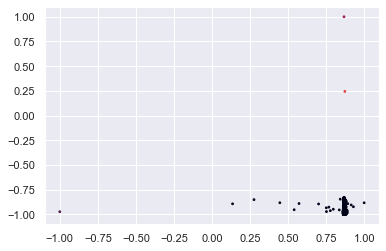

In [817]:
density().dbscan(df_scale_minmax_minus, df_with_outliers, value_features_new,
      eps=0.2,
      min_samples=1,
      metric = 'euclidean',
      algorithm = 'kd_tree')[3].groupby('dbscan_labels').mean()

In [818]:
# Count the values of each cluster
count_labels_dbscan(df_scale_minmax_minus[value_features_new], 0.2, 1)

Counter({0: 10291, 1: 1, 2: 1, 3: 1, 4: 1, 5: 1})

Result: No good clusters found with DBSCAN.

<a class="anchor" id="Mean-shiftClustering">

### 4.2.4. Mean-Shift Clustering

</a>

In [819]:
MSC().bandwidth(df_scale_minmax_minus,value_features_new,0.9,1.0,0.01)

,bandwidth,n_clusters,r2
quantile,,,
0.90,0.089723,12,0.471556
0.91,0.091782,12,0.471556
0.92,0.094132,12,0.471556
0.93,0.096473,10,0.469041
0.94,0.099456,11,0.492161
0.95,0.102939,11,0.469751
0.96,0.107791,11,0.469902
0.97,0.113411,9,0.422490
0.98,0.122223,9,0.468849


In [820]:
MSC().mean_shift_labels(df_scale_minmax_minus,df_with_outliers,value_features_new,0.99)[1]

Cluster solution with R^2 of 0.4223


Counter({0: 10283, 1: 4, 7: 1, 2: 2, 5: 3, 6: 1, 4: 1, 3: 1})

In [821]:
MSC().bandwidth(df_scale_minmax,value_features_new,0.9,1.0,0.01)

,bandwidth,n_clusters,r2
quantile,,,
0.90,0.044861,12,0.494239
0.91,0.045891,11,0.471280
0.92,0.047066,11,0.471280
0.93,0.048236,11,0.469751
0.94,0.049728,10,0.469041
0.95,0.051469,8,0.422170
0.96,0.053895,10,0.469430
0.97,0.056705,10,0.469041
0.98,0.061111,8,0.422299


In [822]:
MSC().mean_shift_labels(df_scale_minmax,df_with_outliers,value_features_new,0.99)[1]

Cluster solution with R^2 of 0.4229


Counter({0: 10283, 1: 3, 8: 1, 3: 2, 6: 3, 7: 1, 5: 1, 4: 1, 2: 1})

In [823]:
MSC().bandwidth(df_scale_standard,value_features_new,0.9,1.0,0.01)

,bandwidth,n_clusters,r2
quantile,,,
0.90,2.278705,13,0.666238
0.91,2.336225,12,0.590047
0.92,2.406320,12,0.590047
0.93,2.485570,12,0.590047
0.94,2.571539,12,0.590047
0.95,2.680650,12,0.590047
0.96,2.839885,12,0.590047
0.97,3.028009,12,0.590047
0.98,3.340668,12,0.590047


In [723]:
MSC().mean_shift_labels(df_scale_standard,df_with_outliers,value_features_new,0.99)[1]

Cluster solution with R^2 of 0.5530


Counter({0: 10284, 8: 1, 7: 1, 6: 1, 1: 3, 4: 3, 5: 1, 3: 1, 2: 1})

In [724]:
MSC().bandwidth(df_scale_robust,value_features_new,0.9,1.0,0.01)

,bandwidth,n_clusters,r2
quantile,,,
0.90,3.005693,20,0.908912
0.91,3.142244,20,0.911294
0.92,3.277648,20,0.909884
0.93,3.490180,18,0.907076
0.94,3.695127,19,0.908548
0.95,3.991629,18,0.908355
0.96,4.343417,16,0.897233
0.97,4.850202,15,0.896292
0.98,5.637582,15,0.896292


In [725]:
MSC().mean_shift_labels(df_scale_robust,df_with_outliers,value_features_new,0.99)[1]

Cluster solution with R^2 of 0.8859


Counter({0: 10277,
         8: 1,
         1: 5,
         12: 1,
         11: 1,
         10: 1,
         2: 2,
         6: 3,
         3: 1,
         7: 1,
         5: 1,
         4: 1,
         9: 1})

Result: Mean Shift does not give good clustering results for our business problem.

<a class="anchor" id="GaussianMixtureModel">

### 4.2.5. Gaussian Mixture Model

</a>

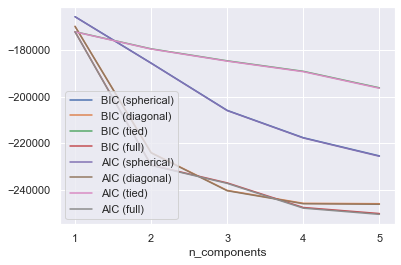

In [726]:
plot_bic_aic_covariance(df_scale_minmax, value_features_new, [1,2,3,4,5] )

In [727]:
#https://www.geeksforgeeks.org/python-itertools/
covariance_types = ['full',
                    #'tied', 
                    'diag', 
                    #'spherical'
                   ]
n_components = [2,3,4]
init_params = ['k-means++', 'random_from_data','kmeans', 'random']

hyperparameters = [{'n_components': n, 'init_params': init_param, 'covariance_type': cov_type} for n, init_param, cov_type in itertools.product(n_components, init_params, covariance_types)]

In [728]:
get_best_r2_score_gmm(df_scale_minmax[value_features_new],hyperparameters)

(0.5723115706391669,
 {'n_components': 4, 'init_params': 'k-means++', 'covariance_type': 'diag'})

In [729]:
count_labels_gmm(df_scale_minmax[value_features_new], 'diag', 4 , 'k-means++')

Counter({3: 2758, 1: 1318, 2: 6166, 0: 54})

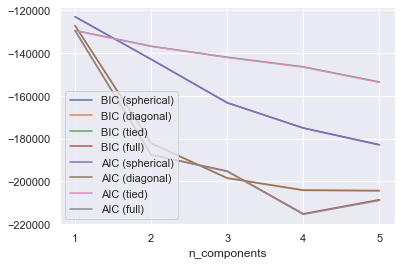

In [730]:
plot_bic_aic_covariance(df_scale_minmax_minus, value_features_new, [1,2,3,4,5] )

In [731]:
covariance_types = ['full',
                    #'tied', 
                    'diag', 
                    #'spherical'
                   ]
n_components = [2,3,4]
init_params = ['k-means++', 'random_from_data','kmeans', 'random']

hyperparameters = [{'n_components': n, 'init_params': init_param, 'covariance_type': cov_type} for n, init_param, cov_type in itertools.product(n_components, init_params, covariance_types)]

In [732]:
get_best_r2_score_gmm(df_scale_minmax_minus[value_features_new],hyperparameters)

(0.5714920822659876,
 {'n_components': 4, 'init_params': 'kmeans', 'covariance_type': 'diag'})

In [733]:
count_labels_gmm(df_scale_minmax_minus[value_features_new], 'diag', 4 , 'kmeans')

Counter({0: 2691, 1: 1487, 2: 6058, 3: 60})

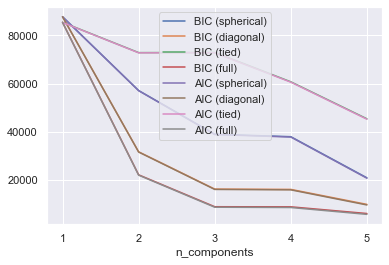

In [734]:
plot_bic_aic_covariance(df_scale_standard, value_features_new, [1,2,3,4,5])

In [735]:
covariance_types = ['full',
                    #'tied', 
                    #'diag', 
                    #'spherical'
                   ]
n_components = [2,3]
init_params = ['k-means++', 'random_from_data','kmeans', 'random']

hyperparameters = [{'n_components': n, 'init_params': init_param, 'covariance_type': cov_type} for n, init_param, cov_type in itertools.product(n_components, init_params, covariance_types)]

In [736]:
get_best_r2_score_gmm(df_scale_standard[value_features_new],hyperparameters)

(0.4640083490715894,
 {'n_components': 3, 'init_params': 'k-means++', 'covariance_type': 'full'})

In [737]:
count_labels_gmm(df_scale_standard[value_features_new], 'full', 3 , 'k-means++')

Counter({0: 8284, 1: 1943, 2: 69})

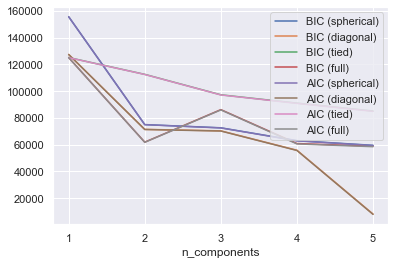

In [738]:
plot_bic_aic_covariance(df_scale_robust, value_features_new, [1,2,3,4,5])

In [739]:
covariance_types = ['full',
                    #'tied', 
                    'diag', 
                    'spherical'
                   ]
n_components = [2]
init_params = ['k-means++', 'random_from_data','kmeans', 'random']

hyperparameters = [{'n_components': n, 'init_params': init_param, 'covariance_type': cov_type} for n, init_param, cov_type in itertools.product(n_components, init_params, covariance_types)]

In [740]:
get_best_r2_score_gmm(df_scale_robust[value_features_new],hyperparameters)

(0.589222760733919,
 {'n_components': 2, 'init_params': 'k-means++', 'covariance_type': 'full'})

In [741]:
count_labels_gmm(df_scale_robust[value_features_new], 'full', 2 , 'k-means++')

Counter({1: 9631, 0: 665})

Result: GMM does not show the best cluster solution, due to the distribution of the data in the labels.

<a class="anchor" id="Self-OrganizingMaps">

### 4.2.6. Self-Organizing Maps

</a>

In [742]:
np.random.seed(42)

sm_value = sompy.SOMFactory().build(
    df_scale_minmax_outliers_removed[value_features_new].values, 
    mapsize=[15,15],  # NEEDS TO BE A LIST
    initialization='random', 
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    component_names=value_features_new
        ) #0.1159983 (30,30); 0.137574 (40,40); 0.119743 (50,50)
sm_value.train(n_job=-1, verbose='info', train_rough_len=200, train_finetune_len=600)

 Training...
 random_initialization took: 0.000000 seconds
 Rough training...
 radius_ini: 5.000000 , radius_final: 1.000000, trainlen: 200

 epoch: 1 ---> elapsed time:  0.042000, quantization error: 0.521179

 epoch: 2 ---> elapsed time:  0.032000, quantization error: 1.529508

 epoch: 3 ---> elapsed time:  0.036000, quantization error: 1.420402

 epoch: 4 ---> elapsed time:  0.035000, quantization error: 1.390847

 epoch: 5 ---> elapsed time:  0.035000, quantization error: 1.376233

 epoch: 6 ---> elapsed time:  0.034000, quantization error: 1.362559

 epoch: 7 ---> elapsed time:  0.035000, quantization error: 1.354527

 epoch: 8 ---> elapsed time:  0.040000, quantization error: 1.350637

 epoch: 9 ---> elapsed time:  0.035000, quantization error: 1.348386

 epoch: 10 ---> elapsed time:  0.032000, quantization error: 1.346741

 epoch: 11 ---> elapsed time:  0.035000, quantization error: 1.345323

 epoch: 12 ---> elapsed time:  0.036000, quantization error: 1.343925

 epoch: 13 ---> 

 epoch: 115 ---> elapsed time:  0.035000, quantization error: 0.993682

 epoch: 116 ---> elapsed time:  0.035000, quantization error: 0.987586

 epoch: 117 ---> elapsed time:  0.035000, quantization error: 0.981427

 epoch: 118 ---> elapsed time:  0.035000, quantization error: 0.975202

 epoch: 119 ---> elapsed time:  0.035000, quantization error: 0.968943

 epoch: 120 ---> elapsed time:  0.035000, quantization error: 0.962638

 epoch: 121 ---> elapsed time:  0.032000, quantization error: 0.956165

 epoch: 122 ---> elapsed time:  0.043000, quantization error: 0.949678

 epoch: 123 ---> elapsed time:  0.037000, quantization error: 0.943222

 epoch: 124 ---> elapsed time:  0.038000, quantization error: 0.936651

 epoch: 125 ---> elapsed time:  0.035000, quantization error: 0.929972

 epoch: 126 ---> elapsed time:  0.039000, quantization error: 0.923258

 epoch: 127 ---> elapsed time:  0.036000, quantization error: 0.916387

 epoch: 128 ---> elapsed time:  0.035000, quantization error: 0.

 epoch: 29 ---> elapsed time:  0.031000, quantization error: 0.370897

 epoch: 30 ---> elapsed time:  0.039000, quantization error: 0.370723

 epoch: 31 ---> elapsed time:  0.041000, quantization error: 0.370547

 epoch: 32 ---> elapsed time:  0.039000, quantization error: 0.370370

 epoch: 33 ---> elapsed time:  0.035000, quantization error: 0.370213

 epoch: 34 ---> elapsed time:  0.038000, quantization error: 0.370059

 epoch: 35 ---> elapsed time:  0.037000, quantization error: 0.369907

 epoch: 36 ---> elapsed time:  0.037000, quantization error: 0.369749

 epoch: 37 ---> elapsed time:  0.038000, quantization error: 0.369588

 epoch: 38 ---> elapsed time:  0.042000, quantization error: 0.369418

 epoch: 39 ---> elapsed time:  0.064000, quantization error: 0.369249

 epoch: 40 ---> elapsed time:  0.048000, quantization error: 0.369074

 epoch: 41 ---> elapsed time:  0.041000, quantization error: 0.368913

 epoch: 42 ---> elapsed time:  0.045000, quantization error: 0.368751

 epoch

 epoch: 144 ---> elapsed time:  0.033000, quantization error: 0.351985

 epoch: 145 ---> elapsed time:  0.042000, quantization error: 0.351827

 epoch: 146 ---> elapsed time:  0.033000, quantization error: 0.351672

 epoch: 147 ---> elapsed time:  0.040000, quantization error: 0.351512

 epoch: 148 ---> elapsed time:  0.039000, quantization error: 0.351361

 epoch: 149 ---> elapsed time:  0.050000, quantization error: 0.351213

 epoch: 150 ---> elapsed time:  0.040000, quantization error: 0.351057

 epoch: 151 ---> elapsed time:  0.040000, quantization error: 0.350894

 epoch: 152 ---> elapsed time:  0.040000, quantization error: 0.350739

 epoch: 153 ---> elapsed time:  0.040000, quantization error: 0.350585

 epoch: 154 ---> elapsed time:  0.040000, quantization error: 0.350436

 epoch: 155 ---> elapsed time:  0.040000, quantization error: 0.350271

 epoch: 156 ---> elapsed time:  0.035000, quantization error: 0.350117

 epoch: 157 ---> elapsed time:  0.035000, quantization error: 0.

 epoch: 258 ---> elapsed time:  0.031000, quantization error: 0.334114

 epoch: 259 ---> elapsed time:  0.035000, quantization error: 0.333966

 epoch: 260 ---> elapsed time:  0.036000, quantization error: 0.333821

 epoch: 261 ---> elapsed time:  0.040000, quantization error: 0.333685

 epoch: 262 ---> elapsed time:  0.036000, quantization error: 0.333541

 epoch: 263 ---> elapsed time:  0.044000, quantization error: 0.333398

 epoch: 264 ---> elapsed time:  0.040000, quantization error: 0.333247

 epoch: 265 ---> elapsed time:  0.035000, quantization error: 0.333080

 epoch: 266 ---> elapsed time:  0.041000, quantization error: 0.332922

 epoch: 267 ---> elapsed time:  0.039000, quantization error: 0.332766

 epoch: 268 ---> elapsed time:  0.041000, quantization error: 0.332625

 epoch: 269 ---> elapsed time:  0.039000, quantization error: 0.332465

 epoch: 270 ---> elapsed time:  0.040000, quantization error: 0.332321

 epoch: 271 ---> elapsed time:  0.032000, quantization error: 0.

 epoch: 372 ---> elapsed time:  0.040000, quantization error: 0.317398

 epoch: 373 ---> elapsed time:  0.038000, quantization error: 0.317253

 epoch: 374 ---> elapsed time:  0.037000, quantization error: 0.317098

 epoch: 375 ---> elapsed time:  0.035000, quantization error: 0.316962

 epoch: 376 ---> elapsed time:  0.035000, quantization error: 0.316824

 epoch: 377 ---> elapsed time:  0.035000, quantization error: 0.316686

 epoch: 378 ---> elapsed time:  0.040000, quantization error: 0.316556

 epoch: 379 ---> elapsed time:  0.040000, quantization error: 0.316410

 epoch: 380 ---> elapsed time:  0.035000, quantization error: 0.316276

 epoch: 381 ---> elapsed time:  0.040000, quantization error: 0.316130

 epoch: 382 ---> elapsed time:  0.040000, quantization error: 0.315990

 epoch: 383 ---> elapsed time:  0.037000, quantization error: 0.315857

 epoch: 384 ---> elapsed time:  0.036000, quantization error: 0.315714

 epoch: 385 ---> elapsed time:  0.039000, quantization error: 0.

 epoch: 486 ---> elapsed time:  0.038000, quantization error: 0.301477

 epoch: 487 ---> elapsed time:  0.035000, quantization error: 0.301352

 epoch: 488 ---> elapsed time:  0.039000, quantization error: 0.301227

 epoch: 489 ---> elapsed time:  0.036000, quantization error: 0.301101

 epoch: 490 ---> elapsed time:  0.038000, quantization error: 0.300979

 epoch: 491 ---> elapsed time:  0.038000, quantization error: 0.300861

 epoch: 492 ---> elapsed time:  0.035000, quantization error: 0.300734

 epoch: 493 ---> elapsed time:  0.040000, quantization error: 0.300607

 epoch: 494 ---> elapsed time:  0.040000, quantization error: 0.300474

 epoch: 495 ---> elapsed time:  0.033000, quantization error: 0.300345

 epoch: 496 ---> elapsed time:  0.041000, quantization error: 0.300222

 epoch: 497 ---> elapsed time:  0.041000, quantization error: 0.300097

 epoch: 498 ---> elapsed time:  0.034000, quantization error: 0.299956

 epoch: 499 ---> elapsed time:  0.035000, quantization error: 0.

 epoch: 600 ---> elapsed time:  0.038000, quantization error: 0.285754

 Final quantization error: 0.285607
 train took: 31.411000 seconds


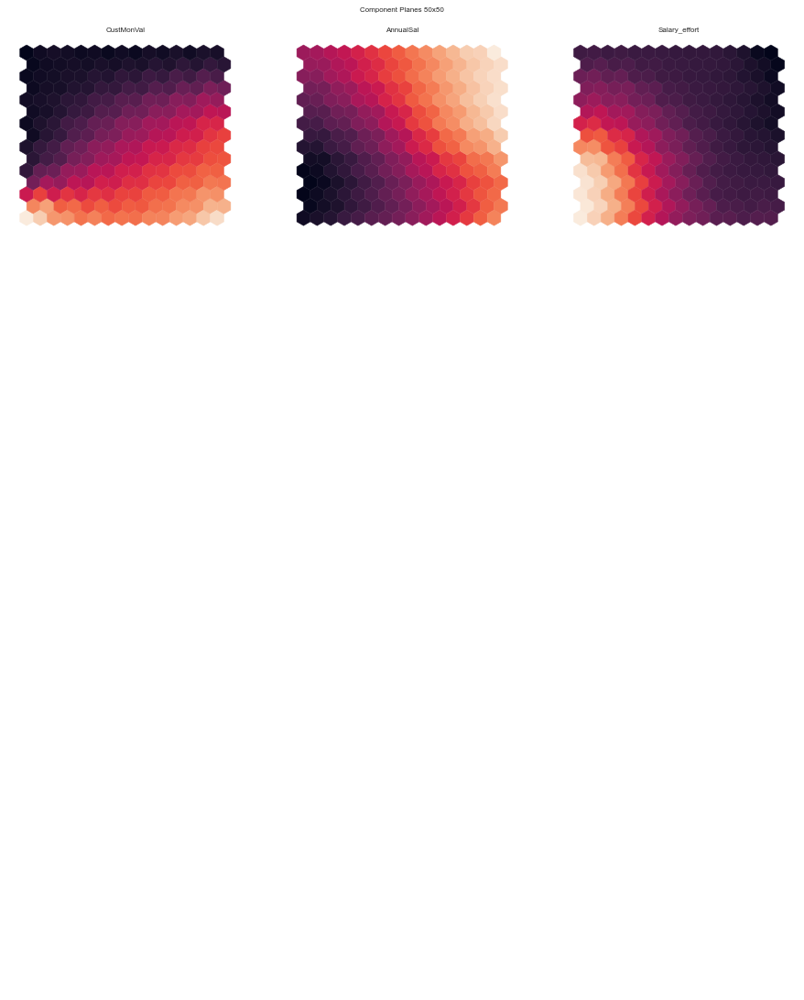

In [743]:
#Analyse these plots from the following perspectives:

#Feature importance
#Feature correlation (both globally and locally)
#Data distribution
#Outlier detection
SOM().plot_component_planes(weights=sm_value.codebook.matrix,features=value_features_new,
                      M=15,N=15,
                      figsize=(12,15),figlayout=(4,3),
                      title="Component Planes 50x50",
                      cmap=sns.color_palette("rocket", as_cmap=True))


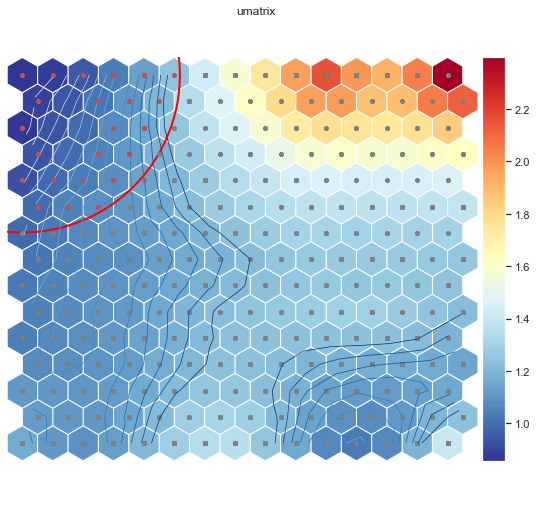

In [744]:
#red is an outlier 
#the av distance to the adjacent neighbours (the neighbours that are pegged to the neuron)
#the lower the distance the better, means that the

#Encode each neuron in the output space with the average distance to its neighbors in the input space.

#Analyse these plots from the following perspectives:

#Clusters of units
#Pontential outliers (units which are very distant from its neighbors and have low frequency)

SOM().u_matrix(sm_value, distance=15)

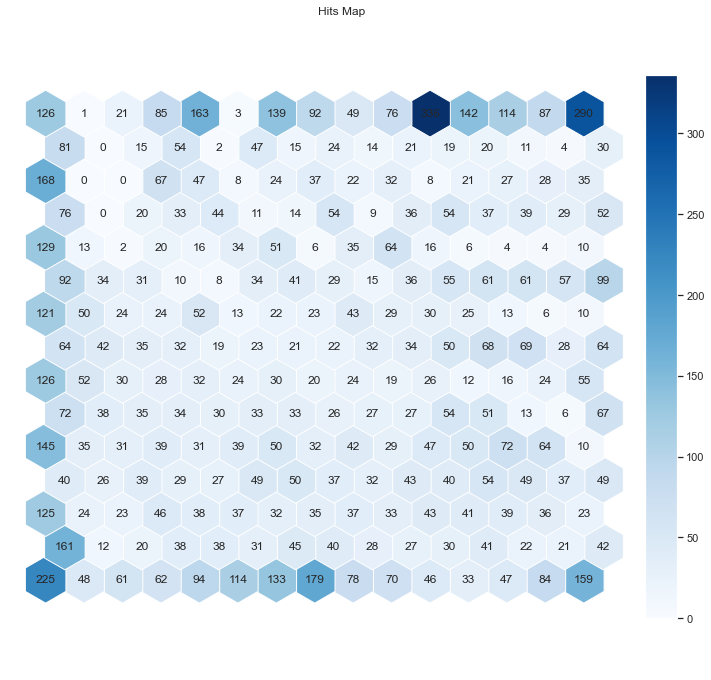

In [745]:
SOM().bmu(sm_value)

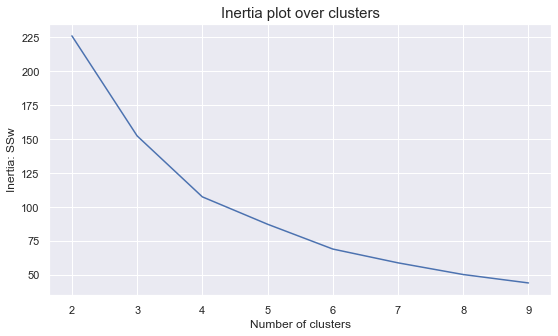

In [746]:
SOM().inertia(10,sm_value)

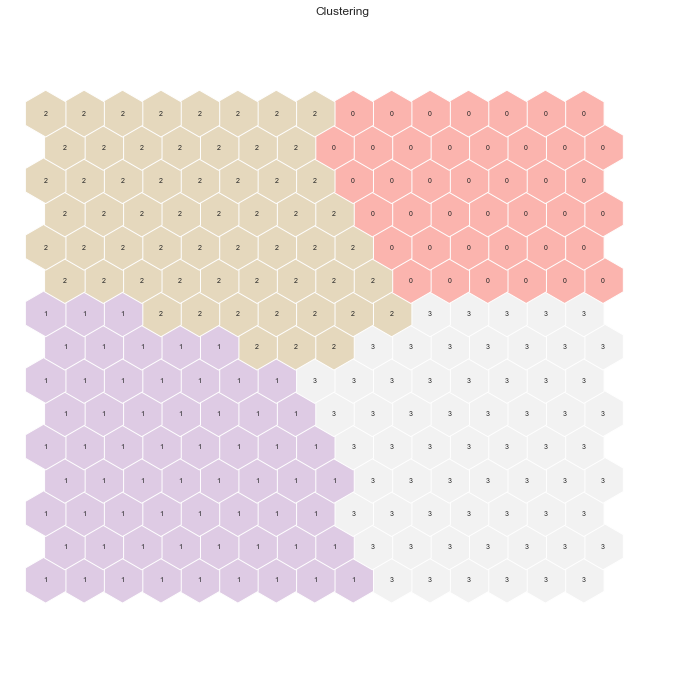

,CustMonVal,AnnualSal,Salary_effort
label,,,
0,328.381917,10764.884058,7.000000
1,-11.159795,52105.853969,1.084577
2,-68.059074,14854.888889,6.074074
3,215.633661,31515.654045,2.619660


In [747]:
SOM().kmeans(df_scale_minmax_outliers_removed,df_without_outliers,value_features_new,4,sm_value)[1]


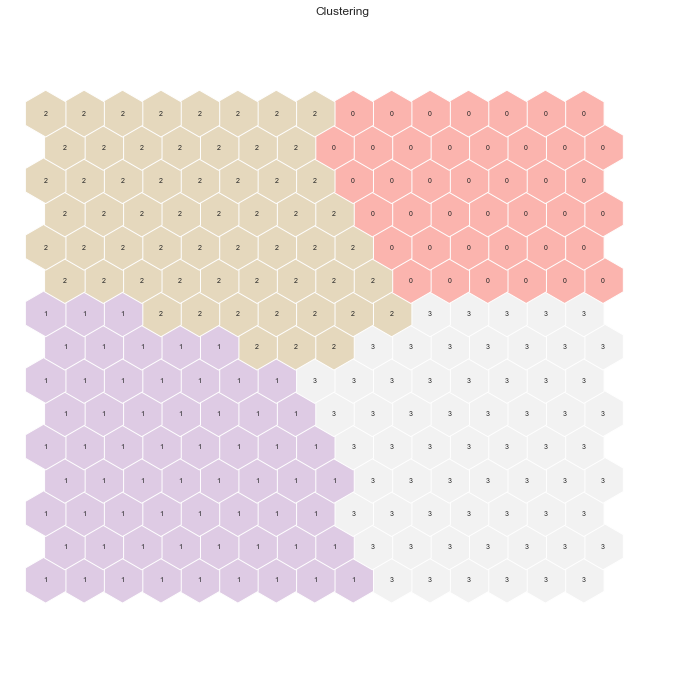

3    9105
0     828
1     201
2     162
Name: label, dtype: int64

In [748]:
SOM().kmeans(df_scale_minmax_outliers_removed,df_with_outliers,value_features_new,4,sm_value)[0]['label'].value_counts()

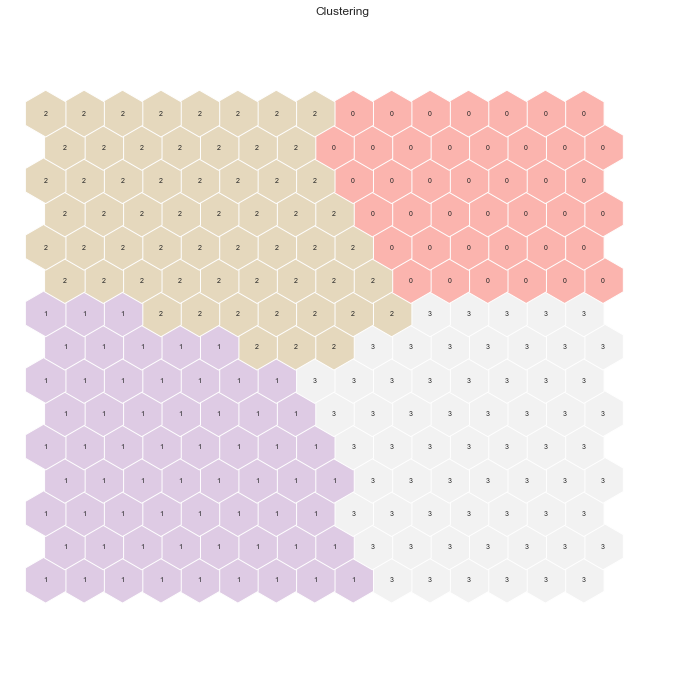

0.24364526620839896

In [749]:
SOM().kmeans(df_scale_minmax_outliers_removed,df_with_outliers,value_features_new,4,sm_value)[3]#.groupby('label').mean()

In [750]:
#value_labels = SOM().kmeans(df_scale_minmax_minus,df_with_outliers,value_features_new,3,sm_value)[0]['label']#.groupby('label').mean()

<a class="anchor" id="ProductSegments">

## 4.3 Product Segments

</a>

<a class="anchor" id="K-Means">

### 4.3.1. K-Means

</a>

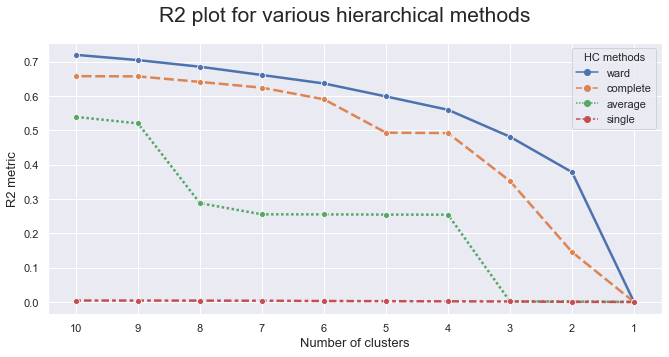

In [751]:
hierarchical().r2_plot(df_scale_standard_outliers_removed[product_features_new])

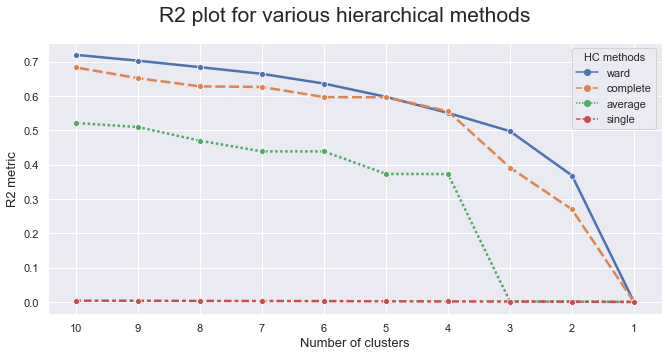

In [752]:
hierarchical().r2_plot(df_scale_minmax_outliers_removed[product_features_new])

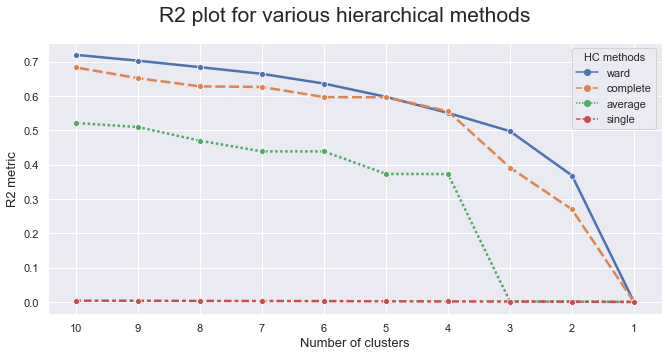

In [753]:
hierarchical().r2_plot(df_scale_minmax_minus_outliers_removed[product_features_new])

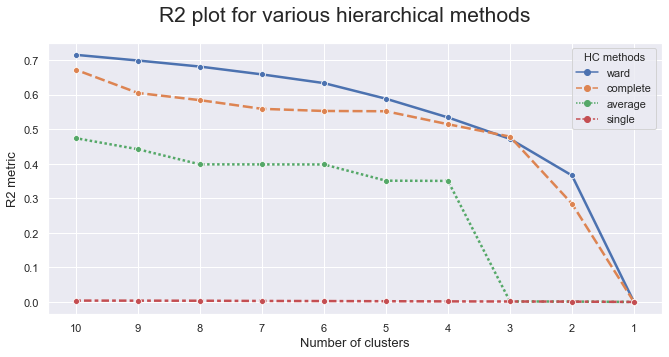

In [754]:
hierarchical().r2_plot(df_scale_robust_outliers_removed[product_features_new])

In [755]:
all__lists = [df_scale_standard_outliers_removed[product_features_new],df_scale_minmax_outliers_removed[product_features_new],df_scale_minmax_minus_outliers_removed[product_features_new],df_scale_robust_outliers_removed[product_features_new]]

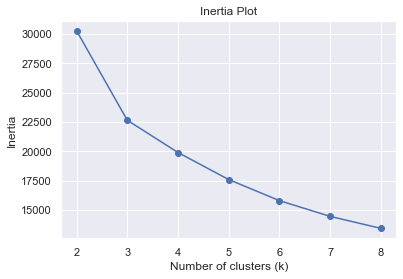

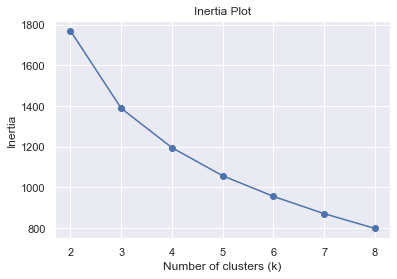

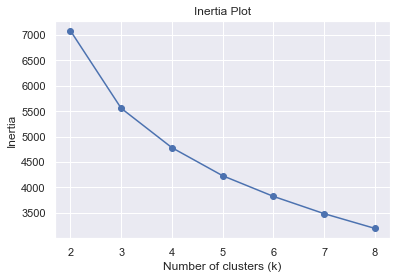

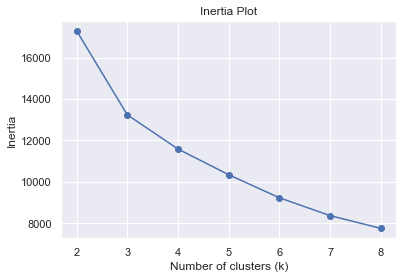

In [756]:
kmeans().inertia_plot(all__lists,2,8)
#use 3 or 4 clusters

In [757]:
#kmeans().silhouette(10,df_scale_minmax_minus_outliers_removed,product_features2)
#use 4 clusters

In [758]:
dict_ = {}
x=0
columns=['standard','minmax','minmax_minus','robust']
for df_ in [df_scale_standard_outliers_removed,df_scale_minmax_outliers_removed,df_scale_minmax_minus_outliers_removed,df_scale_robust_outliers_removed]: 
    
    avg_silhouette = []
    for nclus in range(3,5):
        # Initialize the KMeans object with n_clusters value and a random generator
        # seed of 10 for reproducibility.
        kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
        cluster_labels = kmclust.fit_predict(df_[product_features_new])

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed clusters
        silhouette_avg = silhouette_score(df_[product_features_new], cluster_labels)
        avg_silhouette.append(silhouette_avg)
    dict_[columns[x]] = avg_silhouette
    x=x+1
    
df_scaler_ = pd.DataFrame.from_dict(data=dict_)
df_scaler_.index = [3,4]
df_scaler_

,standard,minmax,minmax_minus,robust
3,0.329670,0.306402,0.306402,0.314098
4,0.264972,0.297444,0.297444,0.304365


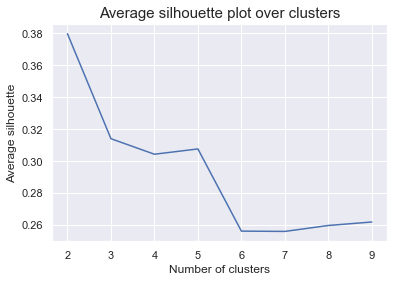

In [759]:
kmeans().plot_silhouette(10,df_scale_robust_outliers_removed,product_features_new)
#so 4 clusters (dont forget that the first value in the plot is a 0 so to every nº has to be summed 1)

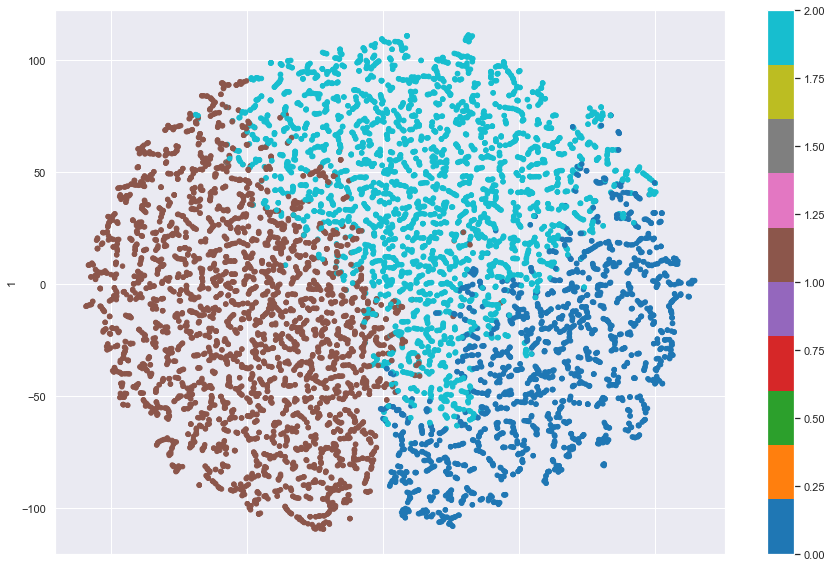

,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
labels,,,,,
0,132.898114,439.653342,164.765678,84.719336,82.816240
1,436.979202,65.923102,111.739789,13.286197,13.030671
2,247.809979,183.476092,228.247744,38.022540,37.360573


In [760]:
kmeans().kmeans_cluster(df_scale_robust_outliers_removed,df_without_outliers,product_features_new,3,5)[0]

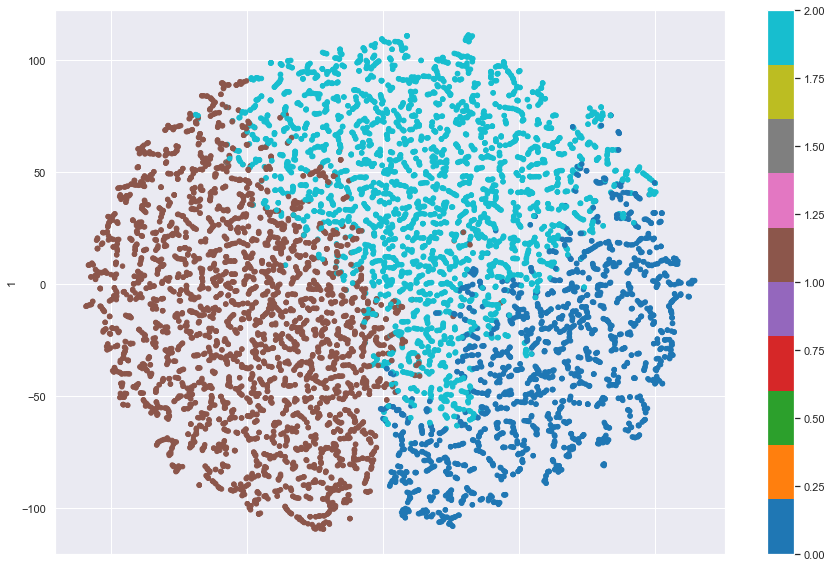

0.5917299654417634

In [761]:
kmeans().kmeans_cluster(df_scale_robust_outliers_removed,df_without_outliers,product_features_new,3,5)[1]

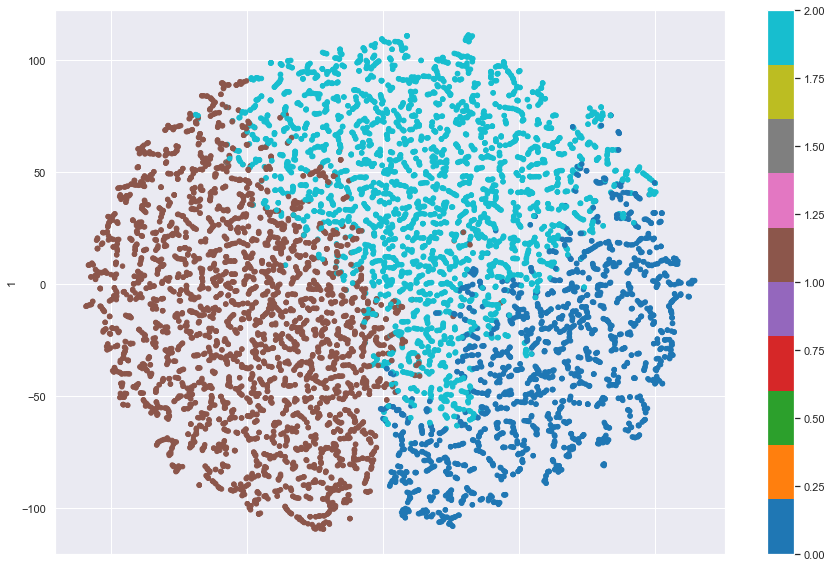

1    4084
2    3938
0    2274
Name: labels, dtype: int64

In [762]:
kmeans().kmeans_cluster(df_scale_robust_outliers_removed,df_without_outliers,product_features_new,3,5)[2]['labels'].value_counts()

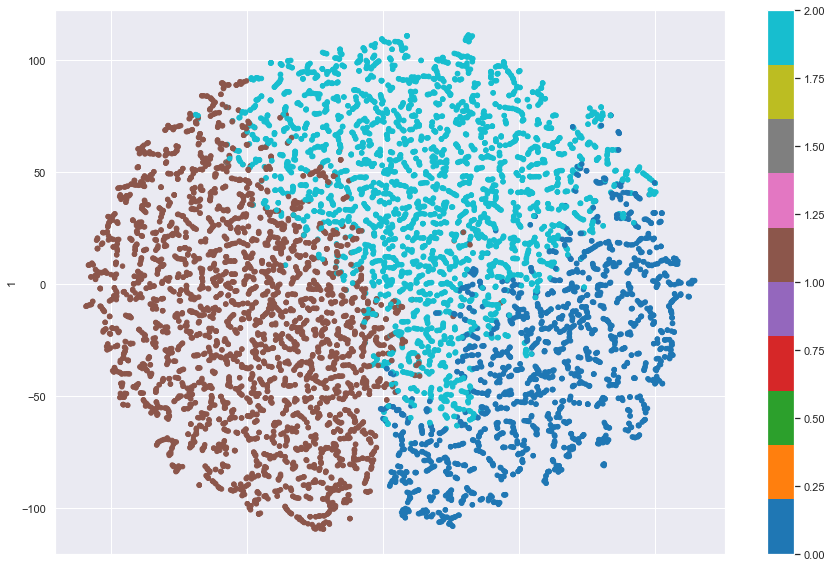

In [763]:
product_labels = kmeans().kmeans_cluster(df_scale_robust_outliers_removed,df_without_outliers,product_features_new,3,5)[2]['labels']

In [764]:
product_labels

0        1
1        0
2        0
3        2
4        2
        ..
10291    1
10292    0
10293    1
10294    0
10295    1
Name: labels, Length: 10296, dtype: int32

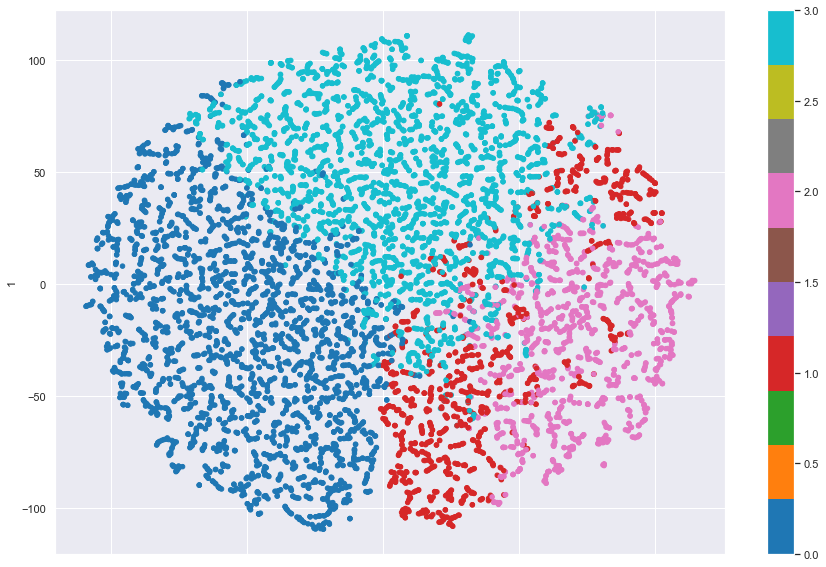

,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
labels,,,,,
0,443.540423,64.253283,106.640159,12.914296,12.430127
1,170.969420,429.056684,185.028870,89.258669,35.477454
2,131.071250,383.888297,165.946310,72.569213,107.340831
3,263.061190,157.008885,228.180232,31.395122,35.047690


In [765]:
kmeans().kmeans_cluster(df_scale_robust_outliers_removed,df_without_outliers,product_features_new,4,5)[0]

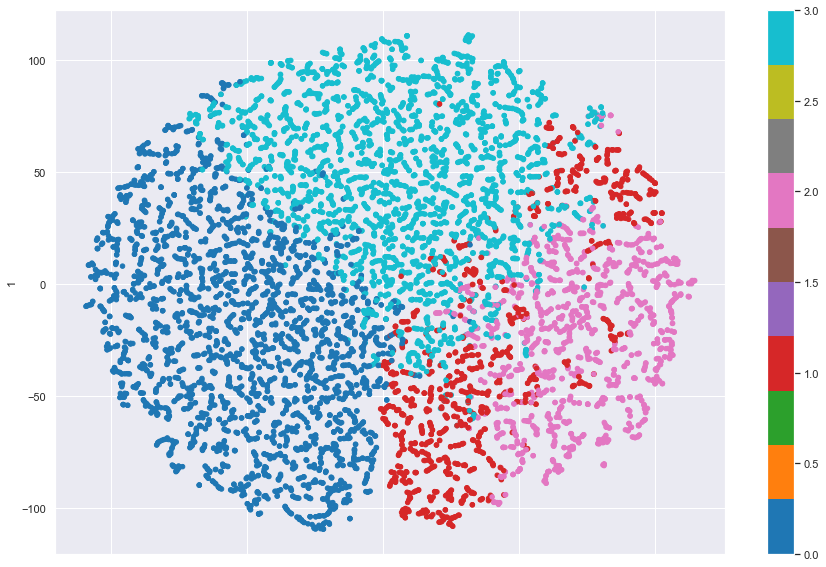

0.5922534524702153

In [766]:
kmeans().kmeans_cluster(df_scale_robust_outliers_removed,df_without_outliers,product_features_new,4,5)[1]

In [767]:
product_labels = product_labels.replace({0: "House_Life_Work", 1: "Motor", 2: "Health"})

In [768]:
product_labels

0                  Motor
1        House_Life_Work
2        House_Life_Work
3                 Health
4                 Health
              ...       
10291              Motor
10292    House_Life_Work
10293              Motor
10294    House_Life_Work
10295              Motor
Name: labels, Length: 10296, dtype: object

<a class="anchor" id="DB-Scan">

### 4.3.2. DB-Scan

</a>

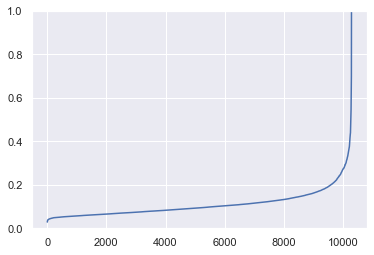

In [773]:
density().distance(df_scale_minmax_minus,product_features,10)

,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
dbscan_labels,,,,,
-1,3566.392727,3254.727273,3541.878182,47.220909,322.930000
0,297.175855,207.175260,168.029466,41.620559,40.846665


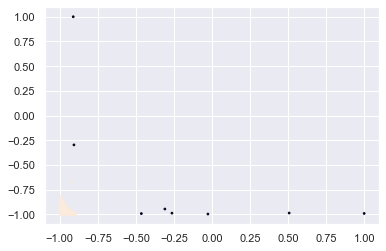

In [774]:
density().dbscan(df_scale_minmax_minus, df_with_outliers, product_features_new,
      eps=0.3,
      min_samples=5, #if chagne to 6 there is only 1 cluster and outliers
      metric = 'euclidean',
      algorithm = 'kd_tree')[3].groupby('dbscan_labels').mean()

Counter({0: 10285, -1: 11})

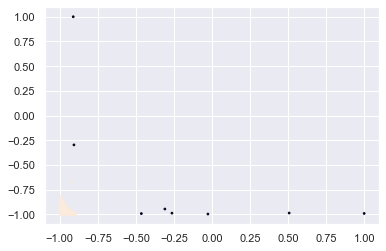

In [775]:
density().dbscan(df_scale_minmax_minus, df_with_outliers, product_features_new,
      eps=0.3,
      min_samples=5, #if chagne to 6 there is only 1 cluster and outliers
      metric = 'euclidean',
      algorithm = 'kd_tree')[2]

<a class="anchor" id="Mean-ShiftClustering">

### 4.3.3. Mean-Shift Clustering

</a>

Implementing the features: '%MotorPrem', '%HouseholdPrem', '%HealthPrem', '%LifePrem', '%WorkPrem'

In [776]:
MSC().bandwidth(df_scale_standard,product_features_new,0.9,1.0,0.01)


,bandwidth,n_clusters,r2
quantile,,,
0.90,3.335130,12,0.447797
0.91,3.448549,12,0.447797
0.92,3.581465,12,0.447797
0.93,3.718585,11,0.447464
0.94,3.862095,12,0.447797
0.95,4.032774,11,0.447464
0.96,4.226908,11,0.447464
0.97,4.475570,11,0.445024
0.98,4.822219,10,0.444691


In [777]:
MSC().bandwidth(df_scale_minmax,product_features_new,0.9,1.,0.01)


,bandwidth,n_clusters,r2
quantile,,,
0.90,0.227622,8,0.034192
0.91,0.239257,8,0.034192
0.92,0.251711,8,0.034192
0.93,0.264408,8,0.034192
0.94,0.281275,7,0.033917
0.95,0.297911,7,0.033917
0.96,0.322174,7,0.033917
0.97,0.355684,5,0.029147
0.98,0.396786,5,0.029147


In [778]:
MSC().bandwidth(df_scale_minmax_minus,product_features_new,0.9,1.0,0.01)


,bandwidth,n_clusters,r2
quantile,,,
0.90,0.455244,9,0.356726
0.91,0.478513,8,0.034192
0.92,0.503423,8,0.034192
0.93,0.528816,8,0.034192
0.94,0.562551,8,0.034192
0.95,0.595822,7,0.033917
0.96,0.644348,7,0.033917
0.97,0.711368,5,0.029147
0.98,0.793573,6,0.032183


In [779]:
MSC().bandwidth(df_scale_robust,product_features_new,0.9,1.0,0.01)


,bandwidth,n_clusters,r2
quantile,,,
0.90,3.924661,13,0.706569
0.91,4.048478,13,0.706569
0.92,4.189644,11,0.698420
0.93,4.330215,12,0.698549
0.94,4.486559,11,0.698338
0.95,4.664993,11,0.698420
0.96,4.889284,11,0.698420
0.97,5.160387,10,0.697997
0.98,5.529271,10,0.697997


Result: Mean Shift Clustering seems to be performing better for the product features. Maximum not reached.

<a class="anchor" id="GaussianMixtureModel">

### 4.3.4. Gaussian Mixture Model

</a>

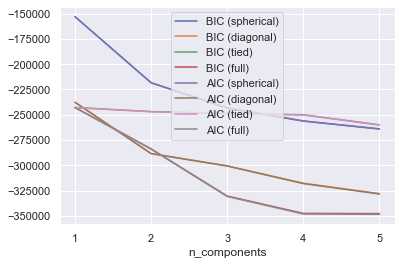

In [780]:
plot_bic_aic_covariance(df_scale_minmax, product_features_new, [1,2,3,4,5] )

In [781]:
covariance_types = ['full',
                    #'tied', 
                    #'diag',
                    #'spherical'
                   ]
n_components = [3,4]
init_params = ['k-means++', 'random_from_data','kmeans', 'random']

hyperparameters = [{'n_components': n, 'init_params': init_param, 'covariance_type': cov_type} for n, init_param, cov_type in itertools.product(n_components, init_params, covariance_types)]

In [782]:
get_best_r2_score_gmm(df_scale_minmax[product_features_new],hyperparameters)

(0.40130564040439576,
 {'n_components': 4, 'init_params': 'random', 'covariance_type': 'full'})

In [783]:
count_labels_gmm(df_scale_minmax[product_features_new], 'full', 4 , 'random')

Counter({3: 5962, 1: 4094, 0: 231, 2: 9})

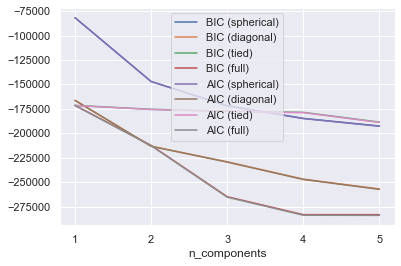

In [784]:
plot_bic_aic_covariance(df_scale_minmax_minus, product_features_new, [1,2,3,4,5] )

In [785]:
variance_types = ['full',
                    #'tied', 
                    #'diag',
                    #'spherical'
                   ]
n_components = [3,4]
init_params = ['k-means++', 'random_from_data','kmeans', 'random']

hyperparameters = [{'n_components': n, 'init_params': init_param, 'covariance_type': cov_type} for n, init_param, cov_type in itertools.product(n_components, init_params, covariance_types)]

In [786]:
get_best_r2_score_gmm(df_scale_minmax_minus[product_features_new],hyperparameters)

(0.38628511304205726,
 {'n_components': 4, 'init_params': 'random', 'covariance_type': 'full'})

In [787]:
count_labels_gmm(df_scale_minmax_minus[product_features_new], 'full', 4 , 'random')

Counter({3: 5971, 1: 4155, 0: 161, 2: 9})

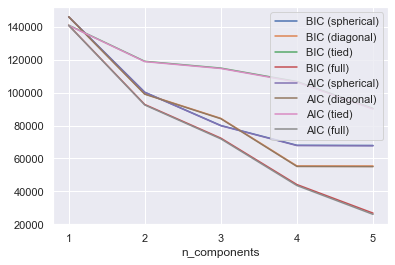

In [788]:
plot_bic_aic_covariance(df_scale_standard, product_features_new, [1,2,3,4,5] )

In [789]:
variance_types = ['full',
                    #'tied', 
                    #'diag',
                    #'spherical'
                   ]
n_components = [2,3,4]
init_params = ['k-means++', 'random_from_data','kmeans', 'random']

hyperparameters = [{'n_components': n, 'init_params': init_param, 'covariance_type': cov_type} for n, init_param, cov_type in itertools.product(n_components, init_params, covariance_types)]

In [790]:
get_best_r2_score_gmm(df_scale_standard[product_features_new],hyperparameters)

(0.3892260402981972,
 {'n_components': 4, 'init_params': 'k-means++', 'covariance_type': 'full'})

In [791]:
count_labels_gmm(df_scale_standard[product_features_new], 'full', 4 , 'k-means++')

Counter({2: 8056, 1: 2231, 3: 3, 0: 6})

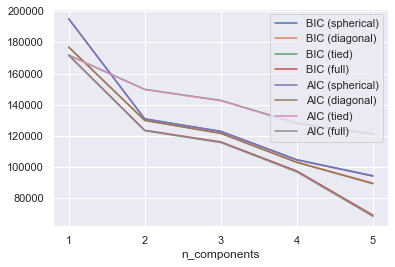

In [792]:
plot_bic_aic_covariance(df_scale_robust, product_features_new, [1,2,3,4,5] )

In [793]:
variance_types = ['full',
                    #'tied', 
                    #'diag',
                    #'spherical'
                   ]
n_components = [2]
init_params = ['k-means++', 'random_from_data','kmeans', 'random']

hyperparameters = [{'n_components': n, 'init_params': init_param, 'covariance_type': cov_type} for n, init_param, cov_type in itertools.product(n_components, init_params, covariance_types)]

In [794]:
get_best_r2_score_gmm(df_scale_robust[product_features_new],hyperparameters)

(0.5122144062597176,
 {'n_components': 2, 'init_params': 'k-means++', 'covariance_type': 'full'})

In [795]:
count_labels_gmm(df_scale_robust[product_features_new], 'full', 2 , 'k-means++')

Counter({0: 10127, 1: 169})

Result: GMM does not give the best cluster solutions for the product features.

<a class="anchor" id="Self-OrganizingMaps">

### 4.3.5. Self-Organizing Maps

</a>

In [796]:
np.random.seed(42)

sm_product = sompy.SOMFactory().build(
    df_scale_minmax_minus[product_features_new].values, 
    mapsize=[15,15],  # NEEDS TO BE A LIST
    initialization='random', 
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    component_names=product_features_new
        ) #0.87 (20,20); 0.87 (25,25); 0.74 (30,30); 0.66 (40,40) 0.54 (60,60)
sm_product.train(n_job=-1, verbose='info', train_rough_len=200, train_finetune_len=500)

 Training...
 random_initialization took: 0.000000 seconds
 Rough training...
 radius_ini: 5.000000 , radius_final: 1.000000, trainlen: 200

 epoch: 1 ---> elapsed time:  0.041000, quantization error: 10.845699

 epoch: 2 ---> elapsed time:  0.039000, quantization error: 1.443532

 epoch: 3 ---> elapsed time:  0.041000, quantization error: 1.329078

 epoch: 4 ---> elapsed time:  0.041000, quantization error: 1.286414

 epoch: 5 ---> elapsed time:  0.042000, quantization error: 1.279905

 epoch: 6 ---> elapsed time:  0.043000, quantization error: 1.278204

 epoch: 7 ---> elapsed time:  0.041000, quantization error: 1.276828

 epoch: 8 ---> elapsed time:  0.042000, quantization error: 1.275475

 epoch: 9 ---> elapsed time:  0.052000, quantization error: 1.274106

 epoch: 10 ---> elapsed time:  0.043000, quantization error: 1.272733

 epoch: 11 ---> elapsed time:  0.044000, quantization error: 1.271368

 epoch: 12 ---> elapsed time:  0.045000, quantization error: 1.269997

 epoch: 13 --->

 epoch: 115 ---> elapsed time:  0.042000, quantization error: 0.988497

 epoch: 116 ---> elapsed time:  0.044000, quantization error: 0.983011

 epoch: 117 ---> elapsed time:  0.044000, quantization error: 0.977485

 epoch: 118 ---> elapsed time:  0.045000, quantization error: 0.971618

 epoch: 119 ---> elapsed time:  0.045000, quantization error: 0.965724

 epoch: 120 ---> elapsed time:  0.045000, quantization error: 0.960099

 epoch: 121 ---> elapsed time:  0.042000, quantization error: 0.954814

 epoch: 122 ---> elapsed time:  0.043000, quantization error: 0.949754

 epoch: 123 ---> elapsed time:  0.043000, quantization error: 0.944973

 epoch: 124 ---> elapsed time:  0.043000, quantization error: 0.940383

 epoch: 125 ---> elapsed time:  0.044000, quantization error: 0.935824

 epoch: 126 ---> elapsed time:  0.043000, quantization error: 0.931473

 epoch: 127 ---> elapsed time:  0.045000, quantization error: 0.927214

 epoch: 128 ---> elapsed time:  0.046000, quantization error: 0.

 epoch: 29 ---> elapsed time:  0.048000, quantization error: 0.569781

 epoch: 30 ---> elapsed time:  0.049000, quantization error: 0.569642

 epoch: 31 ---> elapsed time:  0.048000, quantization error: 0.569509

 epoch: 32 ---> elapsed time:  0.050000, quantization error: 0.569357

 epoch: 33 ---> elapsed time:  0.049000, quantization error: 0.569203

 epoch: 34 ---> elapsed time:  0.051000, quantization error: 0.569061

 epoch: 35 ---> elapsed time:  0.055000, quantization error: 0.568912

 epoch: 36 ---> elapsed time:  0.049000, quantization error: 0.568768

 epoch: 37 ---> elapsed time:  0.049000, quantization error: 0.568615

 epoch: 38 ---> elapsed time:  0.051000, quantization error: 0.568472

 epoch: 39 ---> elapsed time:  0.050000, quantization error: 0.568305

 epoch: 40 ---> elapsed time:  0.050000, quantization error: 0.568158

 epoch: 41 ---> elapsed time:  0.048000, quantization error: 0.568001

 epoch: 42 ---> elapsed time:  0.057000, quantization error: 0.567845

 epoch

 epoch: 144 ---> elapsed time:  0.043000, quantization error: 0.552486

 epoch: 145 ---> elapsed time:  0.043000, quantization error: 0.552346

 epoch: 146 ---> elapsed time:  0.043000, quantization error: 0.552206

 epoch: 147 ---> elapsed time:  0.045000, quantization error: 0.552046

 epoch: 148 ---> elapsed time:  0.045000, quantization error: 0.551895

 epoch: 149 ---> elapsed time:  0.044000, quantization error: 0.551755

 epoch: 150 ---> elapsed time:  0.045000, quantization error: 0.551624

 epoch: 151 ---> elapsed time:  0.043000, quantization error: 0.551474

 epoch: 152 ---> elapsed time:  0.043000, quantization error: 0.551332

 epoch: 153 ---> elapsed time:  0.042000, quantization error: 0.551170

 epoch: 154 ---> elapsed time:  0.043000, quantization error: 0.551012

 epoch: 155 ---> elapsed time:  0.043000, quantization error: 0.550847

 epoch: 156 ---> elapsed time:  0.046000, quantization error: 0.550711

 epoch: 157 ---> elapsed time:  0.045000, quantization error: 0.

 epoch: 258 ---> elapsed time:  0.042000, quantization error: 0.535255

 epoch: 259 ---> elapsed time:  0.045000, quantization error: 0.535118

 epoch: 260 ---> elapsed time:  0.044000, quantization error: 0.534988

 epoch: 261 ---> elapsed time:  0.045000, quantization error: 0.534863

 epoch: 262 ---> elapsed time:  0.044000, quantization error: 0.534722

 epoch: 263 ---> elapsed time:  0.045000, quantization error: 0.534579

 epoch: 264 ---> elapsed time:  0.044000, quantization error: 0.534438

 epoch: 265 ---> elapsed time:  0.044000, quantization error: 0.534283

 epoch: 266 ---> elapsed time:  0.043000, quantization error: 0.534144

 epoch: 267 ---> elapsed time:  0.043000, quantization error: 0.534004

 epoch: 268 ---> elapsed time:  0.043000, quantization error: 0.533819

 epoch: 269 ---> elapsed time:  0.043000, quantization error: 0.533576

 epoch: 270 ---> elapsed time:  0.045000, quantization error: 0.533368

 epoch: 271 ---> elapsed time:  0.044000, quantization error: 0.

 epoch: 372 ---> elapsed time:  0.050000, quantization error: 0.517261

 epoch: 373 ---> elapsed time:  0.049000, quantization error: 0.517111

 epoch: 374 ---> elapsed time:  0.047000, quantization error: 0.516957

 epoch: 375 ---> elapsed time:  0.047000, quantization error: 0.516822

 epoch: 376 ---> elapsed time:  0.046000, quantization error: 0.516673

 epoch: 377 ---> elapsed time:  0.046000, quantization error: 0.516522

 epoch: 378 ---> elapsed time:  0.047000, quantization error: 0.516348

 epoch: 379 ---> elapsed time:  0.046000, quantization error: 0.516201

 epoch: 380 ---> elapsed time:  0.048000, quantization error: 0.516051

 epoch: 381 ---> elapsed time:  0.045000, quantization error: 0.515906

 epoch: 382 ---> elapsed time:  0.046000, quantization error: 0.515753

 epoch: 383 ---> elapsed time:  0.045000, quantization error: 0.515603

 epoch: 384 ---> elapsed time:  0.045000, quantization error: 0.515449

 epoch: 385 ---> elapsed time:  0.045000, quantization error: 0.

 epoch: 486 ---> elapsed time:  0.045000, quantization error: 0.499202

 epoch: 487 ---> elapsed time:  0.047000, quantization error: 0.499046

 epoch: 488 ---> elapsed time:  0.046000, quantization error: 0.498907

 epoch: 489 ---> elapsed time:  0.044000, quantization error: 0.498764

 epoch: 490 ---> elapsed time:  0.046000, quantization error: 0.498624

 epoch: 491 ---> elapsed time:  0.045000, quantization error: 0.498489

 epoch: 492 ---> elapsed time:  0.046000, quantization error: 0.498345

 epoch: 493 ---> elapsed time:  0.045000, quantization error: 0.498213

 epoch: 494 ---> elapsed time:  0.046000, quantization error: 0.498070

 epoch: 495 ---> elapsed time:  0.045000, quantization error: 0.497917

 epoch: 496 ---> elapsed time:  0.055000, quantization error: 0.497782

 epoch: 497 ---> elapsed time:  0.046000, quantization error: 0.497638

 epoch: 498 ---> elapsed time:  0.046000, quantization error: 0.497487

 epoch: 499 ---> elapsed time:  0.044000, quantization error: 0.

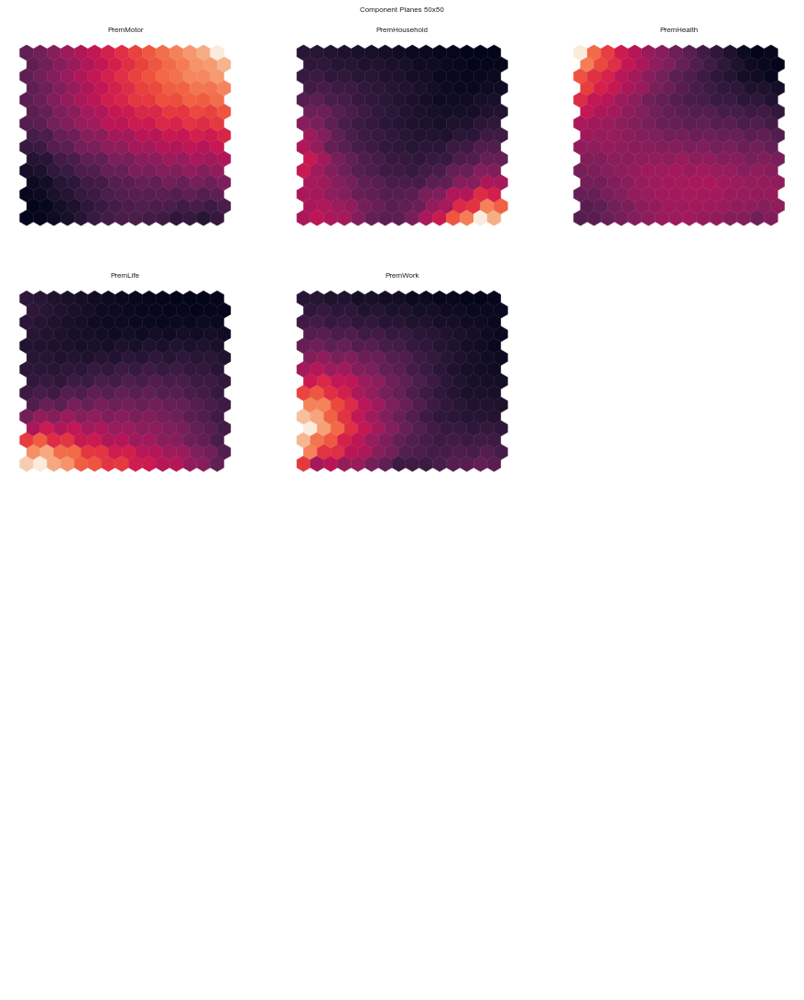

In [797]:
#Analyse these plots from the following perspectives:

#Feature importance
#Feature correlation (both globally and locally)
#Data distribution
#Outlier detection
SOM().plot_component_planes(weights=sm_product.codebook.matrix,features=product_features_new,
                      M=15,N=15,
                      figsize=(12,15),figlayout=(4,3),
                      title="Component Planes 50x50",
                      cmap=sns.color_palette("rocket", as_cmap=True))


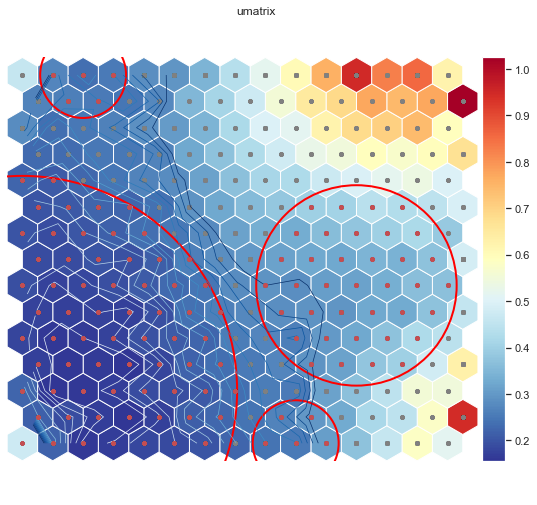

In [798]:
#red is an outlier 
#the av distance to the adjacent neighbours (the neighbours that are pegged to the neuron)
#the lower the distance the better, means that the

#Encode each neuron in the output space with the average distance to its neighbors in the input space.

#Analyse these plots from the following perspectives:

#Clusters of units
#Pontential outliers (units which are very distant from its neighbors and have low frequency)

SOM().u_matrix(sm_product, distance=3)

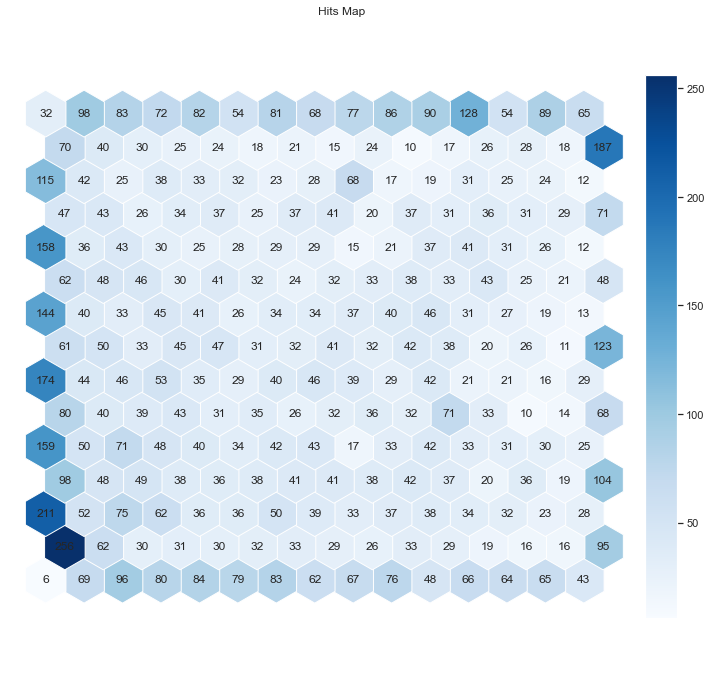

In [799]:
SOM().bmu(sm_product)

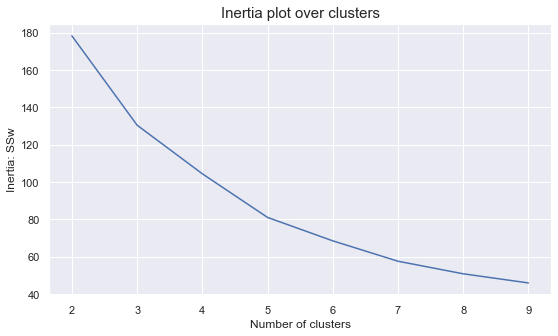

In [800]:
SOM().inertia(10,sm_product)

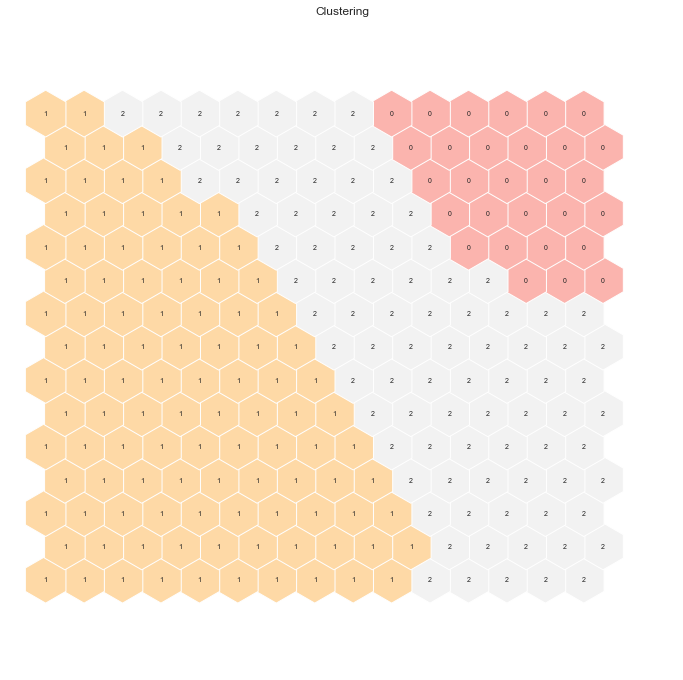

,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
label,,,,,
0,68.563055,410.787608,130.190545,120.542882,121.633991
1,491.873861,28.827145,79.649534,4.856924,4.302600
2,266.675300,218.504893,187.985223,42.071038,41.171683


In [801]:
SOM().kmeans(df_scale_minmax_outliers_removed,df_without_outliers,product_features_new,3,sm_product)[1]

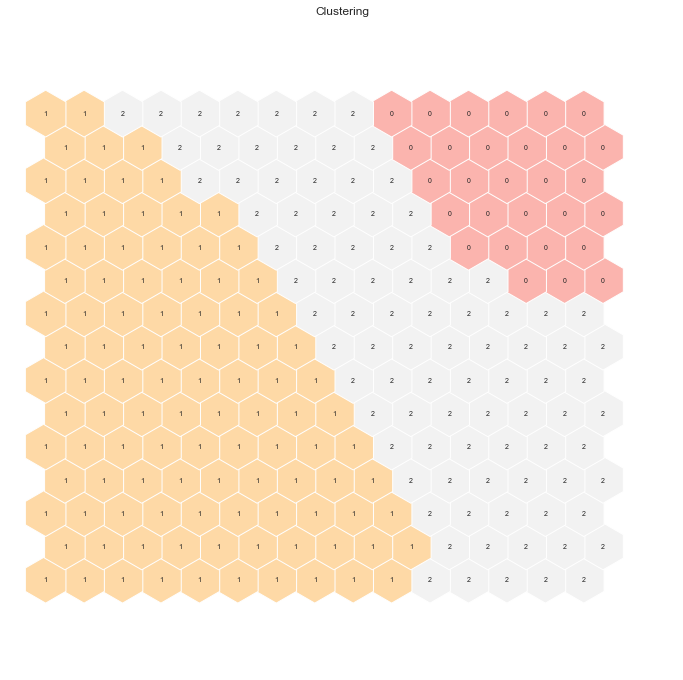

2    8236
1    1713
0     347
Name: label, dtype: int64

In [802]:
SOM().kmeans(df_scale_minmax_outliers_removed,df_with_outliers,product_features_new,3,sm_product)[0]['label'].value_counts()

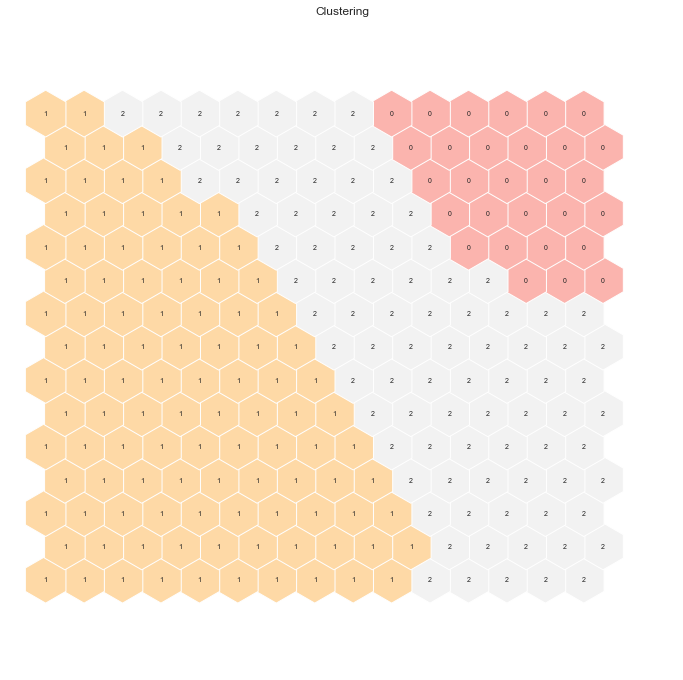

0.07716034708238746

In [803]:
SOM().kmeans(df_scale_minmax_outliers_removed,df_with_outliers,product_features_new,3,sm_product)[3]

In [804]:

df_scale_robust_outliers_removed['demo_labels3'] = demo_labels3
df_scale_robust_outliers_removed['demo_labels'] = demo_labels

df_scale_robust_outliers_removed['value_labels3'] = value_labels3
df_scale_robust_outliers_removed['value_labels'] = value_labels

df_scale_robust_outliers_removed['product_labels'] = product_labels



In [805]:
df_without_outliers['demo_labels3'] = demo_labels3
df_without_outliers['demo_labels'] = demo_labels

df_without_outliers['value_labels3'] = value_labels3
df_without_outliers['value_labels'] = value_labels

df_without_outliers['product_labels'] = product_labels

In [806]:
pd.DataFrame(df_scale_robust_outliers_removed.groupby(['demo_labels3','value_labels3', 'product_labels'])['demo_labels3'].count())

demo_labels3
demo_labels3         value_labels3      product_labels               
20s_with_Kids        High_Sal_High_CMV  Health                    199
                                        House_Life_Work            45
                                        Motor                     227
                     High_Sal_Low_CMV   Health                    318
                                        House_Life_Work            65
                                        Motor                     238
                     Low_Sal_Medium_CMV Health                    896
                                        House_Life_Work          1308
                                        Motor                     223
40s_with_Kids        High_Sal_High_CMV  Health                    319
                                        House_Life_Work           125
                                        Motor                    1125
                     High_Sal_Low_CMV   Health                    389
                                        House_Life_Work           123
                                        Motor                    1213
                     Low_Sal_Medium_CMV Health                     63
                                        House_Life_Work            38
                                        Motor                      45
Retired_without_Kids High_Sal_High_CMV  Health                    754
                                        House_Life_Work           310
                                        Motor                     485
                     High_Sal_Low_CMV   Health                    997
                                        House_Life_Work           258
                                        Motor                     527
                     Low_Sal_Medium_CMV Health                      3
                                        House_Life_Work             2
                                        Motor                       1

In [807]:
pd.DataFrame(df_scale_robust_outliers_removed.groupby(['demo_labels','value_labels', 'product_labels'])['demo_labels'].count())

demo_labels
demo_labels          value_labels          product_labels              
20s_with_Kids        High_Sal_High_CMV     Health                   559
                                           House_Life_Work          237
                                           Motor                   1123
                     High_Sal_Low_CMV      Health                     1
                                           Motor                      3
                     Low_Salary_High_CMV   Health                   119
                                           House_Life_Work           57
                                           Motor                    570
                     Medium_Sal_Medium_CMV House_Life_Work            1
30s_with_Kids        High_Sal_High_CMV     Health                    45
                                           House_Life_Work            7
                                           Motor                    186
                     High_Sal_Low_CMV      Health                     7
                                           House_Life_Work            3
                                           Motor                      4
                     Low_Salary_High_CMV   Health                   784
                                           House_Life_Work          207
                                           Motor                   1250
50s_with_Kids        High_Sal_High_CMV     Health                  1456
                                           House_Life_Work          454
                                           Motor                    690
                     High_Sal_Low_CMV      Health                     3
                                           Motor                      1
                     Low_Salary_High_CMV   Health                    12
                                           House_Life_Work            7
                                           Motor                      9
Retired_without_Kids High_Sal_High_CMV     Health                     4
                                           House_Life_Work            1
                     High_Sal_Low_CMV      Health                   120
                                           House_Life_Work          712
                                           Motor                     10
                     Low_Salary_High_CMV   Health                   828
                                           House_Life_Work          587
                                           Motor                    238
                     Medium_Sal_Medium_CMV House_Life_Work            1

In [808]:
pd.DataFrame(df_scale_robust_outliers_removed.groupby(['demo_labels3','value_labels', 'product_labels'])['demo_labels'].count())

demo_labels
demo_labels3         value_labels          product_labels              
20s_with_Kids        High_Sal_High_CMV     Health                    12
                                           House_Life_Work            3
                                           Motor                     12
                     High_Sal_Low_CMV      Health                   126
                                           House_Life_Work          714
                                           Motor                     13
                     Low_Salary_High_CMV   Health                  1275
                                           House_Life_Work          700
                                           Motor                    663
                     Medium_Sal_Medium_CMV House_Life_Work            1
40s_with_Kids        High_Sal_High_CMV     Health                   334
                                           House_Life_Work          139
                                           Motor                   1004
                     High_Sal_Low_CMV      Health                     2
                                           House_Life_Work            1
                                           Motor                      4
                     Low_Salary_High_CMV   Health                   435
                                           House_Life_Work          146
                                           Motor                   1375
Retired_without_Kids High_Sal_High_CMV     Health                  1718
                                           House_Life_Work          557
                                           Motor                    983
                     High_Sal_Low_CMV      Health                     3
                                           Motor                      1
                     Low_Salary_High_CMV   Health                    33
                                           House_Life_Work           12
                                           Motor                     29
                     Medium_Sal_Medium_CMV House_Life_Work            1

In [809]:
#df_centroids = df_scale_minmax_minus_outliers_removed.groupby(['demo_labels','value_labels', 'product_labels']).mean()

In [810]:
df_centroids = df_scale_robust_outliers_removed.groupby(['demo_labels3','value_labels3', 'product_labels']).mean()

In [811]:
hclust = AgglomerativeClustering(linkage='ward', affinity='euclidean', distance_threshold=0, n_clusters=None)
hclust_labels = hclust.fit_predict(df_centroids)

df_centroids['hclust_labels'] = hclust_labels

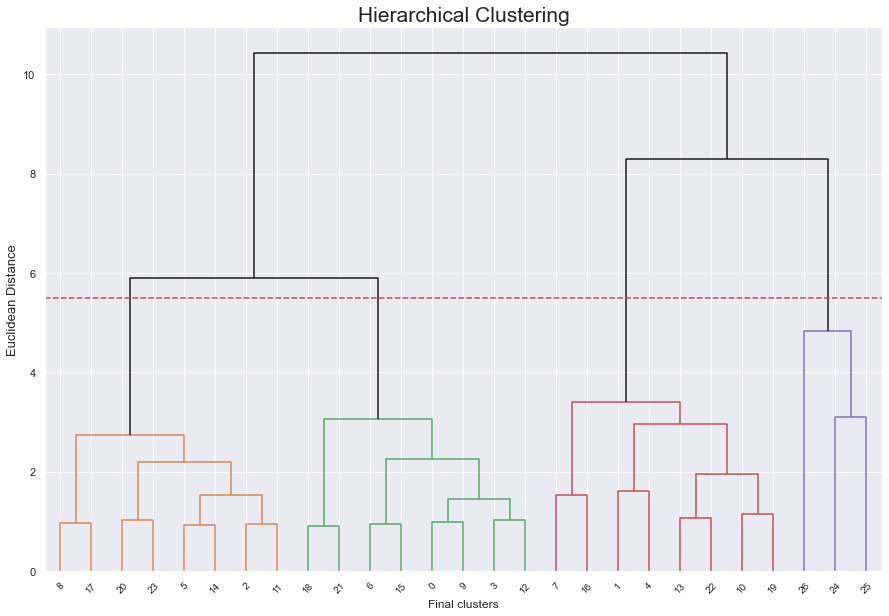

In [812]:
# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together # At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
# track the number of observations in the current cluster being formed 
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            current_count += 1 # leaf node
        else: 
            current_count += counts[child_idx - n_samples]
            counts[i] = current_count

linkage_matrix = np.column_stack([hclust.children_, hclust.distances_, counts]).astype(float)
# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(15,10))
# The Dendrogram parameters need to be tuned
y_threshold =5.5
dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed") 
plt.title('Hierarchical Clustering', fontsize=21)
plt.xlabel('Final clusters') 
plt.ylabel(f'Euclidean Distance', fontsize=13)
plt.show()

In [813]:
hclust = AgglomerativeClustering(linkage='ward', affinity='euclidean', n_clusters=4)

hclust_labels = hclust.fit_predict(df_centroids)

df_centroids['hclust_labels']=hclust_labels

In [814]:
cluster_mapper = df_centroids['hclust_labels'].to_dict()
df_without_outliers['merged_labels'] = df_without_outliers.apply(lambda row: cluster_mapper[(row['demo_labels3'], row['value_labels3'],row['product_labels'])], axis=1)
df_scale_robust_outliers_removed['merged_labels'] = df_scale_robust_outliers_removed.apply(lambda row: cluster_mapper[(row['demo_labels3'], row['value_labels3'],row['product_labels'])], axis=1)

df_scale_robust_outliers_removed.groupby('merged_labels').mean()
#cluster_mapper

,CustMonVal,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Age,Total_Prem,%MotorPrem,%HouseholdPrem,%HealthPrem,%LifePrem,%WorkPrem,AnnualSal,Salary_effort,EducDeg,Children
merged_labels,,,,,,,,,,,,,,,,,
0,-0.198750,-0.178652,0.346843,0.285850,0.399489,0.384683,0.636987,0.326915,-0.128377,0.225001,0.280158,0.271260,0.283947,0.628396,-0.026376,-0.544793,-0.665757
1,0.157359,-0.210779,0.304903,0.342120,0.444782,0.408762,-0.209744,0.278743,-0.172232,0.198408,0.395510,0.357319,0.355258,-0.097118,0.363469,-0.593173,-0.114391
2,0.178097,0.101458,0.243271,-0.189800,0.249208,0.239284,-0.048430,0.224288,0.167086,0.108204,-0.175603,0.096849,0.087733,-0.051759,0.555462,-0.557047,-0.245526
3,0.023827,-0.005418,0.119046,0.307042,0.096678,0.099366,-0.574328,0.100316,0.047210,0.040002,0.354862,0.013847,0.012735,-0.612122,1.099757,-0.328078,-0.066101


In [815]:
df_scale_robust_outliers_removed['merged_labels'].value_counts()

2    5364
0    2199
3    1649
1    1084
Name: merged_labels, dtype: int64

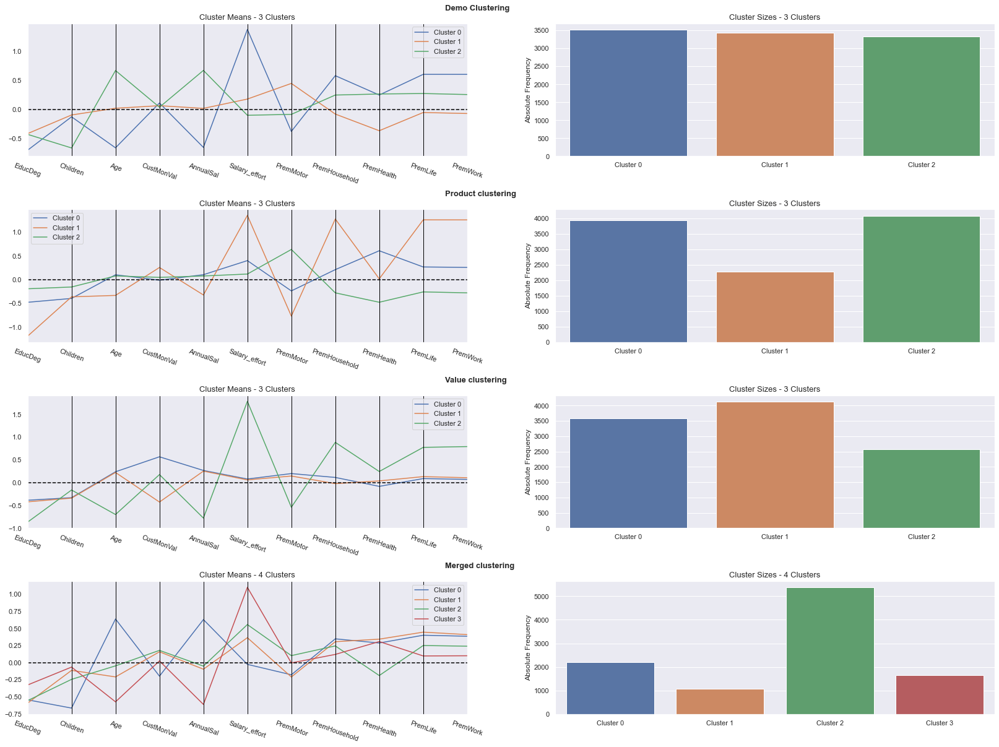

In [824]:
# Profilling each cluster (product, behavior, merged)
cluster_profiles(
    df = df_scale_robust_outliers_removed[demo_features_new+value_features_new+product_features_new + ['demo_labels3','product_labels', 'value_labels3','merged_labels']],
    label_columns = ['demo_labels3','product_labels', 'value_labels3','merged_labels'], 
    figsize = (28, 20), 
    compar_titles = ['Demo Clustering',"Product clustering", "Value clustering",'Merged clustering'])

<a class="anchor" id="Conclusion">

### 4.4. Conclusion

</a>